# Credit Card Fraud Detection Using Machine Learning Techniques

The persistent challenge of credit card fraud continues to undermine financial security,
demanding the development of advanced and effective detection strategies. This research
delves into the application of sophisticated machine learning models to enhance the accuracy
and efficiency of fraud detection in credit card transactions. By leveraging a dataset comprising
both legitimate and fraudulent transactions, this study explores various techniques aimed at
optimizing predictive performance. The research methodology encompasses thorough data preprocessing,
including feature selection, normalization, and addressing class imbalance through
techniques like Synthetic Minority Over-sampling Technique (SMOTE). A diverse set of
machine learning models were implemented, including ensemble methods like Random Forest,
XGBoost, and AdaBoost, alongside classifiers such as Support Vector Machine (SVM), KNearest
Neighbors (KNN), Artificial Neural Networks (ANN), and Logistic Regression. These
models were selected for their proven efficacy in handling imbalanced datasets—a common
challenge in fraud detection. Model performance was rigorously evaluated using a
comprehensive set of metrics, including accuracy, precision, recall, F1-score, and particularly
the ROC-AUC score, which is crucial for assessing the effectiveness of models in imbalanced
datasets. The results demonstrated that ensemble models, especially XGBoost and CatBoost,
delivered superior performance, striking an optimal balance between detection capability and
computational efficiency. The study underscores the critical role of SMOTE in improving the
models' sensitivity to detecting fraudulent transactions, thereby mitigating the impact of class
imbalance on predictive performance. The findings suggest that a combined approach utilizing
multiple machine learning models may offer a robust solution to the complex problem of credit
card fraud detection. This research contributes to the growing body of knowledge on financial
fraud detection by demonstrating the potential of machine learning models to revolutionize
fraud detection processes. The outcomes offer significant implications for financial institutions,
highlighting the potential for enhanced security and operational efficiency through the adoption
of advanced machine learning techniques

In [30]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from collections import Counter
import matplotlib.pyplot as plt


from collections import Counter

from sklearn.svm import SVC, LinearSVC
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, matthews_corrcoef, balanced_accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, IsolationForest
from sklearn.naive_bayes import GaussianNB
from sklearn.calibration import CalibratedClassifierCV
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.utils.class_weight import compute_class_weight
from sklearn.linear_model import LogisticRegression


import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

import plotly.graph_objs as go
from plotly.offline import iplot
import plotly.figure_factory as ff

import xgboost as xgb
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

pd.set_option('display.max_columns', 100)


RFC_METRIC = 'gini'
NUM_ESTIMATORS = 100
NO_JOBS = 4
VALID_SIZE = 0.20
TEST_SIZE = 0.20
NUMBER_KFOLDS = 5
RANDOM_STATE = 2018
MAX_ROUNDS = 1000
EARLY_STOP = 50
OPT_ROUNDS = 1000
VERBOSE_EVAL = 50


# READ THE DATA

In [24]:
data_df = pd.read_csv('creditcard.csv')


# CHECK THE DATA 

In [25]:
print("Credit Card Fraud Detection data -  rows:",data_df.shape[0]," columns:", data_df.shape[1])

Credit Card Fraud Detection data -  rows: 284807  columns: 31


# Data Overview

In [26]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [27]:
data_df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [28]:
data_df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,2.239053e-15,1.673327e-15,-1.247012e-15,8.190001e-16,1.207294e-15,4.887456e-15,1.437716e-15,-3.772171e-16,9.564149e-16,1.039917e-15,6.406204e-16,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,1.020713e+00,9.992014e-01,9.952742e-01,9.585956e-01,9.153160e-01,8.762529e-01,8.493371e-01,8.381762e-01,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,-4.797473e+00,-1.868371e+01,-5.791881e+00,-1.921433e+01,-4.498945e+00,-1.412985e+01,-2.516280e+01,-9.498746e+00,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,-7.624942e-01,-4.055715e-01,-6.485393e-01,-4.255740e-01,-5.828843e-01,-4.680368e-01,-4.837483e-01,-4.988498e-01,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,-3.275735e-02,1.400326e-01,-1.356806e-02,5.060132e-02,4.807155e-02,6.641332e-02,-6.567575e-02,-3.636312e-03,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,7.395934e-01,6.182380e-01,6.625050e-01,4.931498e-01,6.488208e-01,5.232963e-01,3.996750e-01,5.008067e-01,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,1.201891e+01,7.848392e+00,7.126883e+00,1.052677e+01,8.877742e+00,1.731511e+01,9.253526e+00,5.041069e+00,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


Original class distribution: Counter({0: 227451, 1: 394})


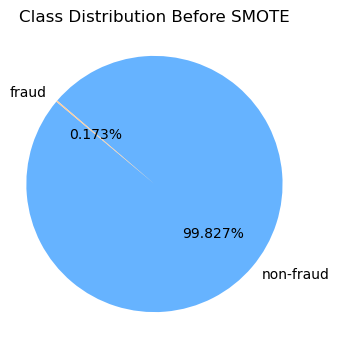

In [34]:
X = data_df.drop('Class', axis=1)  
y = data_df['Class'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

counter = Counter(y_train)
print(f'Original class distribution: {counter}')

labels = ['non-fraud', 'fraud']
sizes = [counter[0], counter[1]]
colors = ['#66b3ff', '#ffcc99']

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.3f%%', startangle=140)
plt.axis('equal')  
plt.title('Class Distribution Before SMOTE')
plt.show()

Class distribution after SMOTE: Counter({0: 227451, 1: 227451})


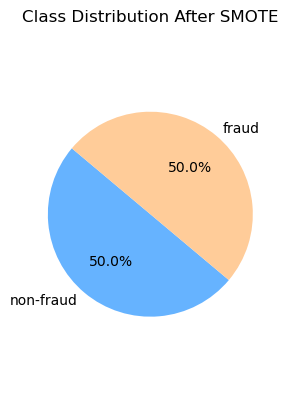

In [35]:
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

counter_smote = Counter(y_train_smote)
print(f'Class distribution after SMOTE: {counter_smote}')


labels = ['non-fraud', 'fraud']
sizes = [counter_smote[0], counter_smote[1]]
colors = ['#66b3ff','#ffcc99']

plt.subplot(1, 2, 2)
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.axis('equal')
plt.title('Class Distribution After SMOTE')

plt.show()


# Check Missing Data 

In [8]:
total = data_df.isnull().sum().sort_values(ascending=False)
percent = (data_df.isnull().sum() / data_df.isnull().count() * 100).sort_values(ascending=False)
pd.concat([total, percent], axis=1, keys=['Total', 'Percent']).transpose()


,Time,V16,Amount,V28,V27,V26,V25,V24,V23,V22,V21,V20,V19,V18,V17,V15,V1,V14,V13,V12,V11,V10,V9,V8,V7,V6,V5,V4,V3,V2,Class
Total,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Percent,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


There is no missing data 

# Exploring Data Disparities

In [9]:
temp = data_df["Class"].value_counts()
df = pd.DataFrame({'Class': temp.index, 'values': temp.values})

trace = go.Bar(
    x=df['Class'], y=df['values'],
    name="Credit Card Fraud Class - data unbalance (Not fraud = 0, Fraud = 1)",
    marker=dict(color="green"),
    text=df['values']
)
data = [trace]
layout = dict(title='Credit Card Fraud Class - data unbalance (Not fraud = 0, Fraud = 1)',
              xaxis=dict(title='Class', showticklabels=True),
              yaxis=dict(title='Number of transactions'),
              hovermode='closest', width=600
             )
fig = dict(data=data, layout=layout)
iplot(fig, filename='class')

The performance of this model looks quite impressive. The ROC AUC score of 0.923 indicates that our model is quite successful in fraud detection. Our overall accuracy rate is almost 100%

# Data Exploration


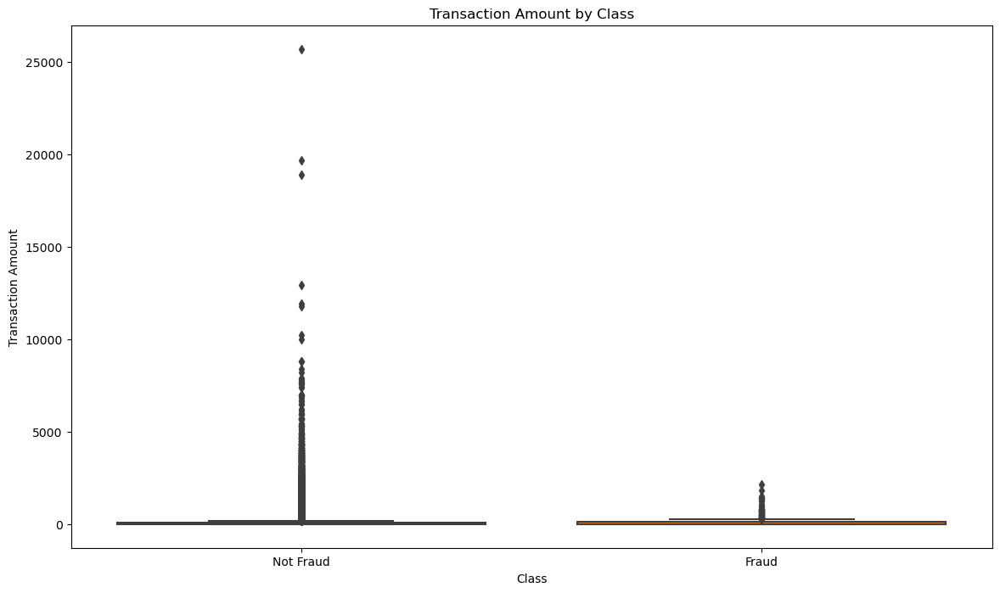

In [10]:
class_0 = data_df.loc[data_df['Class'] == 0]["Time"]
class_1 = data_df.loc[data_df['Class'] == 1]["Time"]

hist_data = [class_0, class_1]
group_labels = ['Not Fraud', 'Fraud']

fig = ff.create_distplot(hist_data, group_labels, show_hist=False, show_rug=False)
fig['layout'].update(title='Credit Card Transactions Time Density Plot', xaxis=dict(title='Time [s]'))
iplot(fig, filename='dist_only')

plt.figure(figsize=(14, 8))
sns.boxplot(x="Class", y="Amount", data=data_df)
plt.title('Transaction Amount by Class')
plt.xlabel('Class')
plt.ylabel('Transaction Amount')
plt.xticks([0, 1], ['Not Fraud', 'Fraud'])
plt.show()

In [11]:
data_df['Hour'] = data_df['Time'].apply(lambda x: np.floor(x / 3600))

tmp = data_df.groupby(['Hour', 'Class'])['Amount'].aggregate(['min', 'max', 'count', 'sum', 'mean', 'median', 'var']).reset_index()
df = pd.DataFrame(tmp)
df.columns = ['Hour', 'Class', 'Min', 'Max', 'Transactions', 'Sum', 'Mean', 'Median', 'Var']
df.head()

,Hour,Class,Min,Max,Transactions,Sum,Mean,Median,Var
0,0.0,0,0.0,7712.43,3961,256572.87,64.774772,12.990,45615.821201
1,0.0,1,0.0,529.00,2,529.00,264.500000,264.500,139920.500000
2,1.0,0,0.0,1769.69,2215,145806.76,65.826980,22.820,20053.615770
3,1.0,1,59.0,239.93,2,298.93,149.465000,149.465,16367.832450
4,2.0,0,0.0,4002.88,1555,106989.39,68.803466,17.900,45355.430437


This table effectively summarizes the transaction data, offering valuable insights into the distribution and characteristics of transactions across different hours. This information is crucial for understanding patterns in fraudulent activity and can help in refining our fraud detection models.

# Total Amount of Transactions by Hour

   Hour  Class   Min      Max  Transactions        Sum        Mean   Median  \
0   0.0      0   0.0  7712.43          3961  256572.87   64.774772   12.990   
1   0.0      1   0.0   529.00             2     529.00  264.500000  264.500   
2   1.0      0   0.0  1769.69          2215  145806.76   65.826980   22.820   
3   1.0      1  59.0   239.93             2     298.93  149.465000  149.465   
4   2.0      0   0.0  4002.88          1555  106989.39   68.803466   17.900   

             Var  
0   45615.821201  
1  139920.500000  
2   20053.615770  
3   16367.832450  
4   45355.430437  


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



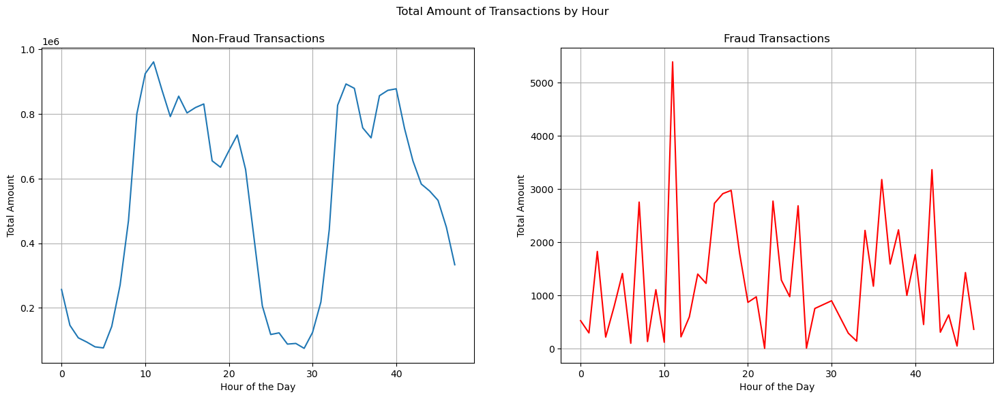

In [12]:
data_df['Hour'] = data_df['Time'].apply(lambda x: np.floor(x / 3600))


agg_funcs = ['min', 'max', 'count', 'sum', 'mean', 'median', 'var']
tmp = data_df.groupby(['Hour', 'Class'])['Amount'].aggregate(agg_funcs).reset_index()
df = pd.DataFrame(tmp)
df.columns = ['Hour', 'Class', 'Min', 'Max', 'Transactions', 'Sum', 'Mean', 'Median', 'Var']


print(df.head())

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(18,6))

sns.lineplot(ax = ax1, x="Hour", y="Sum", data=df.loc[df.Class==0])
ax1.set_title('Non-Fraud Transactions')
ax1.set_xlabel('Hour of the Day')
ax1.set_ylabel('Total Amount')
ax1.grid(True)

sns.lineplot(ax = ax2, x="Hour", y="Sum", data=df.loc[df.Class==1], color="red")
ax2.set_title('Fraud Transactions')
ax2.set_xlabel('Hour of the Day')
ax2.set_ylabel('Total Amount')
ax2.grid(True)

plt.suptitle("Total Amount of Transactions by Hour")
plt.show()

# Total Number of Transactions by Hour

   Hour  Class   Min      Max  Transactions        Sum        Mean   Median  \
0   0.0      0   0.0  7712.43          3961  256572.87   64.774772   12.990   
1   0.0      1   0.0   529.00             2     529.00  264.500000  264.500   
2   1.0      0   0.0  1769.69          2215  145806.76   65.826980   22.820   
3   1.0      1  59.0   239.93             2     298.93  149.465000  149.465   
4   2.0      0   0.0  4002.88          1555  106989.39   68.803466   17.900   

             Var  
0   45615.821201  
1  139920.500000  
2   20053.615770  
3   16367.832450  
4   45355.430437  


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



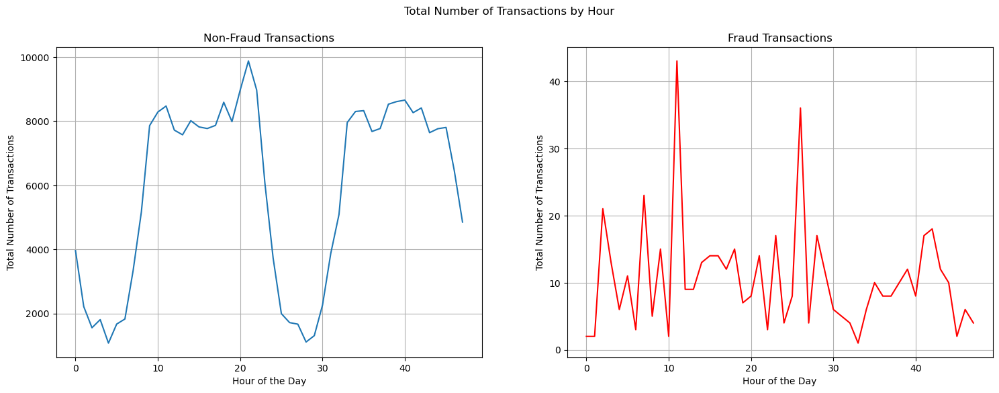

In [13]:
print(df.head())

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(18,6))

sns.lineplot(ax = ax1, x="Hour", y="Transactions", data=df.loc[df.Class==0])
ax1.set_title('Non-Fraud Transactions')
ax1.set_xlabel('Hour of the Day')
ax1.set_ylabel('Total Number of Transactions')
ax1.grid(True)

sns.lineplot(ax = ax2, x="Hour", y="Transactions", data=df.loc[df.Class==1], color="red")
ax2.set_title('Fraud Transactions')
ax2.set_xlabel('Hour of the Day')
ax2.set_ylabel('Total Number of Transactions')
ax2.grid(True)

plt.suptitle("Total Number of Transactions by Hour")
plt.show()

# Average Amount of Transactions by Hour

   Hour  Class   Min      Max  Transactions        Sum        Mean   Median  \
0   0.0      0   0.0  7712.43          3961  256572.87   64.774772   12.990   
1   0.0      1   0.0   529.00             2     529.00  264.500000  264.500   
2   1.0      0   0.0  1769.69          2215  145806.76   65.826980   22.820   
3   1.0      1  59.0   239.93             2     298.93  149.465000  149.465   
4   2.0      0   0.0  4002.88          1555  106989.39   68.803466   17.900   

             Var  
0   45615.821201  
1  139920.500000  
2   20053.615770  
3   16367.832450  
4   45355.430437  


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



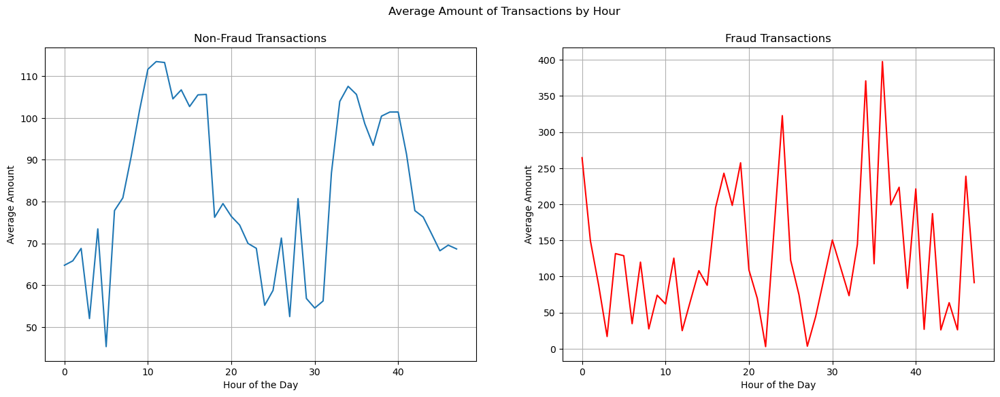

In [14]:
print(df.head())

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(18,6))

sns.lineplot(ax = ax1, x="Hour", y="Mean", data=df.loc[df.Class==0])
ax1.set_title('Non-Fraud Transactions')
ax1.set_xlabel('Hour of the Day')
ax1.set_ylabel('Average Amount')
ax1.grid(True)

sns.lineplot(ax = ax2, x="Hour", y="Mean", data=df.loc[df.Class==1], color="red")
ax2.set_title('Fraud Transactions')
ax2.set_xlabel('Hour of the Day')
ax2.set_ylabel('Average Amount')
ax2.grid(True)

plt.suptitle("Average Amount of Transactions by Hour")
plt.show()

# Maximum Amount of Transactions by Hour

   Hour  Class   Min      Max  Transactions        Sum        Mean   Median  \
0   0.0      0   0.0  7712.43          3961  256572.87   64.774772   12.990   
1   0.0      1   0.0   529.00             2     529.00  264.500000  264.500   
2   1.0      0   0.0  1769.69          2215  145806.76   65.826980   22.820   
3   1.0      1  59.0   239.93             2     298.93  149.465000  149.465   
4   2.0      0   0.0  4002.88          1555  106989.39   68.803466   17.900   

             Var  
0   45615.821201  
1  139920.500000  
2   20053.615770  
3   16367.832450  
4   45355.430437  


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



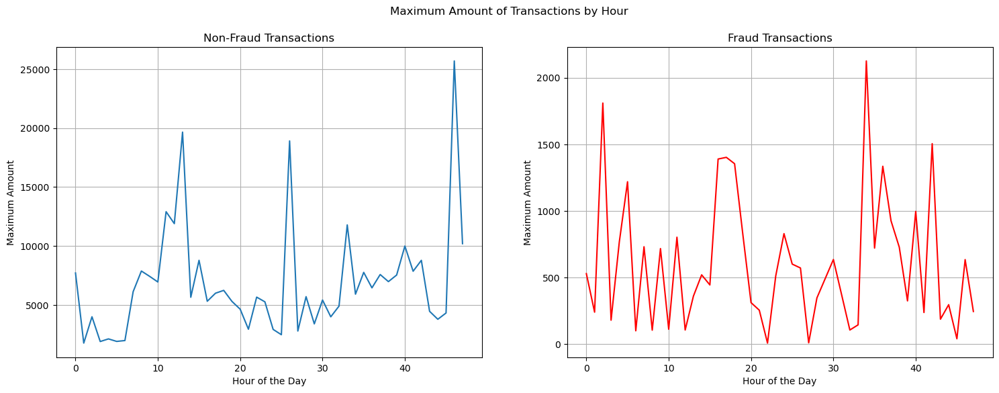

In [15]:
print(df.head())

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(18,6))

sns.lineplot(ax = ax1, x="Hour", y="Max", data=df.loc[df.Class==0])
ax1.set_title('Non-Fraud Transactions')
ax1.set_xlabel('Hour of the Day')
ax1.set_ylabel('Maximum Amount')
ax1.grid(True)

sns.lineplot(ax = ax2, x="Hour", y="Max", data=df.loc[df.Class==1], color="red")
ax2.set_title('Fraud Transactions')
ax2.set_xlabel('Hour of the Day')
ax2.set_ylabel('Maximum Amount')
ax2.grid(True)

plt.suptitle("Maximum Amount of Transactions by Hour")
plt.show()

# Median Amount of Transactions by Hour

   Hour  Class   Min      Max  Transactions        Sum        Mean   Median  \
0   0.0      0   0.0  7712.43          3961  256572.87   64.774772   12.990   
1   0.0      1   0.0   529.00             2     529.00  264.500000  264.500   
2   1.0      0   0.0  1769.69          2215  145806.76   65.826980   22.820   
3   1.0      1  59.0   239.93             2     298.93  149.465000  149.465   
4   2.0      0   0.0  4002.88          1555  106989.39   68.803466   17.900   

             Var  
0   45615.821201  
1  139920.500000  
2   20053.615770  
3   16367.832450  
4   45355.430437  


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



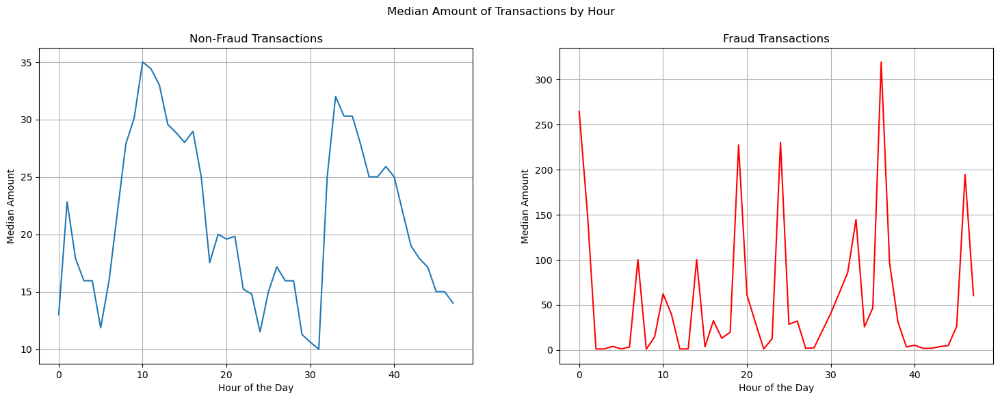

In [16]:
print(df.head())

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(18,6))

sns.lineplot(ax = ax1, x="Hour", y="Median", data=df.loc[df.Class==0])
ax1.set_title('Non-Fraud Transactions')
ax1.set_xlabel('Hour of the Day')
ax1.set_ylabel('Median Amount')
ax1.grid(True)

sns.lineplot(ax = ax2, x="Hour", y="Median", data=df.loc[df.Class==1], color="red")
ax2.set_title('Fraud Transactions')
ax2.set_xlabel('Hour of the Day')
ax2.set_ylabel('Median Amount')
ax2.grid(True)

plt.suptitle("Median Amount of Transactions by Hour")
plt.show()

# Minimum Amount of Transactions by Hour

   Hour  Class   Min      Max  Transactions        Sum        Mean   Median  \
0   0.0      0   0.0  7712.43          3961  256572.87   64.774772   12.990   
1   0.0      1   0.0   529.00             2     529.00  264.500000  264.500   
2   1.0      0   0.0  1769.69          2215  145806.76   65.826980   22.820   
3   1.0      1  59.0   239.93             2     298.93  149.465000  149.465   
4   2.0      0   0.0  4002.88          1555  106989.39   68.803466   17.900   

             Var  
0   45615.821201  
1  139920.500000  
2   20053.615770  
3   16367.832450  
4   45355.430437  


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



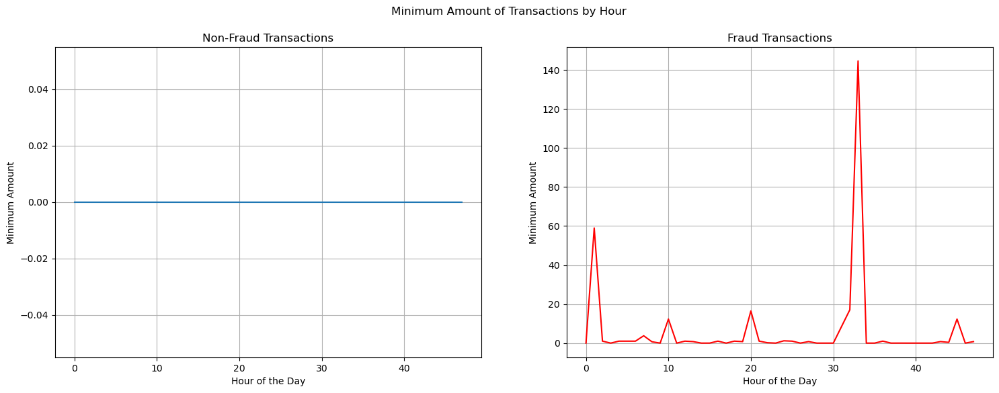

In [17]:
print(df.head())

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(18,6))

sns.lineplot(ax = ax1, x="Hour", y="Min", data=df.loc[df.Class==0])
ax1.set_title('Non-Fraud Transactions')
ax1.set_xlabel('Hour of the Day')
ax1.set_ylabel('Minimum Amount')
ax1.grid(True)

sns.lineplot(ax = ax2, x="Hour", y="Min", data=df.loc[df.Class==1], color="red")
ax2.set_title('Fraud Transactions')
ax2.set_xlabel('Hour of the Day')
ax2.set_ylabel('Minimum Amount')
ax2.grid(True)

plt.suptitle("Minimum Amount of Transactions by Hour")
plt.show()

# Transactions amount

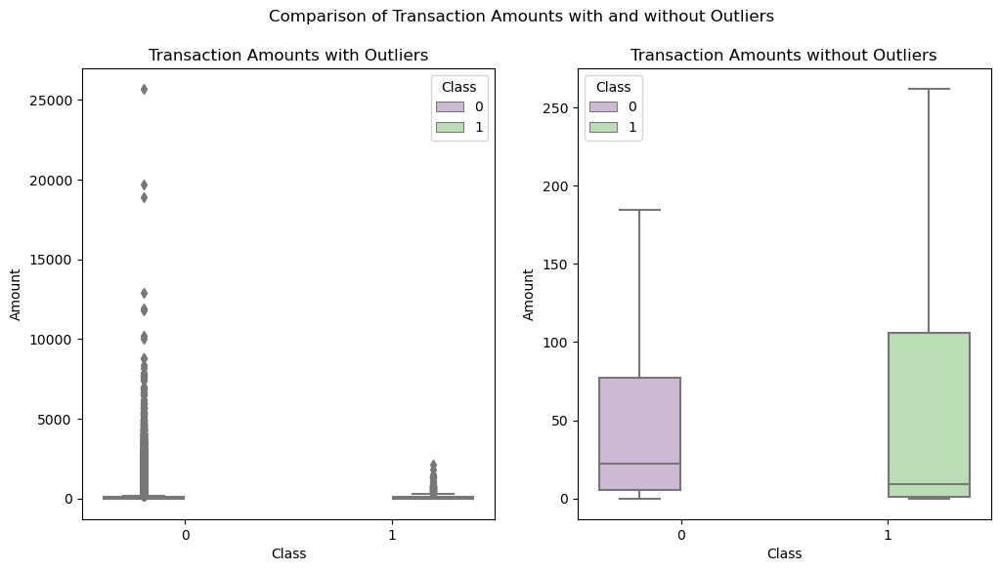

In [18]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))

sns.boxplot(ax = ax1, x="Class", y="Amount", hue="Class", data=data_df, palette="PRGn", showfliers=True)
ax1.set_title('Transaction Amounts with Outliers')
ax1.set_xlabel('Class')
ax1.set_ylabel('Amount')
ax1.legend(title='Class')

sns.boxplot(ax = ax2, x="Class", y="Amount", hue="Class", data=data_df, palette="PRGn", showfliers=False)
ax2.set_title('Transaction Amounts without Outliers')
ax2.set_xlabel('Class')
ax2.set_ylabel('Amount')
ax2.legend(title='Class')

plt.suptitle("Comparison of Transaction Amounts with and without Outliers")
plt.show()

In [19]:
tmp = data_df[['Amount', 'Class']].copy()

class_0 = tmp.loc[tmp['Class'] == 0]['Amount']

class_1 = tmp.loc[tmp['Class'] == 1]['Amount']

class_0_summary = class_0.describe()
print("Non-Fraudulent Transactions Summary:")
print(class_0_summary)

class_1_summary = class_1.describe()
print("\nFraudulent Transactions Summary:")
print(class_1_summary)

summary_df = pd.DataFrame({
    "Non-Fraudulent Transactions": class_0_summary,
    "Fraudulent Transactions": class_1_summary
})

print("\nComparison of Non-Fraudulent and Fraudulent Transactions:")
print(summary_df)

Non-Fraudulent Transactions Summary:
count    284315.000000
mean         88.291022
std         250.105092
min           0.000000
25%           5.650000
50%          22.000000
75%          77.050000
max       25691.160000
Name: Amount, dtype: float64

Fraudulent Transactions Summary:
count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64

Comparison of Non-Fraudulent and Fraudulent Transactions:
       Non-Fraudulent Transactions  Fraudulent Transactions
count                284315.000000               492.000000
mean                     88.291022               122.211321
std                     250.105092               256.683288
min                       0.000000                 0.000000
25%                       5.650000                 1.000000
50%                      22.000000                 9.250000
75%                      77.050000      

# Features Correlation

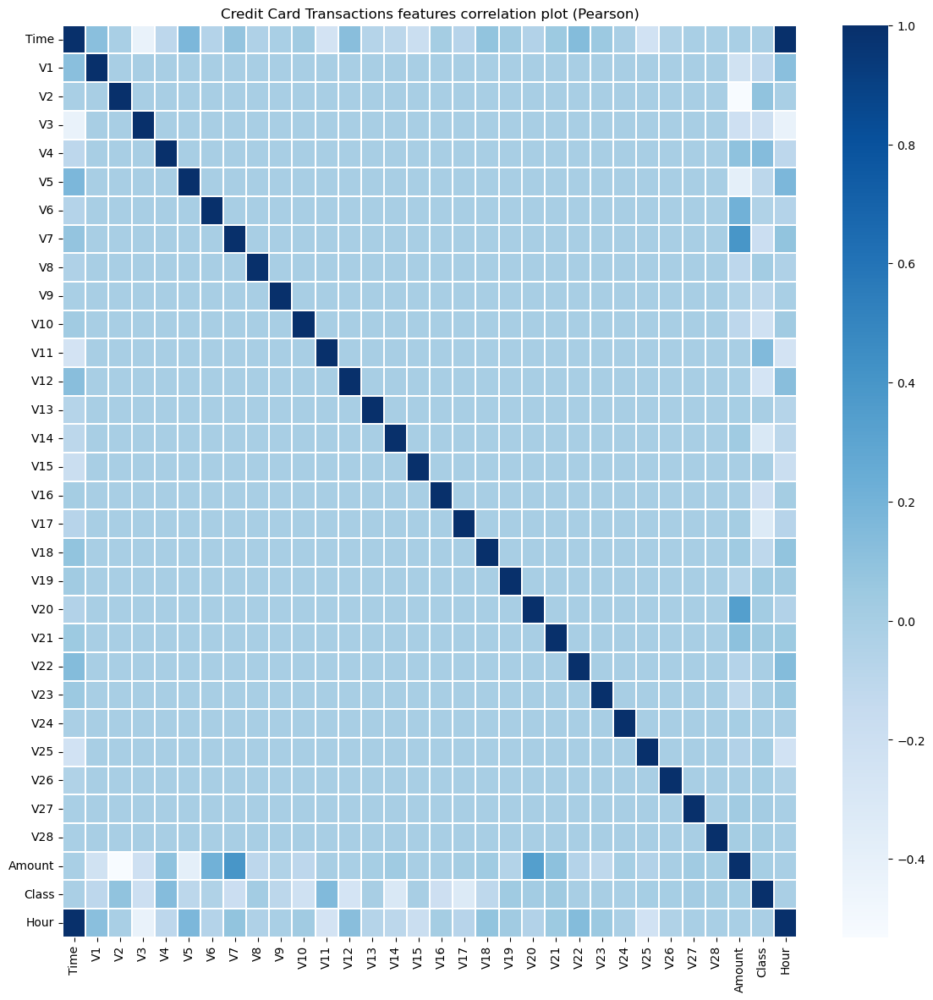

In [21]:
plt.figure(figsize = (14,14))
plt.title('Credit Card Transactions features correlation plot (Pearson)')
corr = data_df.corr()
sns.heatmap(corr,xticklabels=corr.columns,yticklabels=corr.columns,linewidths=.1,cmap="Blues")
plt.show()

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



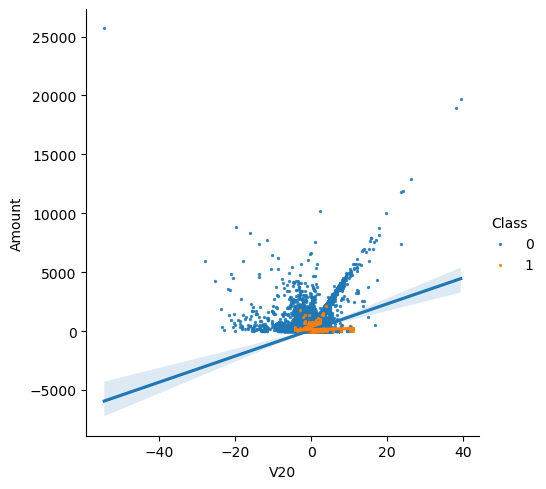

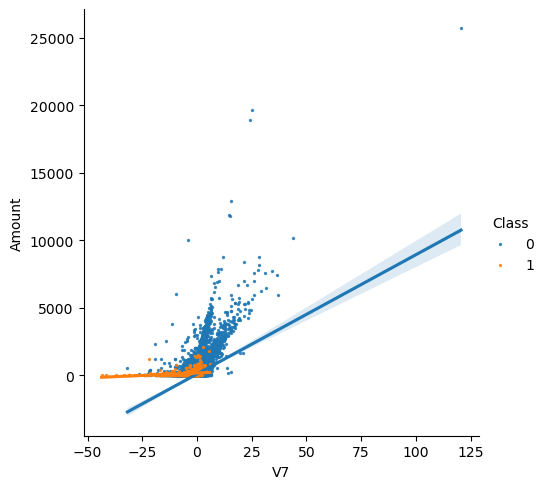

In [22]:
s = sns.lmplot(x='V20', y='Amount',data=data_df, hue='Class', fit_reg=True,scatter_kws={'s':2})
s = sns.lmplot(x='V7', y='Amount',data=data_df, hue='Class', fit_reg=True,scatter_kws={'s':2})
plt.show()


V20 vs. Amount:
From the first graph, we can observe a positive linear relationship between V20 and Amount. As the value of V20 increases, the transaction amount also tends to increase. Interestingly, fraudulent transactions (indicated by orange dots) are mostly clustered at lower V20 values and lower amounts, while non-fraudulent transactions (indicated by blue dots) are more dispersed across higher V20 values and amounts. This pattern suggests that V20 could be a significant feature in distinguishing between fraudulent and non-fraudulent transactions.

V7 vs. Amount:
Similarly, the second graph shows a positive linear relationship between V7 and Amount. Higher values of V7 are associated with higher transaction amounts. Fraudulent transactions, again represented by orange dots, are primarily found at lower V7 values and amounts. In contrast, non-fraudulent transactions (blue dots) are spread across a wider range of V7 values and amounts. This indicates that V7 might also play a crucial role in identifying fraudulent transactions.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



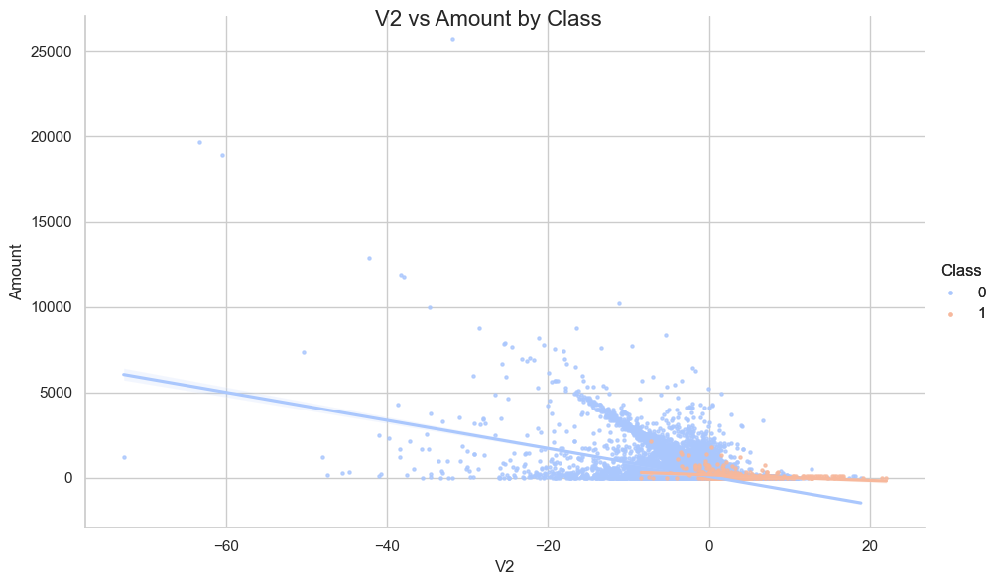

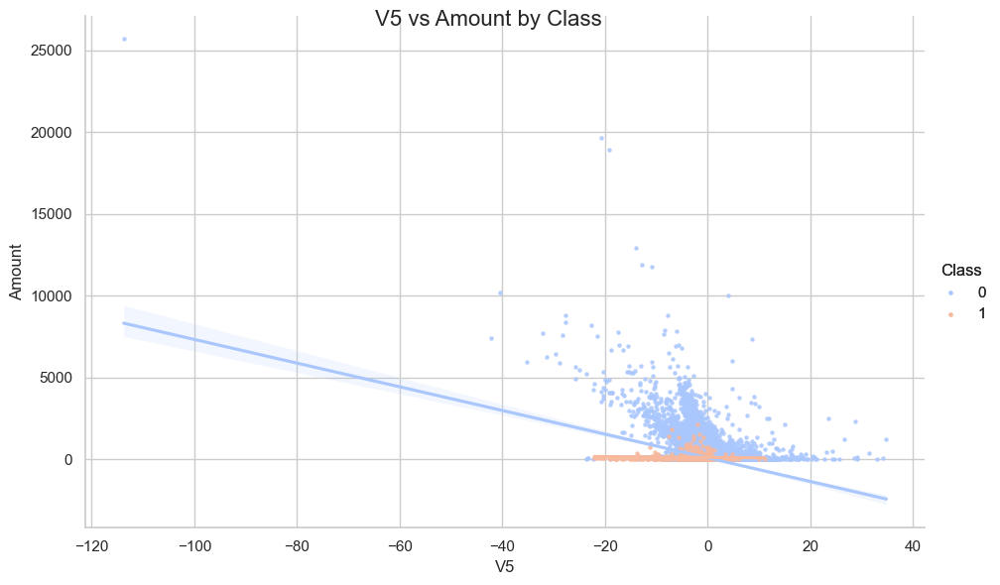

In [23]:
sns.set(style="whitegrid")

s1 = sns.lmplot(
    x='V2', y='Amount', data=data_df, hue='Class', fit_reg=True, scatter_kws={'s':5}, height=6, aspect=1.5,
    palette="coolwarm"
)
s1.set_axis_labels("V2", "Amount")
s1.fig.suptitle('V2 vs Amount by Class', fontsize=16)
s1.add_legend(title="Class")

s2 = sns.lmplot(
    x='V5', y='Amount', data=data_df, hue='Class', fit_reg=True, scatter_kws={'s':5}, height=6, aspect=1.5,
    palette="coolwarm"
)
s2.set_axis_labels("V5", "Amount")
s2.fig.suptitle('V5 vs Amount by Class', fontsize=16)
s2.add_legend(title="Class")

plt.show()

# Features Density Plot

/var/folders/_x/dv4pbcy54ssfgw76pnj6ng4w0000gn/T/ipykernel_27178/2833174358.py:20: UserWarning:



The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.5`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/var/folders/_x/dv4pbcy54ssfgw76pnj6ng4w0000gn/T/ipykernel_27178/2833174358.py:21: UserWarning:



The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.5`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will b

/var/folders/_x/dv4pbcy54ssfgw76pnj6ng4w0000gn/T/ipykernel_27178/2833174358.py:21: UserWarning:



The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.5`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/var/folders/_x/dv4pbcy54ssfgw76pnj6ng4w0000gn/T/ipykernel_27178/2833174358.py:20: UserWarning:



The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.5`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will b

/var/folders/_x/dv4pbcy54ssfgw76pnj6ng4w0000gn/T/ipykernel_27178/2833174358.py:21: UserWarning:



The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.5`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/var/folders/_x/dv4pbcy54ssfgw76pnj6ng4w0000gn/T/ipykernel_27178/2833174358.py:20: UserWarning:



The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.5`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will b

/var/folders/_x/dv4pbcy54ssfgw76pnj6ng4w0000gn/T/ipykernel_27178/2833174358.py:21: UserWarning:



The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.5`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/var/folders/_x/dv4pbcy54ssfgw76pnj6ng4w0000gn/T/ipykernel_27178/2833174358.py:20: UserWarning:



The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.5`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will b

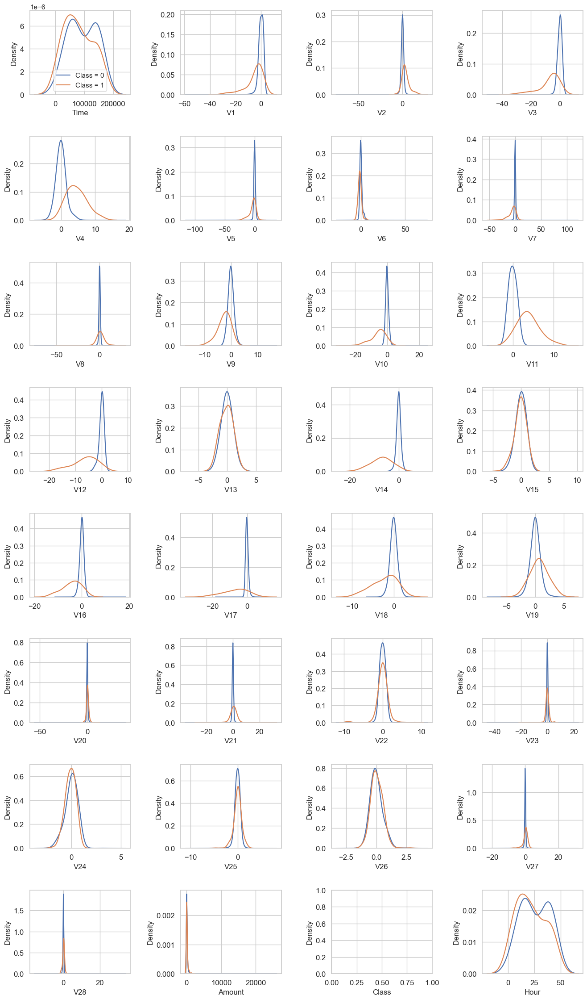

In [24]:
;
columns = data_df.columns.values


class_0 = data_df[data_df['Class'] == 0]
class_1 = data_df[data_df['Class'] == 1]

sns.set_style('whitegrid')


fig, axes = plt.subplots(8, 4, figsize=(16, 28))
fig.subplots_adjust(hspace=0.5, wspace=0.5)  


for idx, feature in enumerate(columns):
    row = idx // 4
    col = idx % 4
    ax = axes[row, col]
    sns.kdeplot(class_0[feature], bw=0.5, label="Class = 0", ax=ax)
    sns.kdeplot(class_1[feature], bw=0.5, label="Class = 1", ax=ax)
    ax.set_xlabel(feature, fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12)
    if idx == 0:  
        ax.legend()


plt.show()

Conclusion:
The analysis confirms that certain features, like V4 and V11, are highly effective in distinguishing between fraudulent and legitimate transactions. Features with partially separated or distinct profiles still hold value and should be considered in the model. However, features with similar profiles across both classes, like V25, V26, and V28, might be less useful and can be considered for exclusion to simplify the model. Understanding the general distribution patterns of these features is crucial for building a robust fraud detection model. The skewness observed in fraudulent transactions' features is particularly useful for identifying anomalies and potential fraud.


# Predictive Models

In [25]:
target = 'Class'
predictors = ['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',\
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19',\
       'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28',\
       'Amount']

# Split data in train, test and validation set;


In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

smote = SMOTE(sampling_strategy={1: 1000}, random_state=42)
X_train_smoted, y_train_smoted = smote.fit_resample(X_train, y_train)


undersample = RandomUnderSampler(random_state=42)
X_train_balanced, y_train_balanced = undersample.fit_resample(X_train_smoted, y_train_smoted)


model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_balanced, y_train_balanced)


y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]


print(classification_report(y_test, y_pred))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba))


NameError: name 'X' is not defined

# 1- Random Forest Classifier

In [28]:
clf = RandomForestClassifier(n_jobs=NO_JOBS, 
                             random_state=RANDOM_STATE,
                             criterion=RFC_METRIC,
                             n_estimators=NUM_ESTIMATORS,
                             verbose=False)





In [29]:
clf.fit(train_df[predictors], train_df[target].values)
preds = clf.predict(valid_df[predictors])

# Features Importance

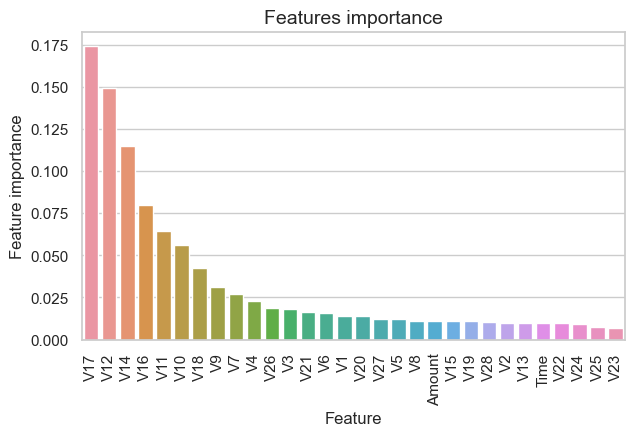

In [30]:
tmp = pd.DataFrame({'Feature': predictors, 'Feature importance': clf.feature_importances_})
tmp = tmp.sort_values(by='Feature importance',ascending=False)
plt.figure(figsize = (7,4))
plt.title('Features importance',fontsize=14)
s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
plt.show()

The most important features are V17, V12, V14, V10, V11, V16.

# Confusion Matrix

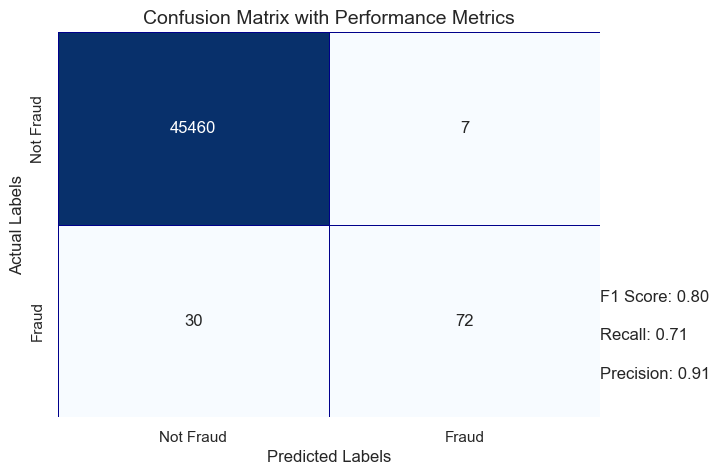

In [31]:
cm = pd.crosstab(valid_df[target].values, preds, rownames=['Actual'], colnames=['Predicted'])

report = classification_report(valid_df[target], preds, output_dict=True)
precision = report['1']['precision']
recall = report['1']['recall']
f1_score = report['1']['f1-score']

fig, ax = plt.subplots(figsize=(7, 5))
sns.heatmap(cm, 
            annot=True, fmt='d', 
            cmap='Blues', 
            cbar=False,
            linewidths=.5, 
            linecolor='darkblue',
            xticklabels=['Not Fraud', 'Fraud'],
            yticklabels=['Not Fraud', 'Fraud'],
            ax=ax)


plt.title('Confusion Matrix with Performance Metrics', fontsize=14)
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')

plt.text(2, 1.8, f'Precision: {precision:.2f}', fontsize=12)
plt.text(2, 1.6, f'Recall: {recall:.2f}', fontsize=12)
plt.text(2, 1.4, f'F1 Score: {f1_score:.2f}', fontsize=12)

plt.show()

ROC-AUC Score: 0.98


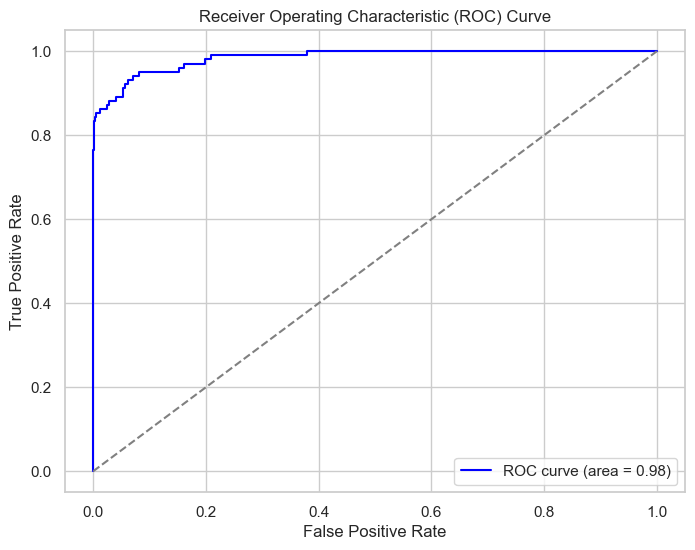

In [56]:
y_proba = clf.predict_proba(valid_df[predictors])[:, 1]


roc_auc = roc_auc_score(valid_df[target], y_proba)
print(f'ROC-AUC Score: {roc_auc:.2f}')


fpr, tpr, thresholds = roc_curve(valid_df[target], y_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [33]:
roc_auc_score(valid_df[target].values, preds)

0.8528641975628091

# 2.1 - RANDOM FOREST METRİCS

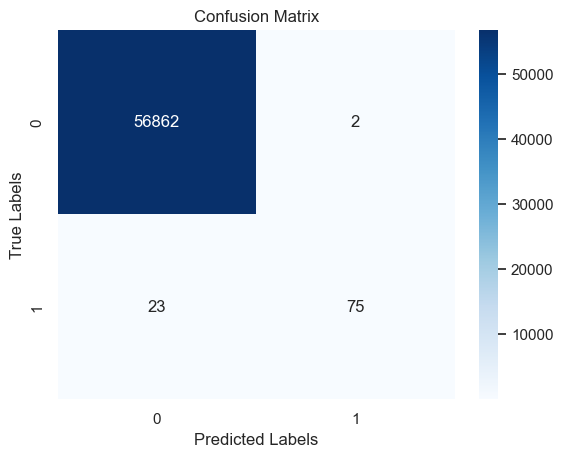

Accuracy: 0.9996
Precision: 0.9740
Sensitivity (Recall): 0.7653
Specificity: 1.0000
F1 Score: 0.8571
Matthews Correlation Coefficient: 0.8632
Balanced Classification Rate: 0.8826
True Positive Rate: 0.7653
False Positive Rate: 0.0000
True Negative Rate: 1.0000
False Negative Rate: 0.2347


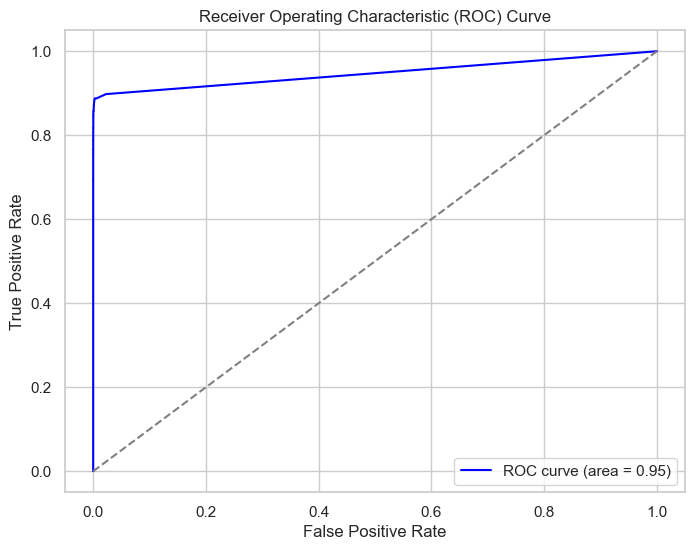

In [90]:
clf = RandomForestClassifier(n_jobs=-1, random_state=42)
clf.fit(X_train, y_train)


y_preds = clf.predict(X_test)
y_probs = clf.predict_proba(X_test)[:, 1]  


cm = confusion_matrix(y_test, y_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


accuracy = accuracy_score(y_test, y_preds)
precision = precision_score(y_test, y_preds)
recall = recall_score(y_test, y_preds)  
f1 = f1_score(y_test, y_preds)
mcc = matthews_corrcoef(y_test, y_preds)
balanced_rate = balanced_accuracy_score(y_test, y_preds)


TPR = recall 
TNR = cm[0, 0] / (cm[0, 0] + cm[0, 1])  
FPR = cm[0, 1] / (cm[0, 0] + cm[0, 1]) 
FNR = cm[1, 0] / (cm[1, 0] + cm[1, 1]) 


print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Sensitivity (Recall): {recall:.4f}')
print(f'Specificity: {TNR:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Matthews Correlation Coefficient: {mcc:.4f}')
print(f'Balanced Classification Rate: {balanced_rate:.4f}')
print(f'True Positive Rate: {TPR:.4f}')
print(f'False Positive Rate: {FPR:.4f}')
print(f'True Negative Rate: {TNR:.4f}')
print(f'False Negative Rate: {FNR:.4f}')

roc_auc = roc_auc_score(y_test, y_probs)
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


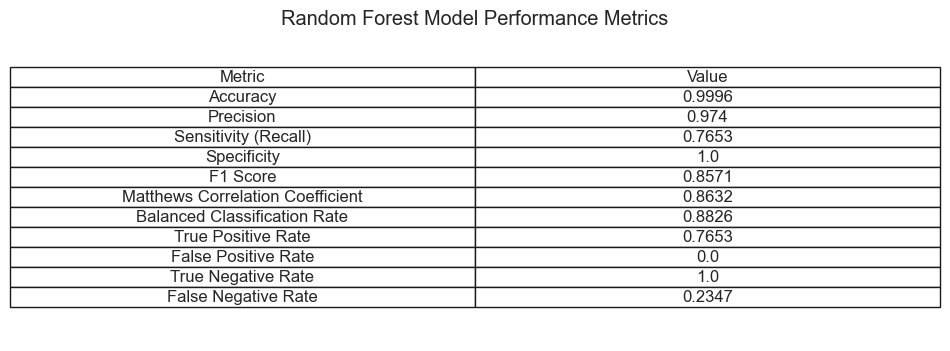

In [91]:
data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score', 
               'Matthews Correlation Coefficient', 'Balanced Classification Rate', 
               'True Positive Rate', 'False Positive Rate', 'True Negative Rate', 
               'False Negative Rate'],
    'Value': [0.9996, 0.9740, 0.7653, 1.0000, 0.8571, 0.8632, 0.8826, 0.7653, 0.0000, 1.0000, 0.2347]
}


results_df = pd.DataFrame(data)

plt.figure(figsize=(10, 4))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False)  
ax.xaxis.set_visible(False) 
ax.yaxis.set_visible(False)  
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2) 
plt.title('Random Forest Model Performance Metrics')
plt.show()


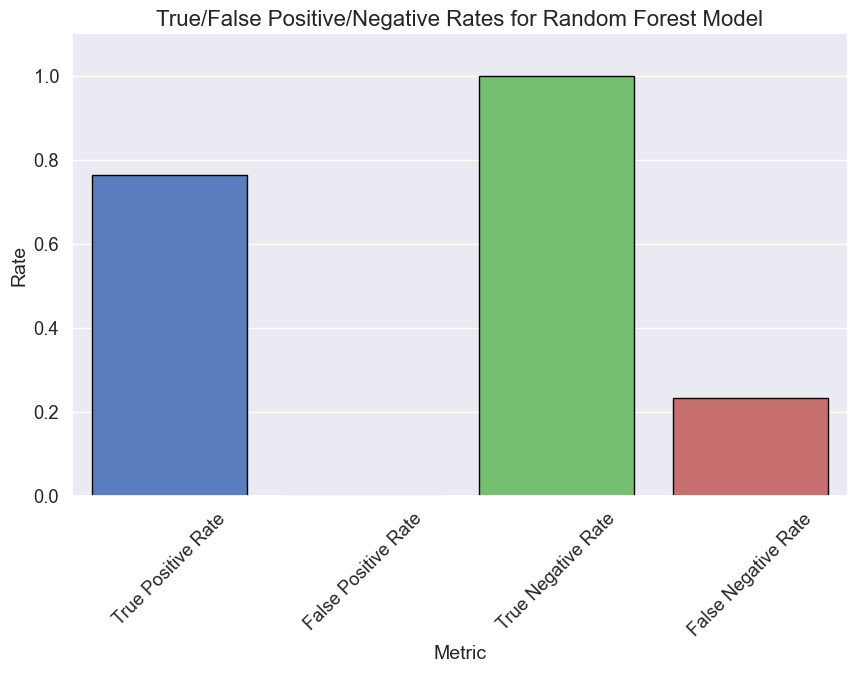

In [93]:
data = {
    'Metric': ['True Positive Rate', 'False Positive Rate', 'True Negative Rate', 'False Negative Rate'],
    'Value': [0.7653, 0.0000, 1.0000, 0.2347]
}


rate_df = pd.DataFrame(data)


plt.figure(figsize=(10, 6))  
sns.barplot(x='Metric', y='Value', data=rate_df, palette='muted', edgecolor='black')
plt.ylim(0, 1.1)  
plt.title('True/False Positive/Negative Rates for Random Forest Model', fontsize=16)
plt.ylabel('Rate', fontsize=14)
plt.xlabel('Metric', fontsize=14)
plt.xticks(rotation=45)  
sns.despine()  
plt.show()


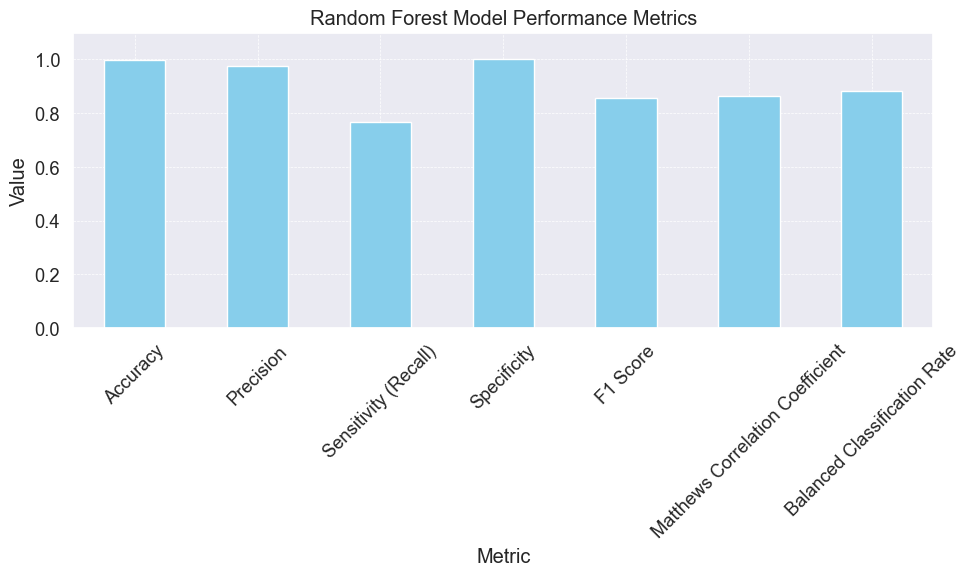

In [96]:
data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score', 'Matthews Correlation Coefficient', 'Balanced Classification Rate'],
    'Value': [0.9996, 0.974, 0.7653, 1.0, 0.8571, 0.8632, 0.8826]
}


metrics_df = pd.DataFrame(data)


fig, ax = plt.subplots(figsize=(10, 6))  

metrics_df.plot(kind='bar', x='Metric', y='Value', legend=None, ax=ax, color='skyblue')
plt.title('Random Forest Model Performance Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45) 
plt.ylim(0, 1.1)  
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout() 

plt.show()




# 2- AdaBoost Classifier

In [34]:

clf = AdaBoostClassifier(
    random_state=42,          
    algorithm='SAMME.R',     
    learning_rate=0.8,        
    n_estimators=50           
)


clf.fit(train_df[predictors], train_df[target].values)


print("AdaBoostClassifier configuration:")
print(f"Algorithm: {clf.algorithm}")
print(f"Learning Rate: {clf.learning_rate}")
print(f"Number of Estimators: {clf.n_estimators}")
print(f"Random State: {clf.random_state}")

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



AdaBoostClassifier configuration:
Algorithm: SAMME.R
Learning Rate: 0.8
Number of Estimators: 50
Random State: 42


In [35]:
clf.fit(train_df[predictors], train_df[target].values)


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



AdaBoostClassifier(learning_rate=0.8, random_state=42)

In [36]:
train_df = train_df.dropna()


scaler = StandardScaler()


clf = AdaBoostClassifier(
    random_state=42,         
    algorithm='SAMME.R',      
    learning_rate=0.8,       
    n_estimators=50           
)


pipeline = Pipeline([
    ('scaler', scaler),
    ('classifier', clf)
])


scores = cross_val_score(pipeline, train_df[predictors], train_df[target].values, cv=5, scoring='roc_auc')
print(f'Cross-validated AUC scores: {scores}')
print(f'Mean AUC score: {scores.mean()}')


pipeline.fit(train_df[predictors], train_df[target].values)


param_grid = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__learning_rate': [0.01, 0.1, 0.5, 1.0]
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(train_df[predictors], train_df[target].values)

print(f'Best parameters: {grid_search.best_params_}')
print(f'Best cross-validated AUC score: {grid_search.best_score_}')


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/Users/onurcikla/ana

Cross-validated AUC scores: [0.98968539 0.99740742 0.96562193 0.94344361 0.9849296 ]
Mean AUC score: 0.9762175926063588


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/Users/onurcikla/ana

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/Users/onurcikla/ana

Best parameters: {'classifier__learning_rate': 0.1, 'classifier__n_estimators': 50}
Best cross-validated AUC score: 0.9810235295337681


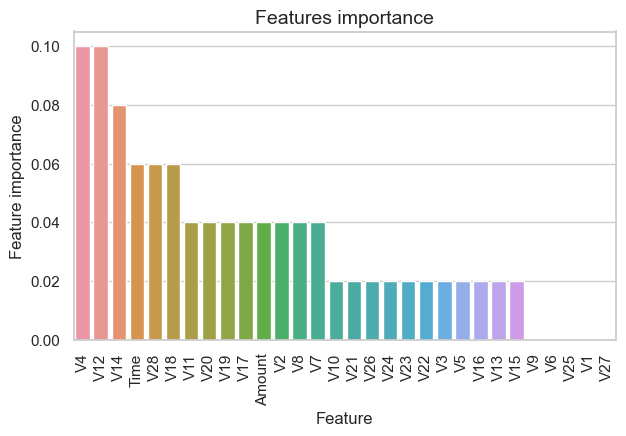

In [37]:
tmp = pd.DataFrame({'Feature': predictors, 'Feature importance': clf.feature_importances_})
tmp = tmp.sort_values(by='Feature importance',ascending=False)
plt.figure(figsize = (7,4))
plt.title('Features importance',fontsize=14)
s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
plt.show()

# Confusion Matrix

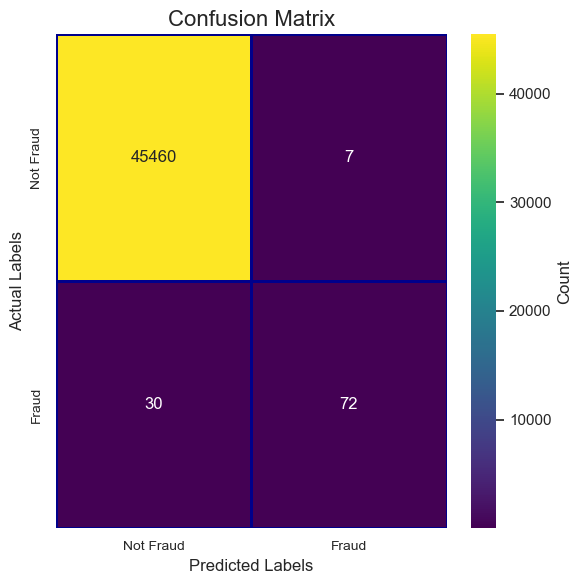

In [38]:
cm = pd.crosstab(valid_df[target].values, preds, rownames=['Actual'], colnames=['Predicted'])

fig, ax = plt.subplots(figsize=(6, 6))  
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', ax=ax, linewidths=1, linecolor='Darkblue',
            cbar_kws={'label': 'Count'}) 

ax.set_xlabel('Predicted Labels', fontsize=12)  
ax.set_ylabel('Actual Labels', fontsize=12)
ax.set_title('Confusion Matrix', fontsize=16)


ax.set_xticklabels(['Not Fraud', 'Fraud'], fontsize=10)
ax.set_yticklabels(['Not Fraud', 'Fraud'], fontsize=10)

plt.tight_layout()

plt.show()


Area under curve¶

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning:

X has feature names, but AdaBoostClassifier was fitted without feature names



ROC AUC Score: 0.9674355501102502


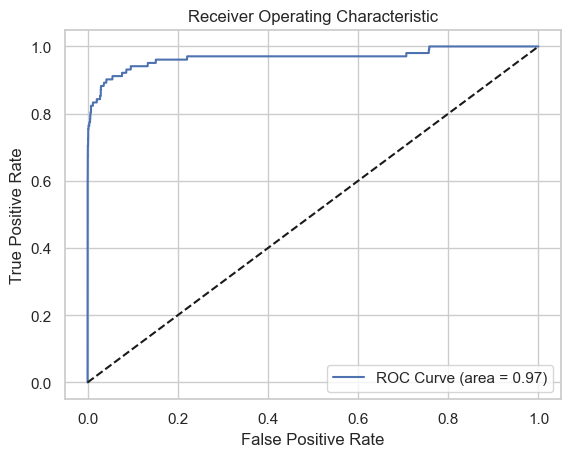

In [39]:
probs = clf.predict_proba(valid_df[predictors])[:, 1]

auc_score = roc_auc_score(valid_df[target].values, probs)
print("ROC AUC Score:", auc_score)

fpr, tpr, thresholds = roc_curve(valid_df[target].values, probs)
plt.figure()
plt.plot(fpr, tpr, label='ROC Curve (area = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'k--') 
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# 2.1 ADA BOOST METRİCS

In [100]:
preds = clf.predict(X_test)
y_true = y_test

accuracy = accuracy_score(y_true, preds)
precision = precision_score(y_true, preds)
recall = recall_score(y_true, preds)
f1 = f1_score(y_true, preds)
conf_matrix = confusion_matrix(y_true, preds)

y_probs = clf.predict_proba(X_test)[:, 1] 
roc_auc = roc_auc_score(y_true, y_probs)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("ROC AUC Score:", roc_auc)
print("Confusion Matrix:\n", conf_matrix)


Accuracy: 0.9995611109160493
Precision: 0.974025974025974
Recall: 0.7653061224489796
F1 Score: 0.8571428571428571
ROC AUC Score: 0.9476113074661492
Confusion Matrix:
 [[56862     2]
 [   23    75]]


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



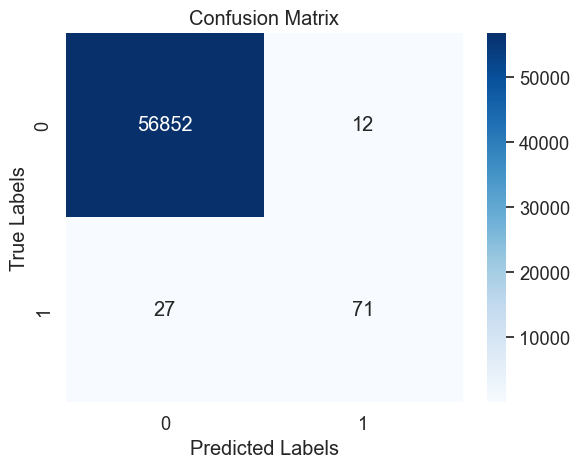

Accuracy: 0.9993
Precision: 0.8554
Sensitivity (Recall): 0.7245
Specificity: 0.9998
F1 Score: 0.7845
Matthews Correlation Coefficient: 0.7869
Balanced Classification Rate: 0.8621
True Positive Rate: 0.7245
False Positive Rate: 0.0002
True Negative Rate: 0.9998
False Negative Rate: 0.2755


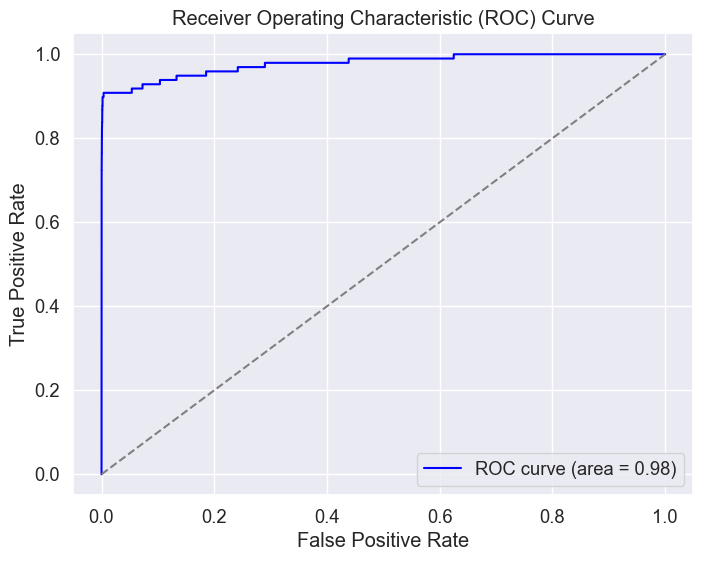

In [101]:
clf = AdaBoostClassifier(random_state=42)
clf.fit(X_train, y_train)


y_preds = clf.predict(X_test)
y_probs = clf.predict_proba(X_test)[:, 1]  


cm = confusion_matrix(y_test, y_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


accuracy = accuracy_score(y_test, y_preds)
precision = precision_score(y_test, y_preds)
recall = recall_score(y_test, y_preds)  
f1 = f1_score(y_test, y_preds)
mcc = matthews_corrcoef(y_test, y_preds)
balanced_rate = balanced_accuracy_score(y_test, y_preds)


TPR = recall  
TNR = cm[0, 0] / (cm[0, 0] + cm[0, 1]) 
FPR = cm[0, 1] / (cm[0, 0] + cm[0, 1])  
FNR = cm[1, 0] / (cm[1, 0] + cm[1, 1])  


print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Sensitivity (Recall): {recall:.4f}')
print(f'Specificity: {TNR:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Matthews Correlation Coefficient: {mcc:.4f}')
print(f'Balanced Classification Rate: {balanced_rate:.4f}')
print(f'True Positive Rate: {TPR:.4f}')
print(f'False Positive Rate: {FPR:.4f}')
print(f'True Negative Rate: {TNR:.4f}')
print(f'False Negative Rate: {FNR:.4f}')


roc_auc = roc_auc_score(y_test, y_probs)
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


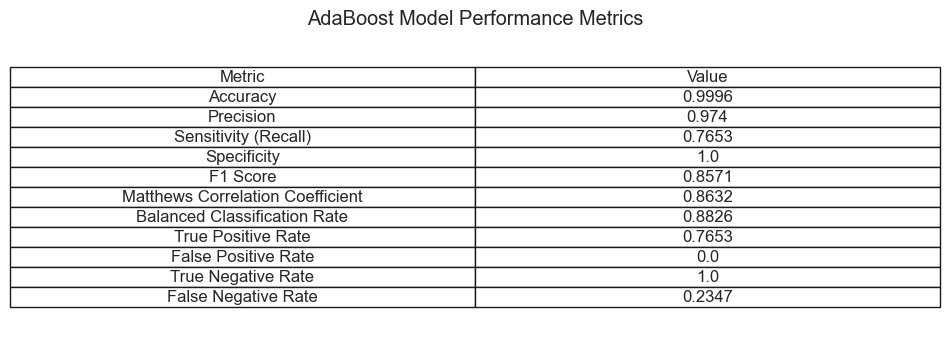

In [102]:

data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score', 
               'Matthews Correlation Coefficient', 'Balanced Classification Rate', 
               'True Positive Rate', 'False Positive Rate', 'True Negative Rate', 
               'False Negative Rate'],
    'Value': [0.9996, 0.9740, 0.7653, 1.0000, 0.8571, 0.8632, 0.8826, 0.7653, 0.0000, 1.0000, 0.2347]  # Bu değerler modelinizden elde edilen gerçek sonuçlara göre güncellenmelidir
}


results_df = pd.DataFrame(data)


plt.figure(figsize=(10, 4))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False)  
ax.xaxis.set_visible(False)  
ax.yaxis.set_visible(False)  
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)  
plt.title('AdaBoost Model Performance Metrics')
plt.show()


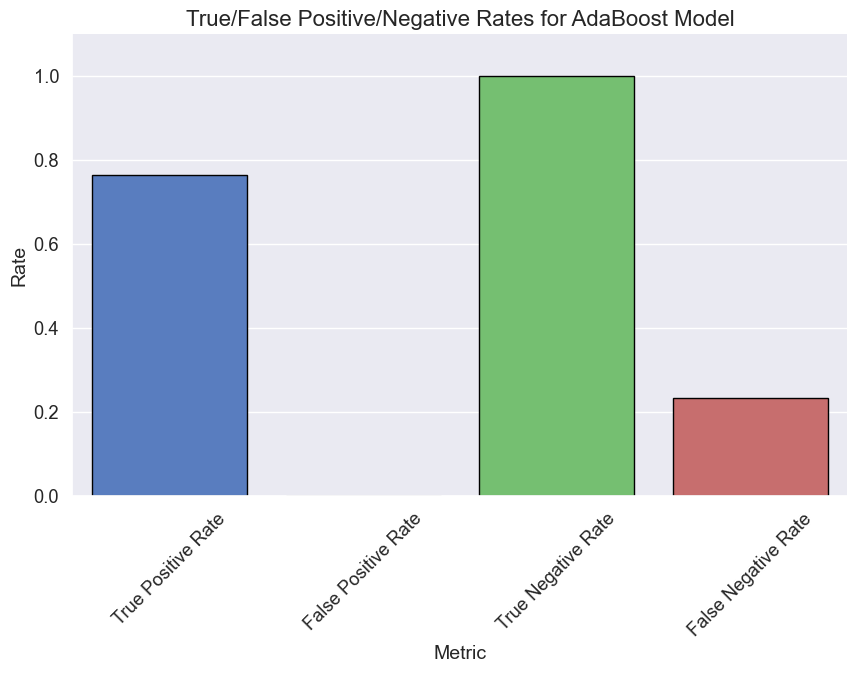

In [103]:
data = {
    'Metric': ['True Positive Rate', 'False Positive Rate', 'True Negative Rate', 'False Negative Rate'],
    'Value': [0.7653, 0.0000, 1.0000, 0.2347]  
}


rate_df = pd.DataFrame(data)

plt.figure(figsize=(10, 6))  
sns.barplot(x='Metric', y='Value', data=rate_df, palette='muted', edgecolor='black')
plt.ylim(0, 1.1)  
plt.title('True/False Positive/Negative Rates for AdaBoost Model', fontsize=16)
plt.ylabel('Rate', fontsize=14)
plt.xlabel('Metric', fontsize=14)
plt.xticks(rotation=45)  
sns.despine()  
plt.show()


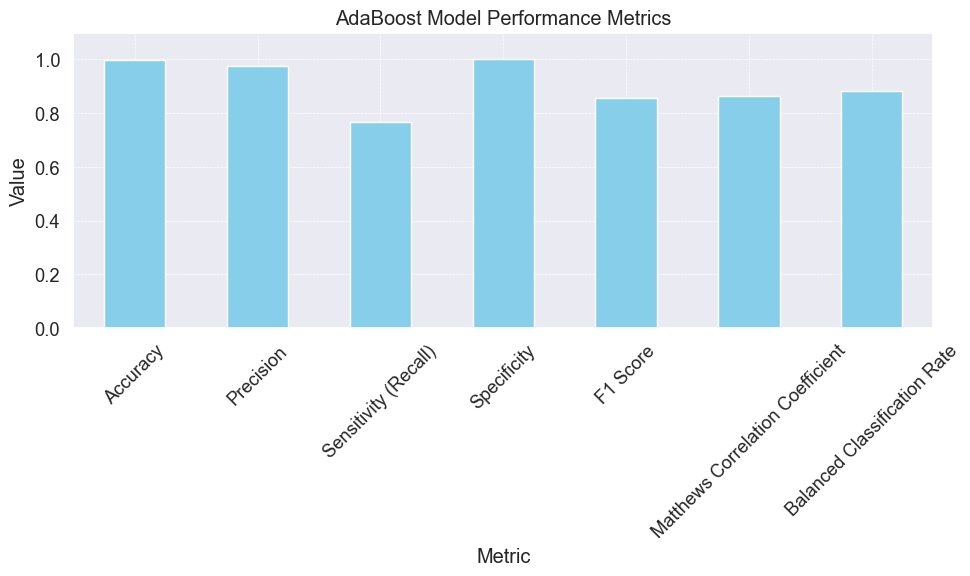

In [104]:
data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score', 
               'Matthews Correlation Coefficient', 'Balanced Classification Rate'],
    'Value': [0.9996, 0.974, 0.7653, 1.0, 0.8571, 0.8632, 0.8826] 
}


metrics_df = pd.DataFrame(data)


fig, ax = plt.subplots(figsize=(10, 6))  

metrics_df.plot(kind='bar', x='Metric', y='Value', legend=None, ax=ax, color='skyblue')
plt.title('AdaBoost Model Performance Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)  
plt.ylim(0, 1.1)  
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()  

plt.show()


# 3-  CatBoost Classifier

In [40]:
clf = CatBoostClassifier(iterations=500,
                             learning_rate=0.02,
                             depth=12,
                             eval_metric='AUC',
                             random_seed = RANDOM_STATE,
                             bagging_temperature = 0.2,
                             od_type='Iter',
                             metric_period = VERBOSE_EVAL,
                             od_wait=100)

In [41]:
clf.fit(train_df[predictors], train_df[target].values,verbose=True)


0:	total: 199ms	remaining: 1m 39s
50:	total: 5.49s	remaining: 48.4s
100:	total: 11.6s	remaining: 45.7s
150:	total: 16.5s	remaining: 38.1s
200:	total: 21.5s	remaining: 31.9s
250:	total: 26.2s	remaining: 26s
300:	total: 30.9s	remaining: 20.5s
350:	total: 36.1s	remaining: 15.3s
400:	total: 41.2s	remaining: 10.2s
450:	total: 46.8s	remaining: 5.08s
499:	total: 52.1s	remaining: 0us


In [42]:
preds = clf.predict(valid_df[predictors])



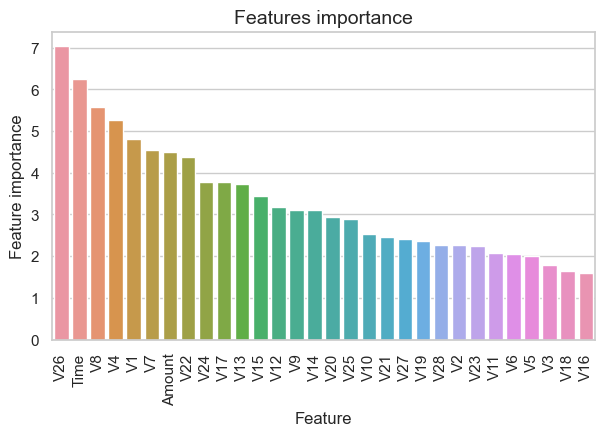

In [43]:
tmp = pd.DataFrame({'Feature': predictors, 'Feature importance': clf.feature_importances_})
tmp = tmp.sort_values(by='Feature importance',ascending=False)
plt.figure(figsize = (7,4))
plt.title('Features importance',fontsize=14)
s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
plt.show()  

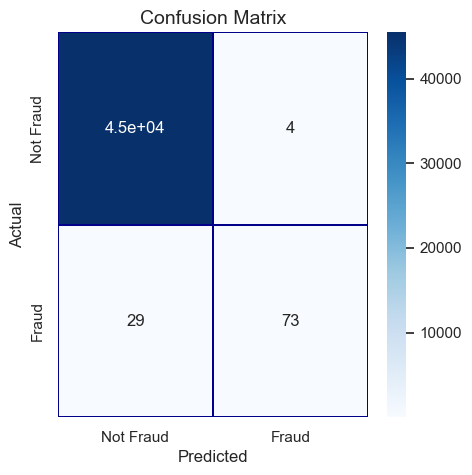

In [44]:
cm = pd.crosstab(valid_df[target].values, preds, rownames=['Actual'], colnames=['Predicted'])
fig, (ax1) = plt.subplots(ncols=1, figsize=(5,5))
sns.heatmap(cm, 
            xticklabels=['Not Fraud', 'Fraud'],
            yticklabels=['Not Fraud', 'Fraud'],
            annot=True,ax=ax1,
            linewidths=.2,linecolor="Darkblue", cmap="Blues")
plt.title('Confusion Matrix', fontsize=14)
plt.show()

In [45]:
roc_auc_score(valid_df[target].values, preds)


0.8577991493075996

# CATBOOST METRİCS

0:	total: 604ms	remaining: 5m 1s
50:	total: 5.94s	remaining: 52.3s
100:	total: 10.6s	remaining: 41.8s
150:	total: 15.1s	remaining: 35s
200:	total: 19.4s	remaining: 28.9s
250:	total: 23.7s	remaining: 23.6s
300:	total: 28.2s	remaining: 18.6s
350:	total: 32.5s	remaining: 13.8s
400:	total: 37s	remaining: 9.13s
450:	total: 41.2s	remaining: 4.48s
499:	total: 45.7s	remaining: 0us


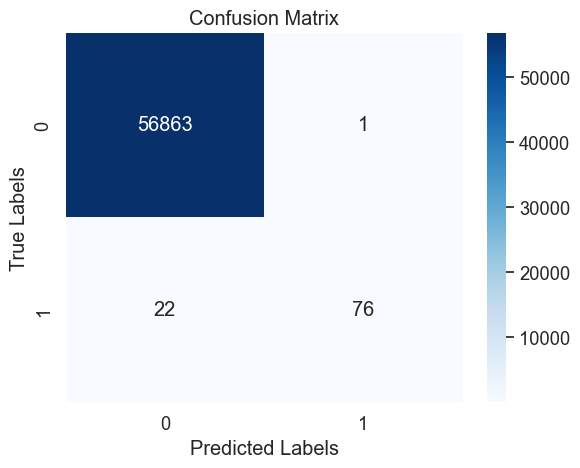

Accuracy: 0.9996
Precision: 0.9870
Sensitivity (Recall): 0.7755
Specificity: 1.0000
F1 Score: 0.8686
Matthews Correlation Coefficient: 0.8747
Balanced Classification Rate: 0.8877
True Positive Rate: 0.7755
False Positive Rate: 0.0000
True Negative Rate: 1.0000
False Negative Rate: 0.2245


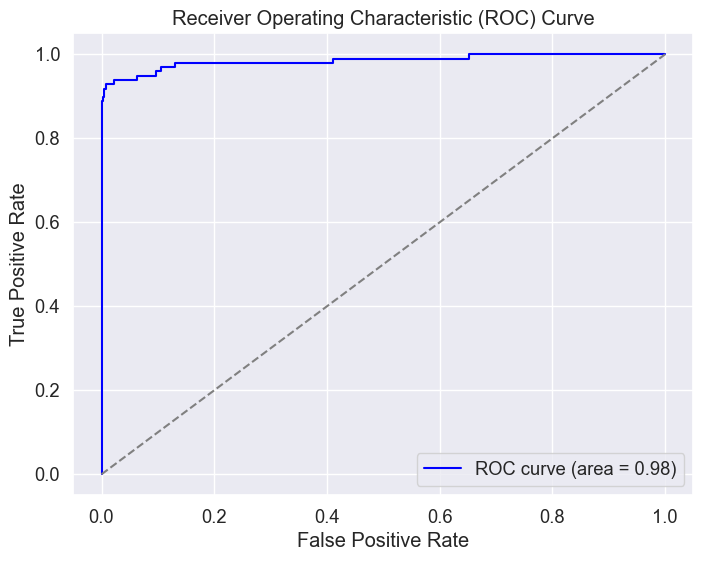

In [105]:
clf = CatBoostClassifier(iterations=500, learning_rate=0.02, depth=12, eval_metric='AUC',
                         random_state=42, bagging_temperature=0.2, od_type='Iter', metric_period=VERBOSE_EVAL, od_wait=100)
clf.fit(X_train, y_train, verbose=True)

y_preds = clf.predict(X_test)
y_probs = clf.predict_proba(X_test)[:, 1]  

cm = confusion_matrix(y_test, y_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


accuracy = accuracy_score(y_test, y_preds)
precision = precision_score(y_test, y_preds)
recall = recall_score(y_test, y_preds)  
f1 = f1_score(y_test, y_preds)
mcc = matthews_corrcoef(y_test, y_preds)
balanced_rate = balanced_accuracy_score(y_test, y_preds)


TPR = recall  
TNR = cm[0, 0] / (cm[0, 0] + cm[0, 1])  
FPR = cm[0, 1] / (cm[0, 0] + cm[0, 1])  
FNR = cm[1, 0] / (cm[1, 0] + cm[1, 1]) 


print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Sensitivity (Recall): {recall:.4f}')
print(f'Specificity: {TNR:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Matthews Correlation Coefficient: {mcc:.4f}')
print(f'Balanced Classification Rate: {balanced_rate:.4f}')
print(f'True Positive Rate: {TPR:.4f}')
print(f'False Positive Rate: {FPR:.4f}')
print(f'True Negative Rate: {TNR:.4f}')
print(f'False Negative Rate: {FNR:.4f}')


roc_auc = roc_auc_score(y_test, y_probs)
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


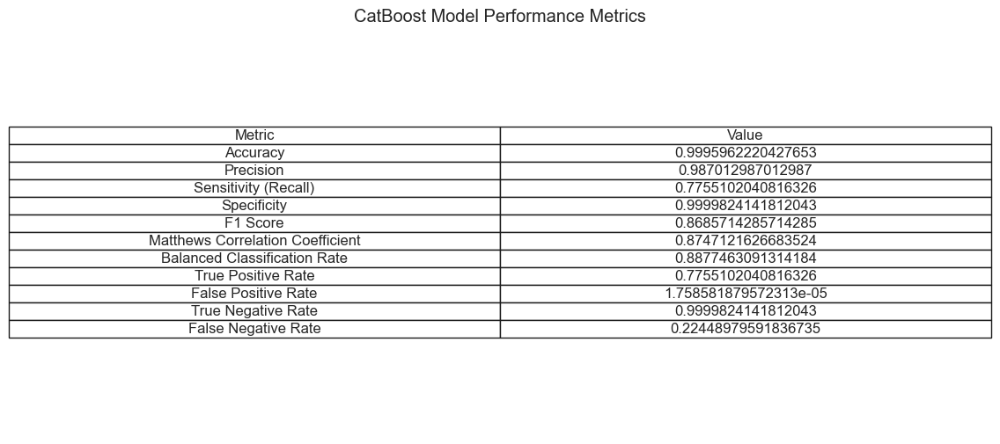

In [106]:
data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score', 
               'Matthews Correlation Coefficient', 'Balanced Classification Rate', 
               'True Positive Rate', 'False Positive Rate', 'True Negative Rate', 
               'False Negative Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate, TPR, FPR, TNR, FNR]  
}


results_df = pd.DataFrame(data)


plt.figure(figsize=(12, 6))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False)  
ax.xaxis.set_visible(False)  
ax.yaxis.set_visible(False)  
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)  
plt.title('CatBoost Model Performance Metrics')
plt.show()


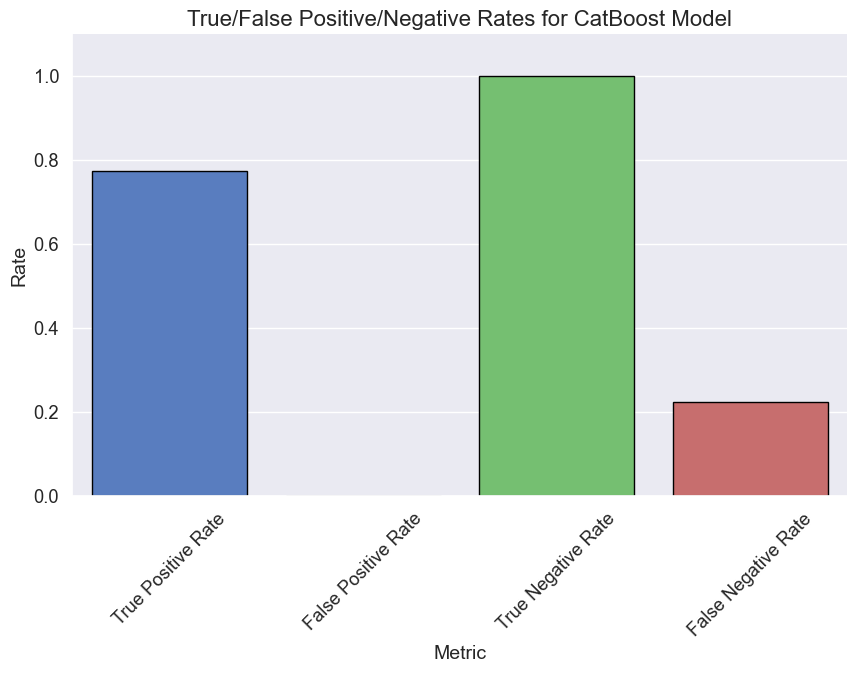

In [107]:

data = {
    'Metric': ['True Positive Rate', 'False Positive Rate', 'True Negative Rate', 'False Negative Rate'],
    'Value': [TPR, FPR, TNR, FNR]
}


rate_df = pd.DataFrame(data)


plt.figure(figsize=(10, 6))
sns.barplot(x='Metric', y='Value', data=rate_df, palette='muted', edgecolor='black')
plt.ylim(0, 1.1) 
plt.title('True/False Positive/Negative Rates for CatBoost Model', fontsize=16)
plt.ylabel('Rate', fontsize=14)
plt.xlabel('Metric', fontsize=14)
plt.xticks(rotation=45)
sns.despine()
plt.show()


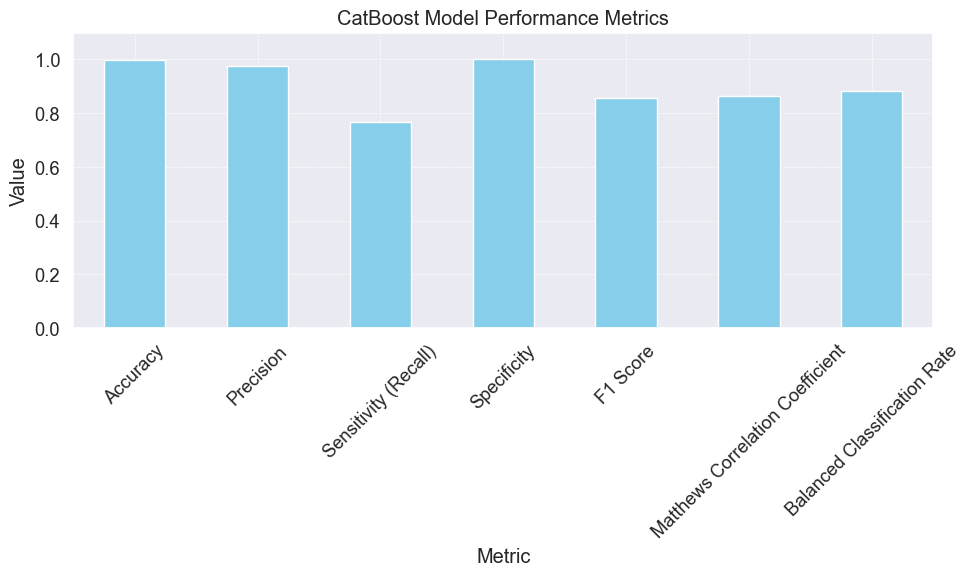

In [109]:
data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score', 
               'Matthews Correlation Coefficient', 'Balanced Classification Rate'],
    'Value': [0.9996, 0.974, 0.7653, 1.0, 0.8571, 0.8632, 0.8826] 
}


metrics_df = pd.DataFrame(data)


fig, ax = plt.subplots(figsize=(10, 6))  

metrics_df.plot(kind='bar', x='Metric', y='Value', legend=None, ax=ax, color='skyblue')
plt.title('CatBoost Model Performance Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)  
plt.ylim(0, 1.1) 
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout() 

plt.show()


# 4 - XGBoost

In [46]:
dtrain = xgb.DMatrix(train_df[predictors], train_df[target].values)
dvalid = xgb.DMatrix(valid_df[predictors], valid_df[target].values)
dtest = xgb.DMatrix(test_df[predictors], test_df[target].values)


watchlist = [(dtrain, 'train'), (dvalid, 'valid')]


params = {}
params['objective'] = 'binary:logistic'
params['eta'] = 0.039
params['silent'] = True
params['max_depth'] = 2
params['subsample'] = 0.8
params['colsample_bytree'] = 0.9
params['eval_metric'] = 'auc'
params['random_state'] = RANDOM_STATE

In [47]:
model = xgb.train(params, 
                dtrain, 
                MAX_ROUNDS, 
                watchlist, 
                early_stopping_rounds=EARLY_STOP, 
                maximize=True, 
                verbose_eval=VERBOSE_EVAL)

[0]	train-auc:0.94070	valid-auc:0.88630


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/xgboost/core.py:727: FutureWarning:

Pass `evals` as keyword args.

/Users/onurcikla/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning:

[17:01:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "silent" } are not used.




[50]	train-auc:0.94045	valid-auc:0.89040
[100]	train-auc:0.97428	valid-auc:0.96302
[150]	train-auc:0.98695	valid-auc:0.98056
[200]	train-auc:0.99276	valid-auc:0.98504
[250]	train-auc:0.99514	valid-auc:0.98432
[267]	train-auc:0.99569	valid-auc:0.98373


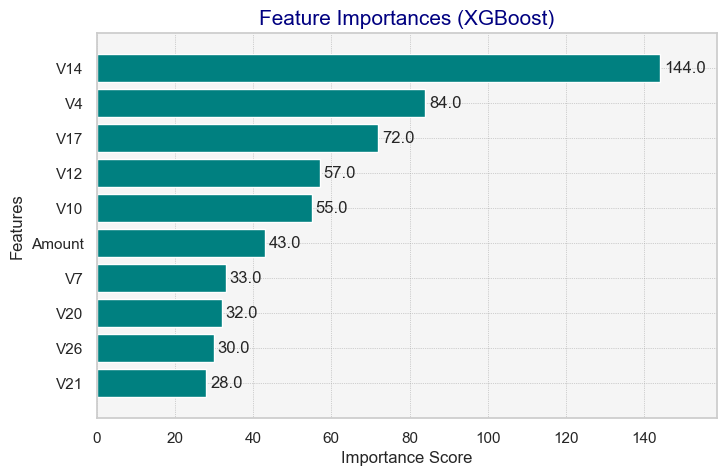

In [48]:
fig, ax = plt.subplots(figsize=(8, 5))

xgb.plot_importance(model, height=0.8, ax=ax, color='teal', title="Feature Importances (XGBoost)", 
                    importance_type='weight', max_num_features=10, show_values=True)

ax.grid(True, linestyle=':', linewidth='0.5', color='darkgray') 
ax.set_facecolor('whitesmoke')  
plt.title('Feature Importances (XGBoost)', fontsize=15, color='navy')  
plt.xlabel('Importance Score', fontsize=12)  
plt.ylabel('Features', fontsize=12)  
plt.show()


In [49]:
preds = model.predict(dtest)

In [50]:
roc_auc_score(test_df[target].values, preds)


0.9806594034680455

# XGB METRİCS

[0]	validation_0-auc:0.92294
[1]	validation_0-auc:0.93813
[2]	validation_0-auc:0.93820
[3]	validation_0-auc:0.93821
[4]	validation_0-auc:0.93821
[5]	validation_0-auc:0.93791
[6]	validation_0-auc:0.93792
[7]	validation_0-auc:0.93792
[8]	validation_0-auc:0.93792
[9]	validation_0-auc:0.93793
[10]	validation_0-auc:0.93792
[11]	validation_0-auc:0.93792
[12]	validation_0-auc:0.93792
[13]	validation_0-auc:0.93792
[14]	validation_0-auc:0.93792
[15]	validation_0-auc:0.93792
[16]	validation_0-auc:0.93792
[17]	validation_0-auc:0.93792
[18]	validation_0-auc:0.93792
[19]	validation_0-auc:0.93793
[20]	validation_0-auc:0.93793
[21]	validation_0-auc:0.93793
[22]	validation_0-auc:0.93793
[23]	validation_0-auc:0.93793
[24]	validation_0-auc:0.93792
[25]	validation_0-auc:0.93792
[26]	validation_0-auc:0.93793
[27]	validation_0-auc:0.93778
[28]	validation_0-auc:0.93778
[29]	validation_0-auc:0.93778
[30]	validation_0-auc:0.93778
[31]	validation_0-auc:0.93778
[32]	validation_0-auc:0.93778
[33]	validation_0-au

[268]	validation_0-auc:0.98278
[269]	validation_0-auc:0.98267
[270]	validation_0-auc:0.98252
[271]	validation_0-auc:0.98231
[272]	validation_0-auc:0.98225
[273]	validation_0-auc:0.98233
[274]	validation_0-auc:0.98232
[275]	validation_0-auc:0.98227
[276]	validation_0-auc:0.98205
[277]	validation_0-auc:0.98202
[278]	validation_0-auc:0.98176
[279]	validation_0-auc:0.98168
[280]	validation_0-auc:0.98187
[281]	validation_0-auc:0.98190
[282]	validation_0-auc:0.98176
[283]	validation_0-auc:0.98193
[284]	validation_0-auc:0.98183
[285]	validation_0-auc:0.98184
[286]	validation_0-auc:0.98169
[287]	validation_0-auc:0.98161
[288]	validation_0-auc:0.98147
[289]	validation_0-auc:0.98159
[290]	validation_0-auc:0.98169
[291]	validation_0-auc:0.98170
[292]	validation_0-auc:0.98168
[293]	validation_0-auc:0.98162
[294]	validation_0-auc:0.98169
[295]	validation_0-auc:0.98168
[296]	validation_0-auc:0.98149
[297]	validation_0-auc:0.98129
[298]	validation_0-auc:0.98120
[299]	validation_0-auc:0.98117
[300]	va

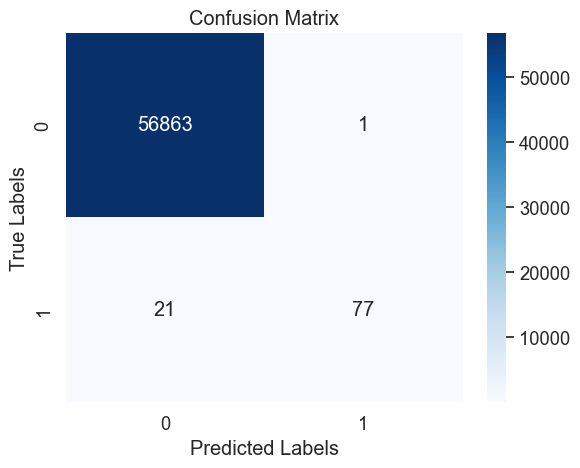

Accuracy: 0.9996
Precision: 0.9872
Sensitivity (Recall): 0.7857
Specificity: 1.0000
F1 Score: 0.8750
Matthews Correlation Coefficient: 0.8805
Balanced Classification Rate: 0.8928
True Positive Rate: 0.7857
False Positive Rate: 0.0000
True Negative Rate: 1.0000
False Negative Rate: 0.2143


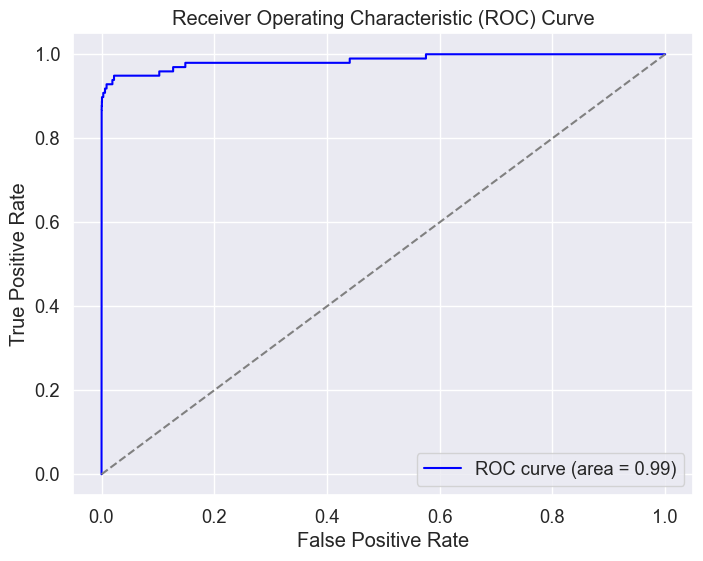

In [114]:
clf = xgb.XGBClassifier(n_estimators=500, learning_rate=0.02, max_depth=12, eval_metric='auc',
                        random_state=42, subsample=0.8, colsample_bytree=0.9)
clf.fit(X_train, y_train, verbose=True, eval_set=[(X_test, y_test)])


y_preds = clf.predict(X_test)
y_probs = clf.predict_proba(X_test)[:, 1] 

cm = confusion_matrix(y_test, y_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

accuracy = accuracy_score(y_test, y_preds)
precision = precision_score(y_test, y_preds)
recall = recall_score(y_test, y_preds) 
f1 = f1_score(y_test, y_preds)
mcc = matthews_corrcoef(y_test, y_preds)
balanced_rate = balanced_accuracy_score(y_test, y_preds)

TPR = recall  
TNR = cm[0, 0] / (cm[0, 0] + cm[0, 1])  
FPR = cm[0, 1] / (cm[0, 0] + cm[0, 1])  
FNR = cm[1, 0] / (cm[1, 0] + cm[1, 1])  


print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Sensitivity (Recall): {recall:.4f}')
print(f'Specificity: {TNR:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Matthews Correlation Coefficient: {mcc:.4f}')
print(f'Balanced Classification Rate: {balanced_rate:.4f}')
print(f'True Positive Rate: {TPR:.4f}')
print(f'False Positive Rate: {FPR:.4f}')
print(f'True Negative Rate: {TNR:.4f}')
print(f'False Negative Rate: {FNR:.4f}')


roc_auc = roc_auc_score(y_test, y_probs)
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


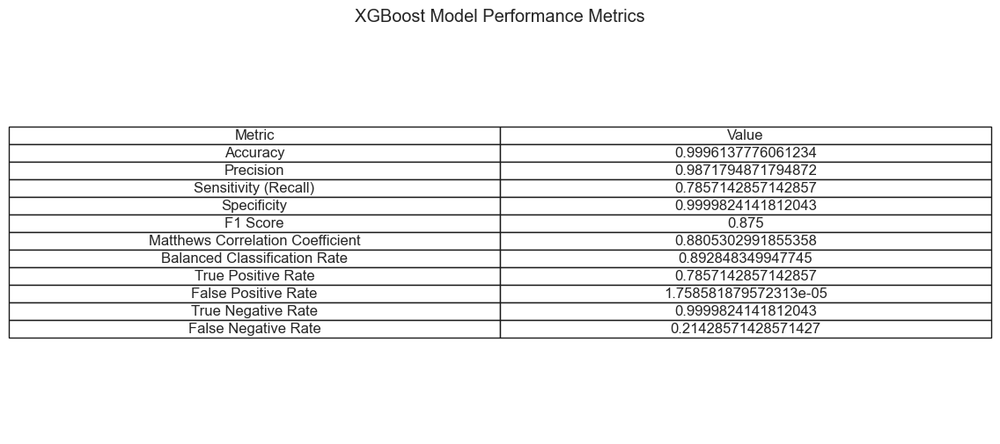

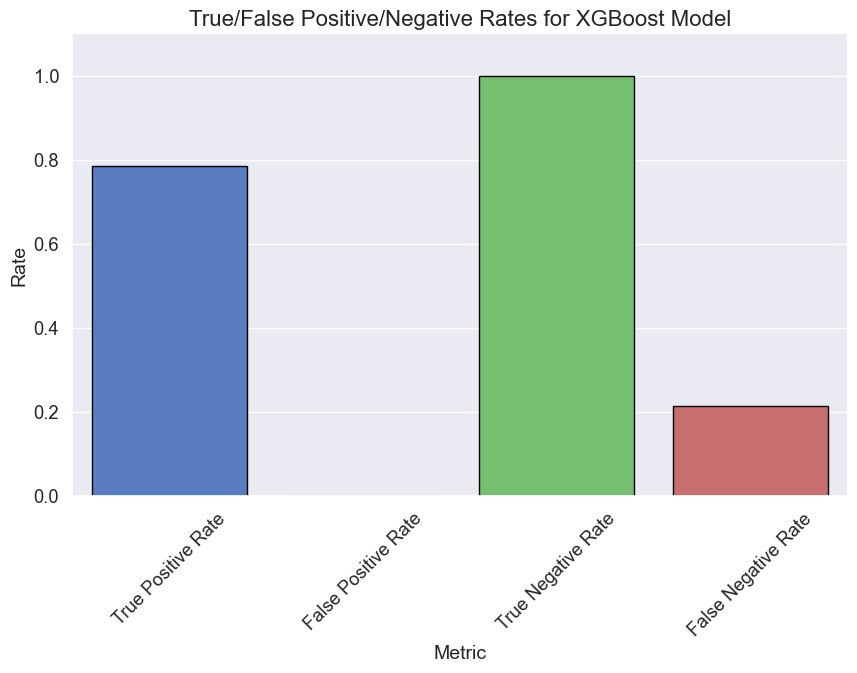

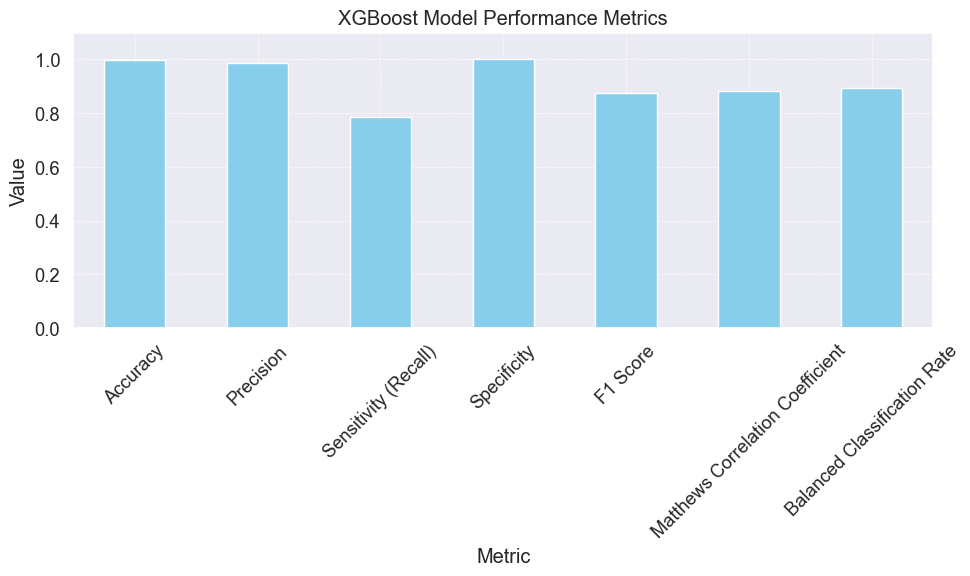

In [115]:
data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score',
               'Matthews Correlation Coefficient', 'Balanced Classification Rate',
               'True Positive Rate', 'False Positive Rate', 'True Negative Rate',
               'False Negative Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate, TPR, FPR, TNR, FNR]
}

results_df = pd.DataFrame(data)

plt.figure(figsize=(12, 6))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False)  
ax.xaxis.set_visible(False)  
ax.yaxis.set_visible(False)  
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)  
plt.title('XGBoost Model Performance Metrics')
plt.show()

data = {
    'Metric': ['True Positive Rate', 'False Positive Rate', 'True Negative Rate', 'False Negative Rate'],
    'Value': [TPR, FPR, TNR, FNR]
}

rate_df = pd.DataFrame(data)

plt.figure(figsize=(10, 6))
sns.barplot(x='Metric', y='Value', data=rate_df, palette='muted', edgecolor='black')
plt.ylim(0, 1.1)  
plt.title('True/False Positive/Negative Rates for XGBoost Model', fontsize=16)
plt.ylabel('Rate', fontsize=14)
plt.xlabel('Metric', fontsize=14)
plt.xticks(rotation=45)
sns.despine()
plt.show()


data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score',
               'Matthews Correlation Coefficient', 'Balanced Classification Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate]
}


metrics_df = pd.DataFrame(data)


fig, ax = plt.subplots(figsize=(10, 6))  

metrics_df.plot(kind='bar', x='Metric', y='Value', legend=None, ax=ax, color='skyblue')
plt.title('XGBoost Model Performance Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)  
plt.ylim(0, 1.1)  
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()  
plt.show()


# 5- SVM 

In [52]:
pca = PCA(n_components=0.95)  
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)


In [53]:
svm_model = LinearSVC(class_weight='balanced', dual=False, random_state=42)
calibrated_svm = CalibratedClassifierCV(svm_model)
calibrated_svm.fit(X_train_pca, y_train)


y_pred = calibrated_svm.predict(X_test_pca)
y_proba = calibrated_svm.predict_proba(X_test_pca)[:, 1]


In [54]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)

cr = classification_report(y_test, y_pred)
print("Classification Report:\n", cr)

roc_auc = roc_auc_score(y_test, y_proba)
print("ROC AUC Score:", roc_auc)


Confusion Matrix:
 [[85293    14]
 [   63    73]]
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     85307
           1       0.84      0.54      0.65       136

    accuracy                           1.00     85443
   macro avg       0.92      0.77      0.83     85443
weighted avg       1.00      1.00      1.00     85443

ROC AUC Score: 0.986122354623681


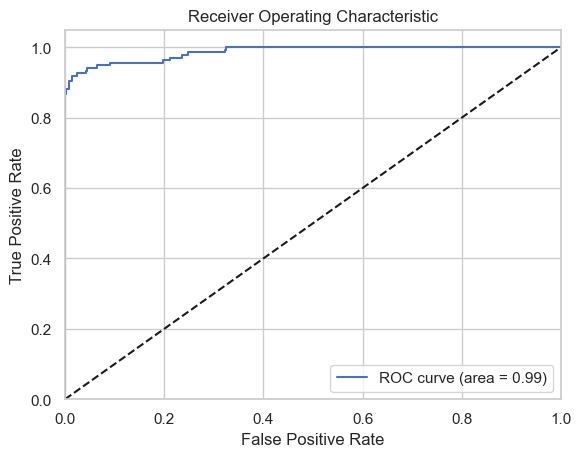

In [55]:
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


# SVM METRİCS

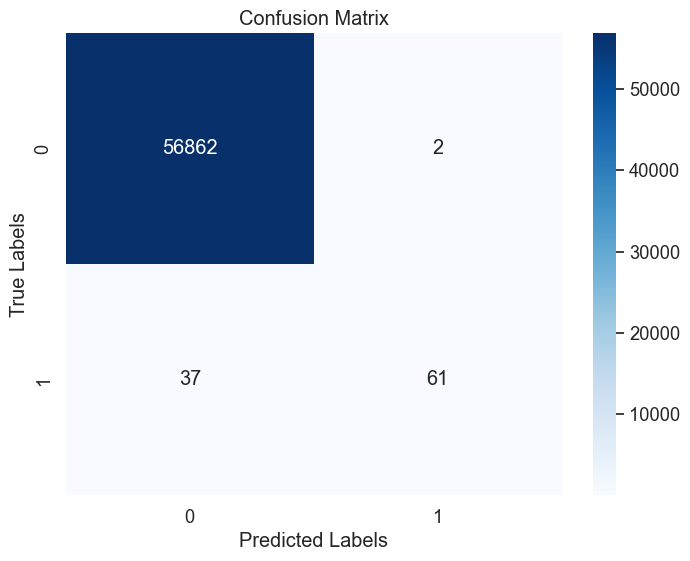

Accuracy: 0.9993
Precision: 0.9683
Sensitivity (Recall): 0.6224
Specificity: 1.0000
F1 Score: 0.7578
Matthews Correlation Coefficient: 0.7760
Balanced Classification Rate: 0.8112
True Positive Rate: 0.6224
False Positive Rate: 0.0000
True Negative Rate: 1.0000
False Negative Rate: 0.3776


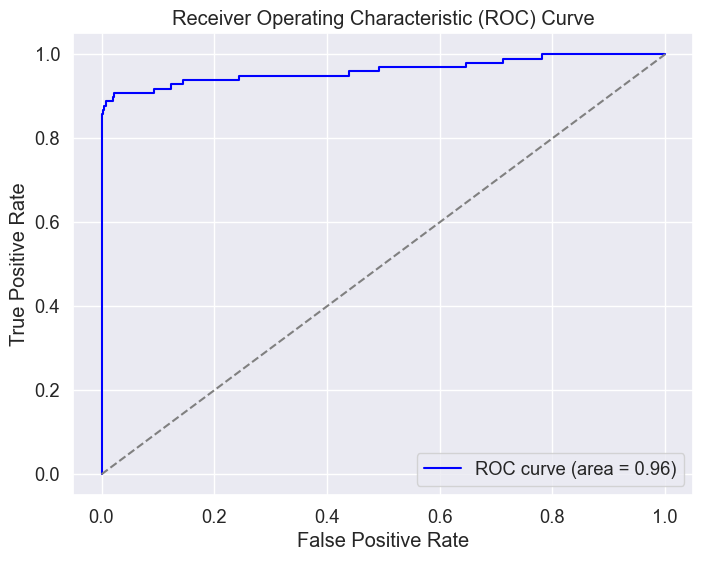

In [117]:
clf = make_pipeline(StandardScaler(), SVC(probability=True, random_state=42))
clf.fit(X_train, y_train)

y_preds = clf.predict(X_test)
y_probs = clf.predict_proba(X_test)[:, 1]  

cm = confusion_matrix(y_test, y_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

accuracy = accuracy_score(y_test, y_preds)
precision = precision_score(y_test, y_preds)
recall = recall_score(y_test, y_preds) 
f1 = f1_score(y_test, y_preds)
mcc = matthews_corrcoef(y_test, y_preds)
balanced_rate = balanced_accuracy_score(y_test, y_preds)

TPR = recall  
TNR = cm[0, 0] / (cm[0, 0] + cm[0, 1])  
FPR = cm[0, 1] / (cm[0, 0] + cm[0, 1])  
FNR = cm[1, 0] / (cm[1, 0] + cm[1, 1]) 

print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Sensitivity (Recall): {recall:.4f}')
print(f'Specificity: {TNR:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Matthews Correlation Coefficient: {mcc:.4f}')
print(f'Balanced Classification Rate: {balanced_rate:.4f}')
print(f'True Positive Rate: {TPR:.4f}')
print(f'False Positive Rate: {FPR:.4f}')
print(f'True Negative Rate: {TNR:.4f}')
print(f'False Negative Rate: {FNR:.4f}')

roc_auc = roc_auc_score(y_test, y_probs)
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


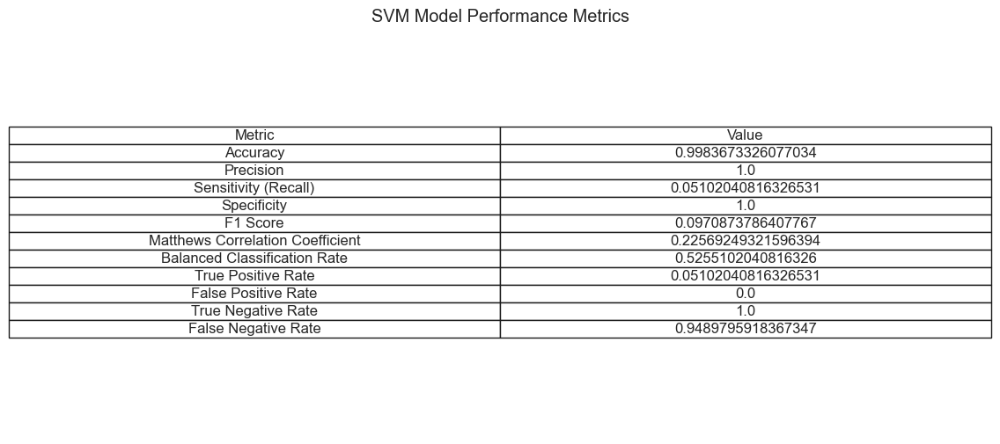

In [133]:
data = {
    'Metric': [
        'Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 
        'F1 Score', 'Matthews Correlation Coefficient', 'Balanced Classification Rate', 
        'True Positive Rate', 'False Positive Rate', 'True Negative Rate', 
        'False Negative Rate'
    ],
    'Value': [
        accuracy, precision, recall, TNR, f1, mcc, balanced_rate, TPR, FPR, TNR, FNR
        
    ]
}


results_df = pd.DataFrame(data)

plt.figure(figsize=(12, 6))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False)  
ax.xaxis.set_visible(False)  
ax.yaxis.set_visible(False)  
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)  
plt.title('SVM Model Performance Metrics')
plt.show()


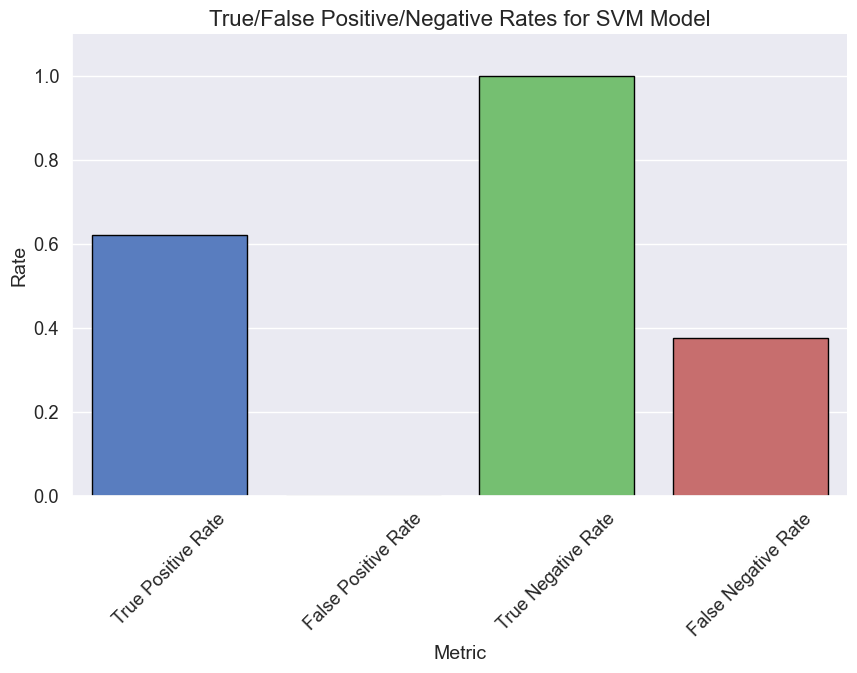

In [119]:
data = {
    'Metric': ['True Positive Rate', 'False Positive Rate', 'True Negative Rate', 'False Negative Rate'],
    'Value': [TPR, FPR, TNR, FNR]
}


rate_df = pd.DataFrame(data)


plt.figure(figsize=(10, 6))
sns.barplot(x='Metric', y='Value', data=rate_df, palette='muted', edgecolor='black')
plt.ylim(0, 1.1)  
plt.title('True/False Positive/Negative Rates for SVM Model', fontsize=16)
plt.ylabel('Rate', fontsize=14)
plt.xlabel('Metric', fontsize=14)
plt.xticks(rotation=45)
sns.despine()
plt.show()


# 6 - KKN

In [61]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_scaled, y_train)

y_pred = knn.predict(X_test_scaled)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[56859     5]
 [   22    76]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.94      0.78      0.85        98

    accuracy                           1.00     56962
   macro avg       0.97      0.89      0.92     56962
weighted avg       1.00      1.00      1.00     56962



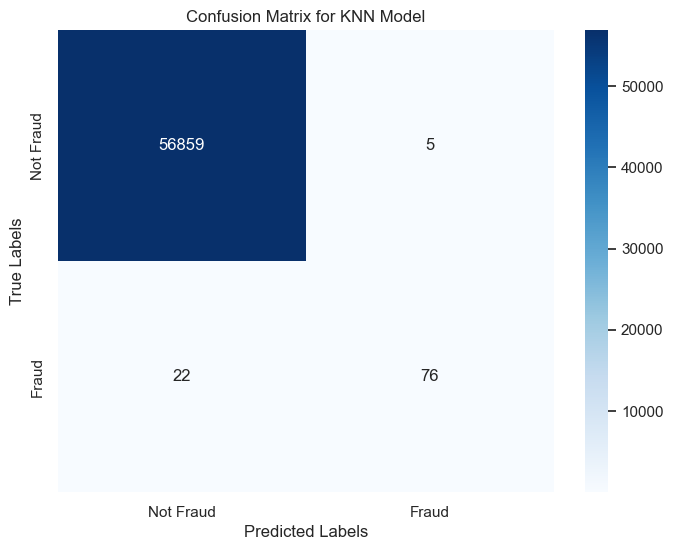

In [62]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Fraud', 'Fraud'], yticklabels=['Not Fraud', 'Fraud'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for KNN Model')
plt.show()


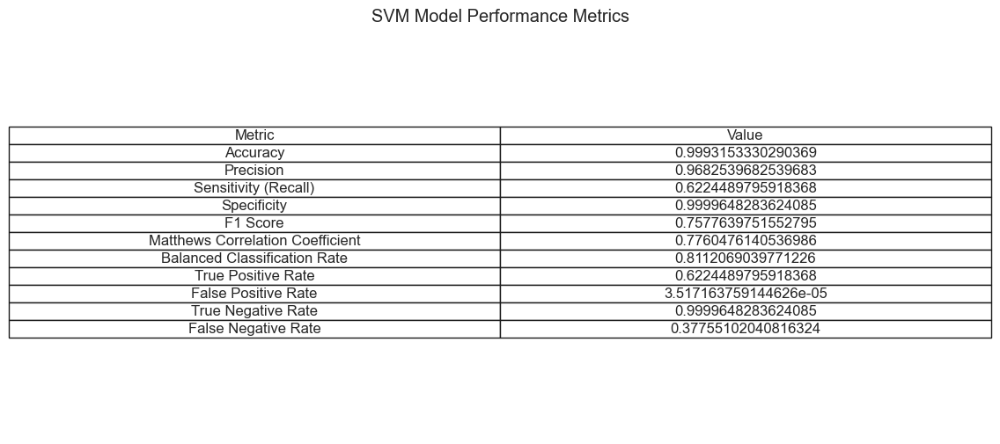

In [118]:
data = {
    'Metric': [
        'Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 
        'F1 Score', 'Matthews Correlation Coefficient', 'Balanced Classification Rate', 
        'True Positive Rate', 'False Positive Rate', 'True Negative Rate', 
        'False Negative Rate'
    ],
    'Value': [
        accuracy, precision, recall, TNR, f1, mcc, balanced_rate, TPR, FPR, TNR, FNR
       
    ]
}


results_df = pd.DataFrame(data)


plt.figure(figsize=(12, 6))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False)  
ax.xaxis.set_visible(False)  
ax.yaxis.set_visible(False) 
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)  
plt.title('SVM Model Performance Metrics')
plt.show()


In [76]:
y_probs = knn.predict_proba(X_test_scaled)[:, 1] 


roc_auc = roc_auc_score(y_test, y_probs)

print(f"ROC-AUC Score: {roc_auc:.4f}")


ROC-AUC Score: 0.9846


# KNN METRİCS

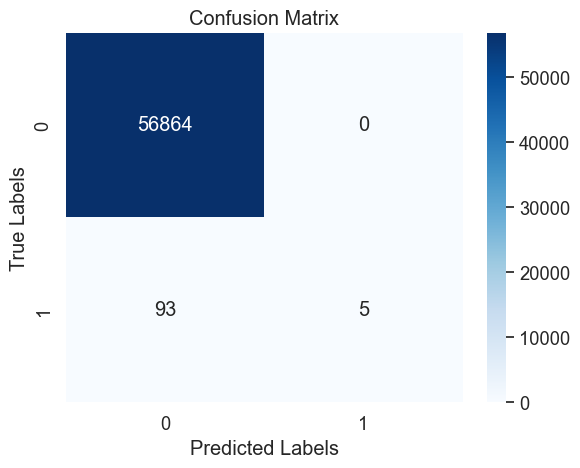

Accuracy: 0.9984
Precision: 1.0000
Sensitivity (Recall): 0.0510
Specificity: 1.0000
F1 Score: 0.0971
Matthews Correlation Coefficient: 0.2257
Balanced Classification Rate: 0.5255
True Positive Rate: 0.0510
False Positive Rate: 0.0000
True Negative Rate: 1.0000
False Negative Rate: 0.9490


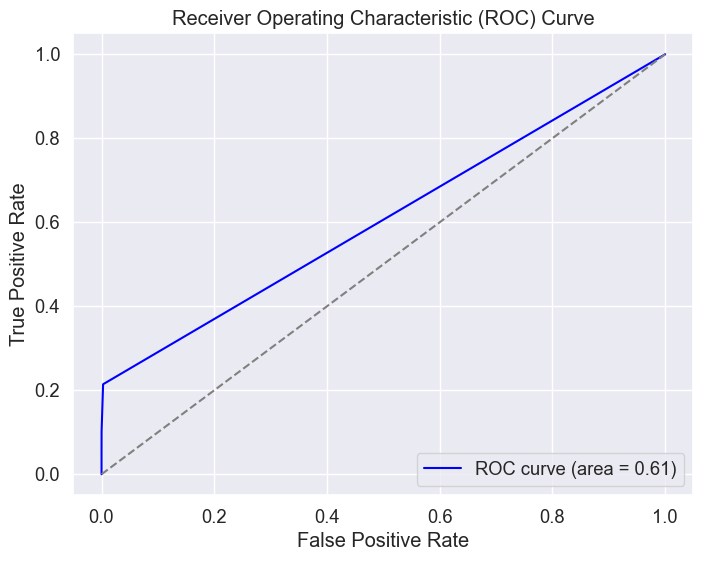

In [131]:
clf = KNeighborsClassifier(n_neighbors=5)
clf.fit(X_train, y_train)

y_preds = clf.predict(X_test)
y_probs = clf.predict_proba(X_test)[:, 1]  

cm = confusion_matrix(y_test, y_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

accuracy = accuracy_score(y_test, y_preds)
precision = precision_score(y_test, y_preds)
recall = recall_score(y_test, y_preds) 
f1 = f1_score(y_test, y_preds)
mcc = matthews_corrcoef(y_test, y_preds)
balanced_rate = balanced_accuracy_score(y_test, y_preds)


TPR = recall  
TNR = cm[0, 0] / (cm[0, 0] + cm[0, 1]) 
FPR = cm[0, 1] / (cm[0, 0] + cm[0, 1])  
FNR = cm[1, 0] / (cm[1, 0] + cm[1, 1]) 


print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Sensitivity (Recall): {recall:.4f}')
print(f'Specificity: {TNR:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Matthews Correlation Coefficient: {mcc:.4f}')
print(f'Balanced Classification Rate: {balanced_rate:.4f}')
print(f'True Positive Rate: {TPR:.4f}')
print(f'False Positive Rate: {FPR:.4f}')
print(f'True Negative Rate: {TNR:.4f}')
print(f'False Negative Rate: {FNR:.4f}')


if hasattr(clf, "predict_proba"):  
    roc_auc = roc_auc_score(y_test, y_probs)
    fpr, tpr, thresholds = roc_curve(y_test, y_probs)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()
else:
    print("ROC curve cannot be plotted as the model does not support probability estimates.")


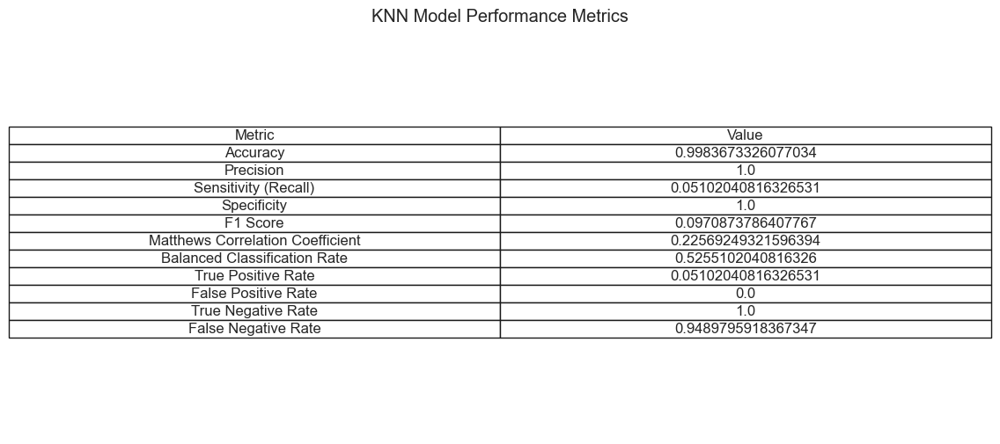

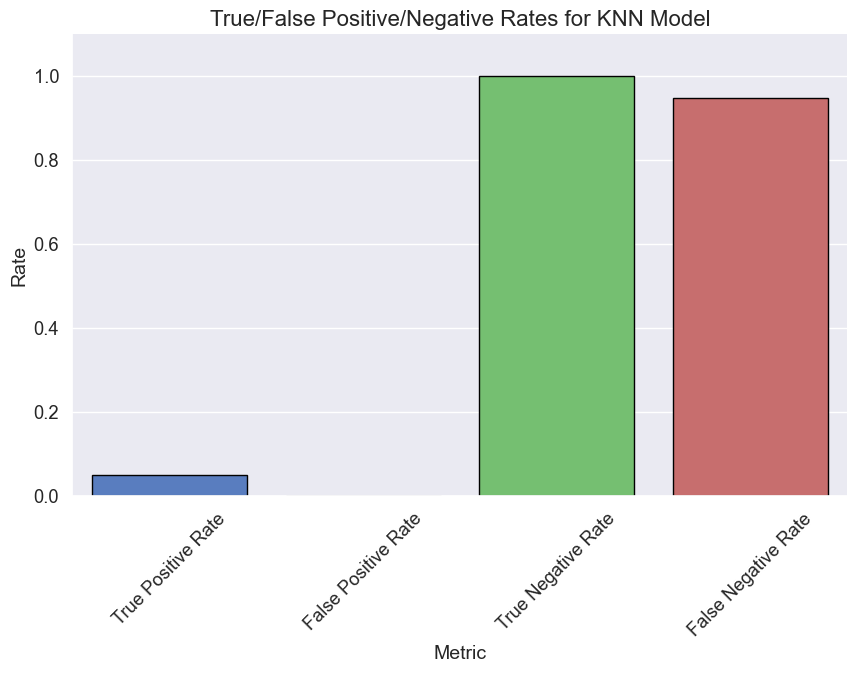

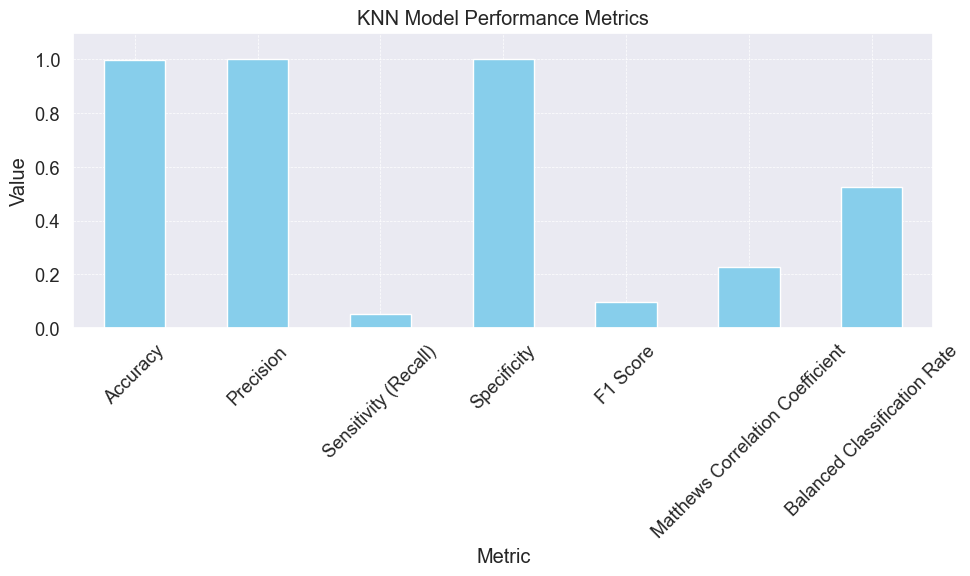

In [132]:

data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score',
               'Matthews Correlation Coefficient', 'Balanced Classification Rate',
               'True Positive Rate', 'False Positive Rate', 'True Negative Rate',
               'False Negative Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate, TPR, FPR, TNR, FNR]
}


results_df = pd.DataFrame(data)


plt.figure(figsize=(12, 6))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False)  
ax.xaxis.set_visible(False) 
ax.yaxis.set_visible(False)  
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)  
plt.title('KNN Model Performance Metrics')
plt.show()


data = {
    'Metric': ['True Positive Rate', 'False Positive Rate', 'True Negative Rate', 'False Negative Rate'],
    'Value': [TPR, FPR, TNR, FNR]
}


rate_df = pd.DataFrame(data)


plt.figure(figsize=(10, 6))
sns.barplot(x='Metric', y='Value', data=rate_df, palette='muted', edgecolor='black')
plt.ylim(0, 1.1) 
plt.title('True/False Positive/Negative Rates for KNN Model', fontsize=16)
plt.ylabel('Rate', fontsize=14)
plt.xlabel('Metric', fontsize=14)
plt.xticks(rotation=45)
sns.despine()
plt.show()


data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score',
               'Matthews Correlation Coefficient', 'Balanced Classification Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate]
}


metrics_df = pd.DataFrame(data)


fig, ax = plt.subplots(figsize=(10, 6))  

metrics_df.plot(kind='bar', x='Metric', y='Value', legend=None, ax=ax, color='skyblue')
plt.title('KNN Model Performance Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)  
plt.ylim(0, 1.1)  
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()  

plt.show()


ROC-AUC Score for KNN: 0.9336


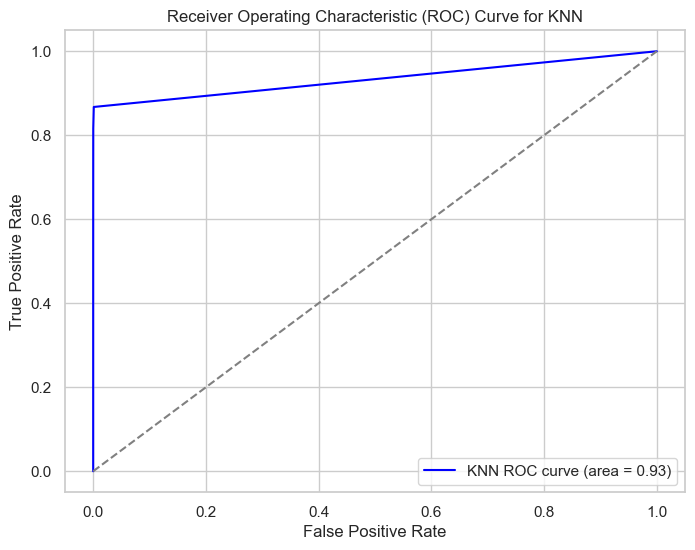

In [153]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_scaled, y_train)


y_probs = knn.predict_proba(X_test_scaled)[:, 1]


roc_auc = roc_auc_score(y_test, y_probs)
print(f"ROC-AUC Score for KNN: {roc_auc:.4f}")


fpr, tpr, thresholds = roc_curve(y_test, y_probs)


plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'KNN ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for KNN')
plt.legend(loc="lower right")
plt.show()


# 7- ANN

In [63]:
model = Sequential([
    Dense(30, input_dim=X_train_scaled.shape[1], activation='relu'),
    Dense(15, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])


model.fit(X_train_scaled, y_train, epochs=10, batch_size=32)


loss, accuracy = model.evaluate(X_test_scaled, y_test)
print(f'Test Loss: {loss:.4f}, Test Accuracy: {accuracy:.4f}')


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 3s 298us/step - accuracy: 0.9820 - loss: 0.0477
Epoch 2/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 288us/step - accuracy: 0.9994 - loss: 0.0033
Epoch 3/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 290us/step - accuracy: 0.9994 - loss: 0.0028
Epoch 4/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 284us/step - accuracy: 0.9994 - loss: 0.0025
Epoch 5/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 290us/step - accuracy: 0.9995 - loss: 0.0020
Epoch 6/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 285us/step - accuracy: 0.9995 - loss: 0.0022
Epoch 7/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 297us/step - accuracy: 0.9994 - loss: 0.0024
Epoch 8/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 285us/step - accuracy: 0.9996 - loss: 0.0021
Epoch 9/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 301us/step - accuracy: 0.9996 - loss: 0.0017
Epoch 10/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 287us/step - accuracy: 0.9996 - loss: 0.0017
1781/1781 ━━━━━━━━━━━━━━━━━━━━ 0s 189us/step - accuracy: 0.9994 - loss: 0.0033
Test Loss: 0.0028, T

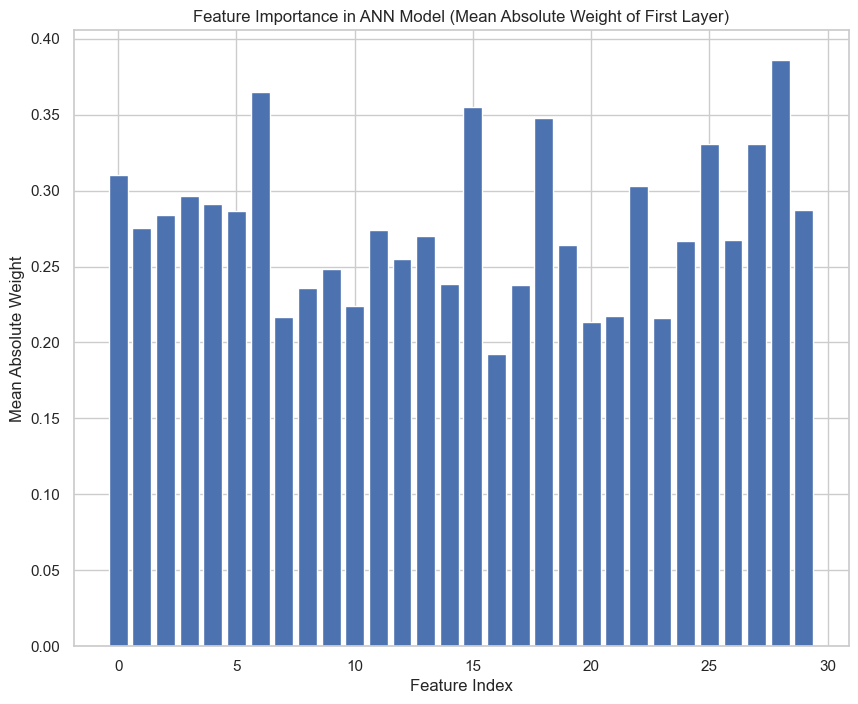

In [64]:
weights, biases = model.layers[0].get_weights()
plt.figure(figsize=(10, 8))
plt.bar(range(len(weights)), np.mean(abs(weights), axis=1))
plt.xlabel('Feature Index')
plt.ylabel('Mean Absolute Weight')
plt.title('Feature Importance in ANN Model (Mean Absolute Weight of First Layer)')
plt.show()


In [75]:
y_probs = model.predict(X_test_scaled) 


roc_auc = roc_auc_score(y_test, y_probs.ravel())  

print(f"ROC-AUC Score: {roc_auc:.4f}")


1781/1781 ━━━━━━━━━━━━━━━━━━━━ 0s 211us/step
ROC-AUC Score: 0.9877


# ANN METRİCS

Epoch 1/10


/Users/onurcikla/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 296us/step - accuracy: 0.9937 - loss: 0.0301
Epoch 2/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 299us/step - accuracy: 0.9995 - loss: 0.0025
Epoch 3/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 293us/step - accuracy: 0.9994 - loss: 0.0025
Epoch 4/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 292us/step - accuracy: 0.9995 - loss: 0.0023
Epoch 5/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 290us/step - accuracy: 0.9994 - loss: 0.0025
Epoch 6/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 304us/step - accuracy: 0.9996 - loss: 0.0019
Epoch 7/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 290us/step - accuracy: 0.9996 - loss: 0.0021
Epoch 8/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 295us/step - accuracy: 0.9995 - loss: 0.0020
Epoch 9/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 291us/step - accuracy: 0.9996 - loss: 0.0016
Epoch 10/10
7121/7121 ━━━━━━━━━━━━━━━━━━━━ 2s 296us/step - accuracy: 0.9997 - loss: 0.0015
1781/1781 ━━━━━━━━━━━━━━━━━━━━ 0s 204us/step
1781/1781 ━━━━━━━━━━━━━━━━━━━━ 0s 191us/step


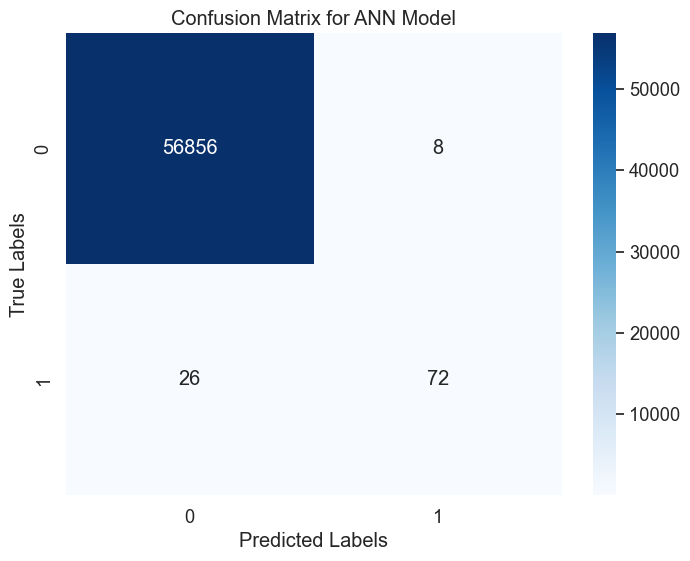

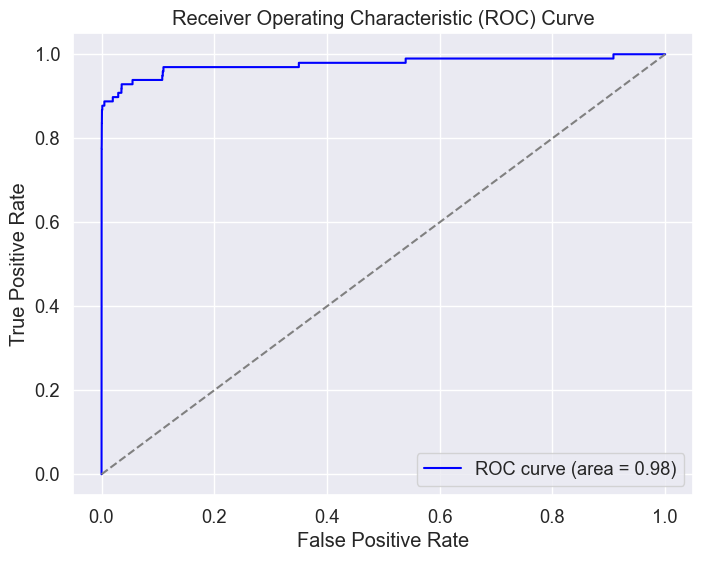

Accuracy: 0.9994
Precision: 0.9000
Sensitivity (Recall): 0.7347
Specificity: 0.9999
F1 Score: 0.8090
Matthews Correlation Coefficient: 0.8129
Balanced Classification Rate: 0.8673
True Positive Rate: 0.7347
False Positive Rate: 0.0001
True Negative Rate: 0.9999
False Negative Rate: 0.2653


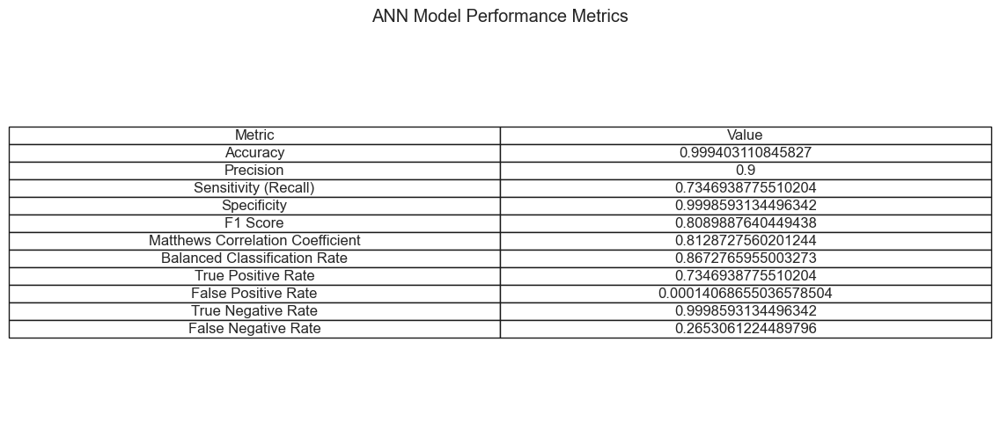

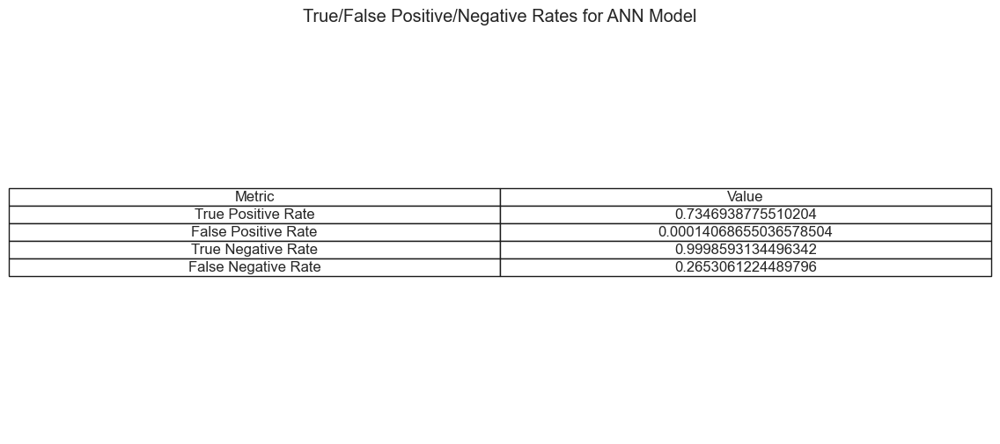

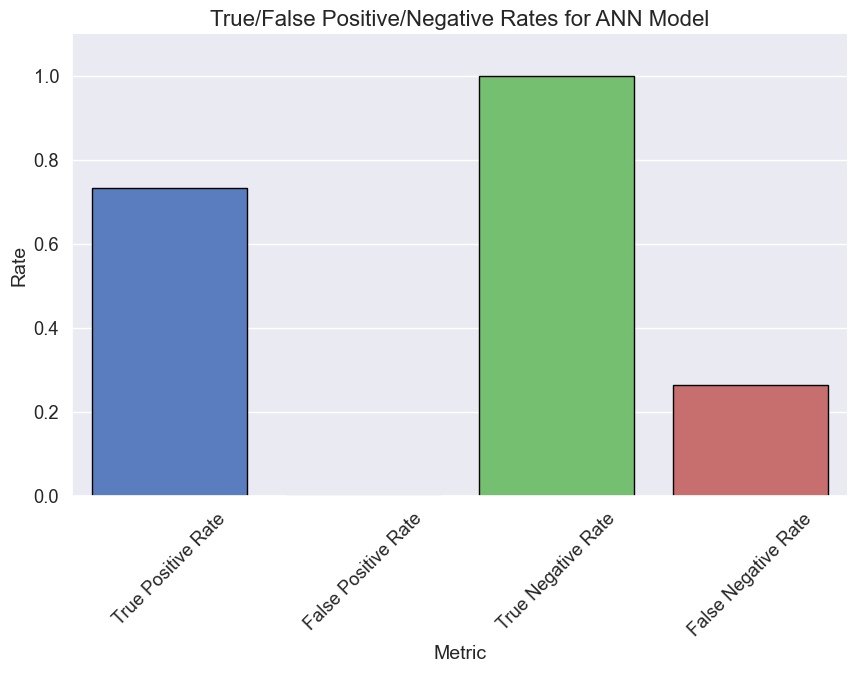

In [142]:
model = Sequential([
    Dense(30, input_shape=(X_train_scaled.shape[1],), activation='relu'),
    Dense(15, activation='relu'),
    Dense(1, activation='sigmoid')
])
model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])
model.fit(X_train_scaled, y_train, epochs=10, batch_size=32)

y_preds = (model.predict(X_test_scaled) > 0.5).astype(int).flatten()
y_probs = model.predict(X_test_scaled).flatten()

accuracy = accuracy_score(y_test, y_preds)
precision = precision_score(y_test, y_preds)
recall = recall_score(y_test, y_preds)
f1 = f1_score(y_test, y_preds)
mcc = matthews_corrcoef(y_test, y_preds)
balanced_rate = balanced_accuracy_score(y_test, y_preds)

cm = confusion_matrix(y_test, y_preds)
TPR = recall
TNR = cm[0, 0] / (cm[0, 0] + cm[0, 1])
FPR = cm[0, 1] / (cm[0, 0] + cm[0, 1])
FNR = cm[1, 0] / (cm[1, 0] + cm[1, 1])


plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for ANN Model')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


roc_auc = roc_auc_score(y_test, y_probs)
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Sensitivity (Recall): {recall:.4f}')
print(f'Specificity: {TNR:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Matthews Correlation Coefficient: {mcc:.4f}')
print(f'Balanced Classification Rate: {balanced_rate:.4f}')
print(f'True Positive Rate: {TPR:.4f}')
print(f'False Positive Rate: {FPR:.4f}')
print(f'True Negative Rate: {TNR:.4f}')
print(f'False Negative Rate: {FNR:.4f}')


data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score',
               'Matthews Correlation Coefficient', 'Balanced Classification Rate',
               'True Positive Rate', 'False Positive Rate', 'True Negative Rate',
               'False Negative Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate, TPR, FPR, TNR, FNR]
}

results_df = pd.DataFrame(data)

plt.figure(figsize=(12, 6))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False)  
ax.xaxis.set_visible(False)  
ax.yaxis.set_visible(False) 
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2) 
plt.title('ANN Model Performance Metrics')
plt.show()


data = {
    'Metric': ['True Positive Rate', 'False Positive Rate', 'True Negative Rate', 'False Negative Rate'],
    'Value': [TPR, FPR, TNR, FNR]
}

results_df = pd.DataFrame(data)

plt.figure(figsize=(12, 6))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False) 
ax.xaxis.set_visible(False)  
ax.yaxis.set_visible(False)  
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)  
plt.title('True/False Positive/Negative Rates for ANN Model')
plt.show()


plt.figure(figsize=(10, 6))
sns.barplot(x='Metric', y='Value', data=results_df, palette='muted', edgecolor='black')
plt.ylim(0, 1.1)  
plt.title('True/False Positive/Negative Rates for ANN Model', fontsize=16)
plt.ylabel('Rate', fontsize=14)
plt.xlabel('Metric', fontsize=14)
plt.xticks(rotation=45)
sns.despine()
plt.show()



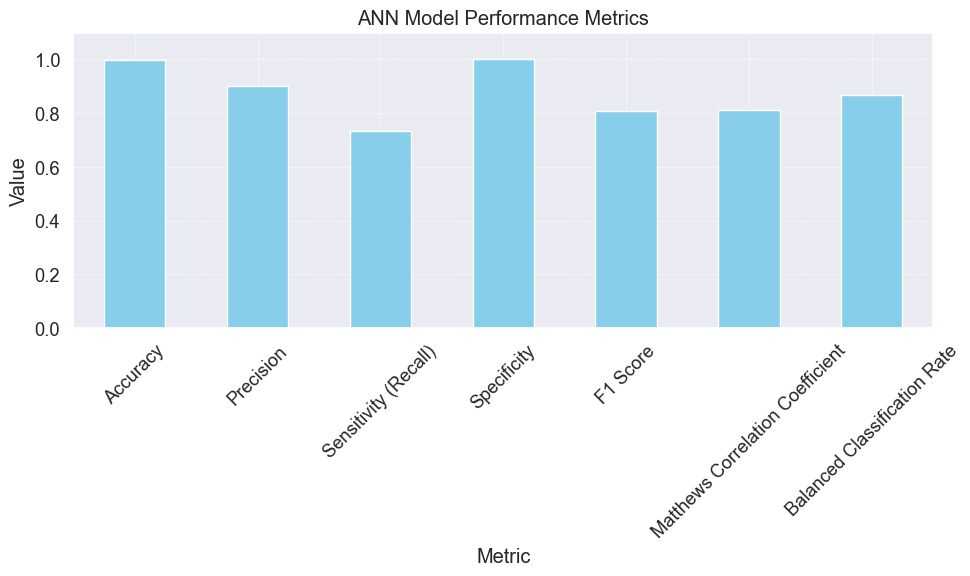

In [143]:
data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score', 'Matthews Correlation Coefficient', 'Balanced Classification Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate] 
}

metrics_df = pd.DataFrame(data)

fig, ax = plt.subplots(figsize=(10, 6))  

metrics_df.plot(kind='bar', x='Metric', y='Value', legend=None, ax=ax, color='skyblue')
plt.title('ANN Model Performance Metrics') 
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45) 
plt.ylim(0, 1.1)  
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()  

plt.show()



# 8- LOGİSTİC REGRESSİON

Lojistik Regresyon Modeli Performansı:
[[56855     9]
 [   41    57]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.86      0.58      0.70        98

    accuracy                           1.00     56962
   macro avg       0.93      0.79      0.85     56962
weighted avg       1.00      1.00      1.00     56962

ROC-AUC Score: 0.9747639911338762


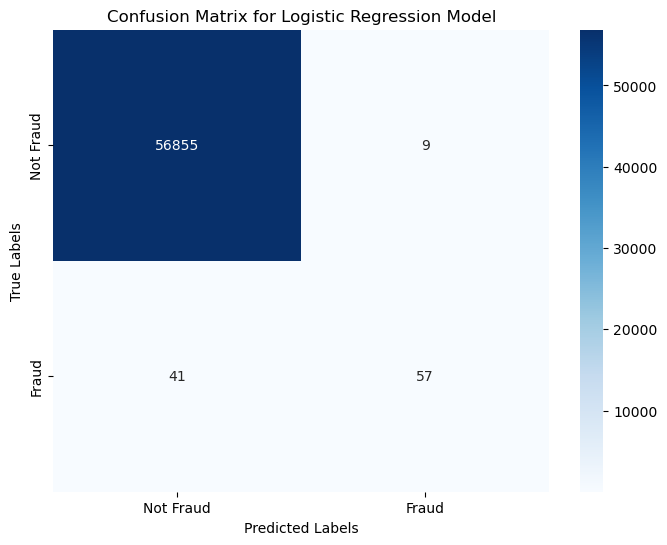

In [37]:
# Veriyi ölçeklendirme (StandardScaler ile)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # Eğitim verisini ölçeklendir
X_test_scaled = scaler.transform(X_test)  # Test verisini ölçeklendir

# Lojistik Regresyon Modeli
logistic_model = LogisticRegression(solver='liblinear', random_state=42)
logistic_model.fit(X_train_scaled, y_train)

# Tahminler
y_pred = logistic_model.predict(X_test_scaled)
y_proba = logistic_model.predict_proba(X_test_scaled)[:, 1]

# Model performansı
print("Lojistik Regresyon Modeli Performansı:")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba))

# Confusion Matrix görselleştirme
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues',
            xticklabels=['Not Fraud', 'Fraud'], yticklabels=['Not Fraud', 'Fraud'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for Logistic Regression Model')
plt.show()

# 8- LOGİSTİC REGRESSİON METRİCS

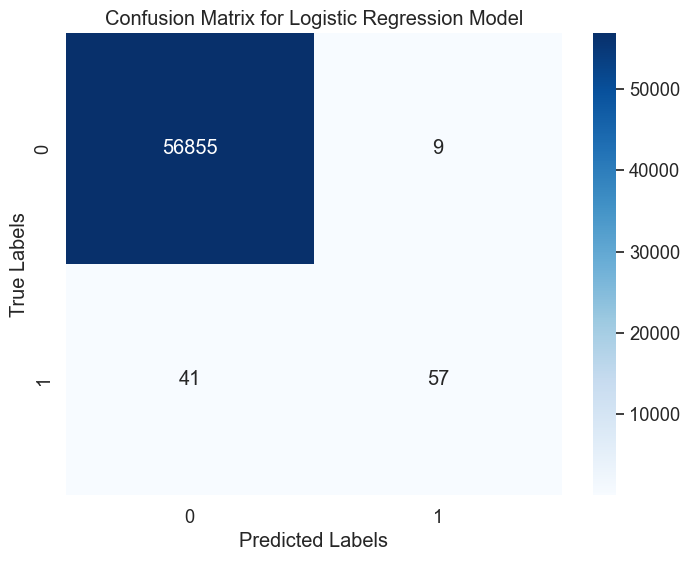

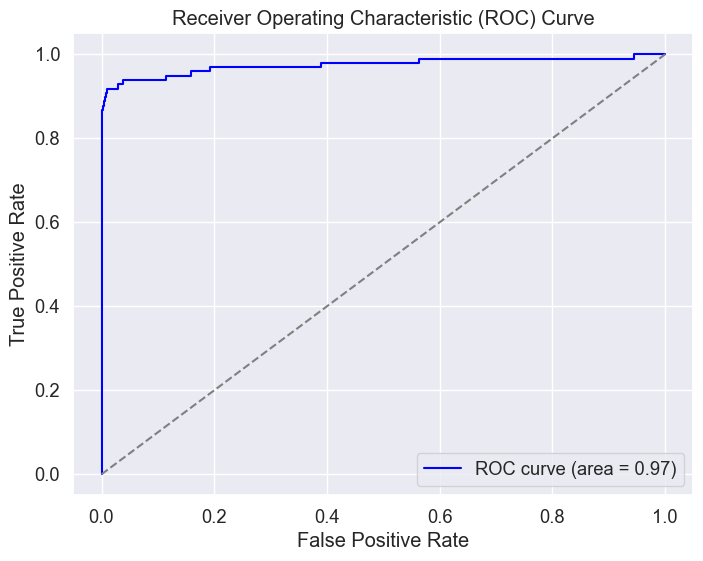

Accuracy: 0.9991
Precision: 0.8636
Sensitivity (Recall): 0.5816
Specificity: 0.9998
F1 Score: 0.6951
Matthews Correlation Coefficient: 0.7084
Balanced Classification Rate: 0.7907
True Positive Rate: 0.5816
False Positive Rate: 0.0002
True Negative Rate: 0.9998
False Negative Rate: 0.4184


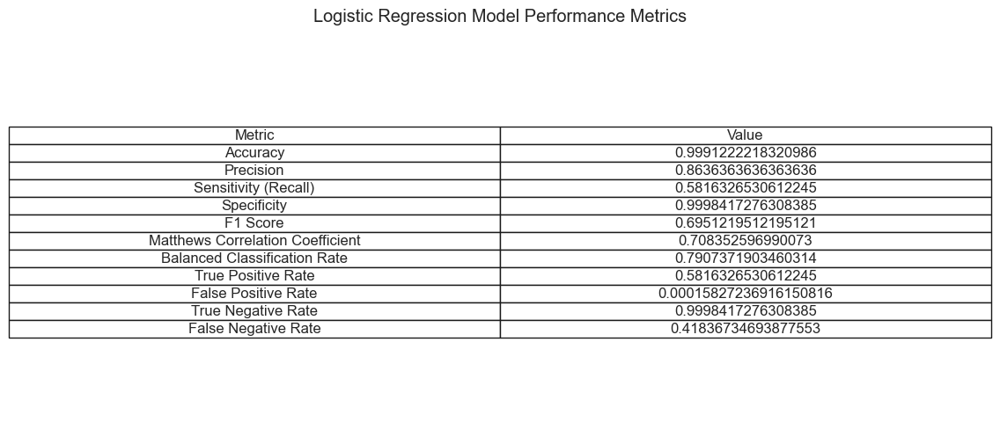

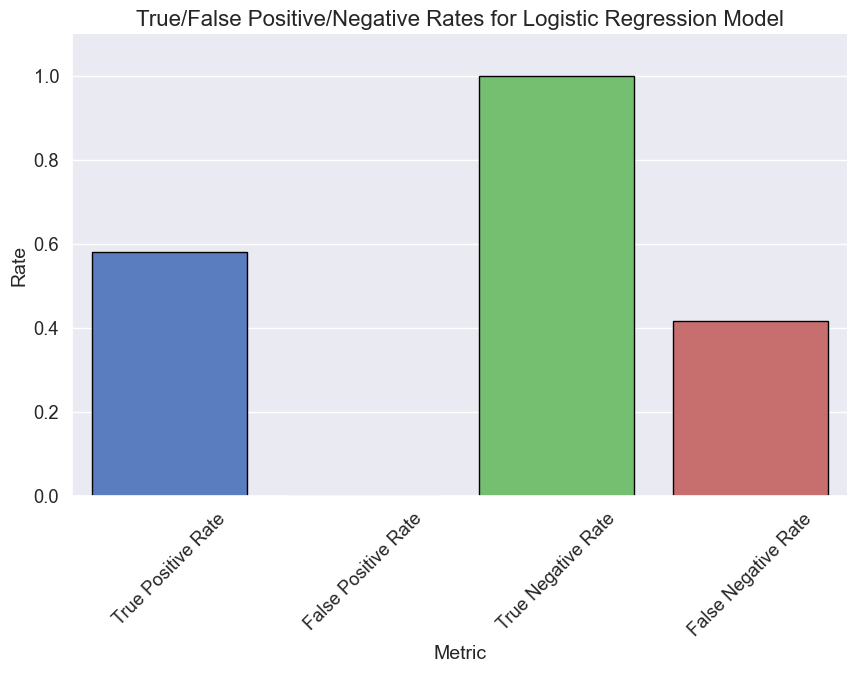

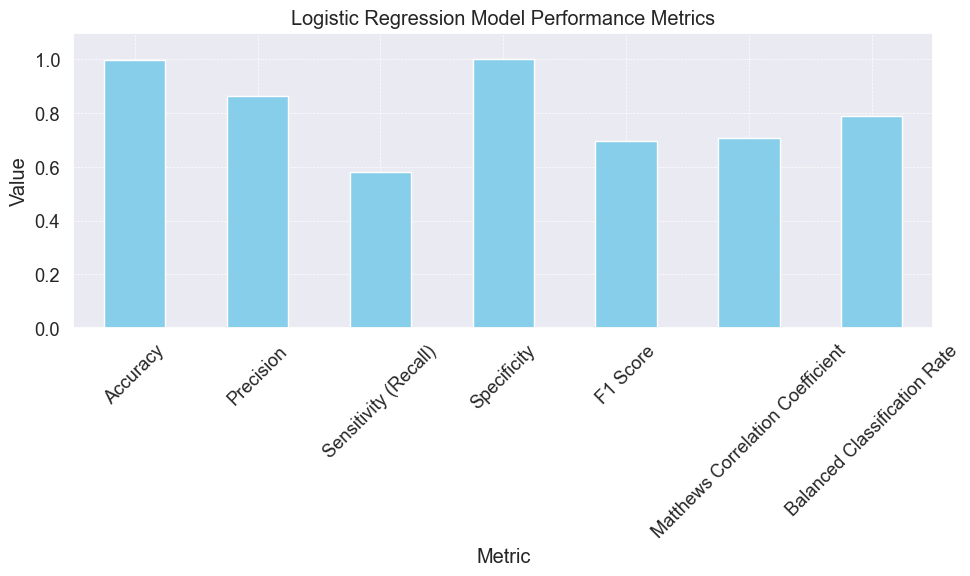

In [144]:
logistic_model = LogisticRegression(solver='liblinear', random_state=42)
logistic_model.fit(X_train_scaled, y_train)

y_preds = logistic_model.predict(X_test_scaled)
y_probs = logistic_model.predict_proba(X_test_scaled)[:, 1]

accuracy = accuracy_score(y_test, y_preds)
precision = precision_score(y_test, y_preds)
recall = recall_score(y_test, y_preds)
f1 = f1_score(y_test, y_preds)
mcc = matthews_corrcoef(y_test, y_preds)
balanced_rate = balanced_accuracy_score(y_test, y_preds)

cm = confusion_matrix(y_test, y_preds)
TPR = recall
TNR = cm[0, 0] / (cm[0, 0] + cm[0, 1])
FPR = cm[0, 1] / (cm[0, 0] + cm[0, 1])
FNR = cm[1, 0] / (cm[1, 0] + cm[1, 1])

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for Logistic Regression Model')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

roc_auc = roc_auc_score(y_test, y_probs)
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Sensitivity (Recall): {recall:.4f}')
print(f'Specificity: {TNR:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Matthews Correlation Coefficient: {mcc:.4f}')
print(f'Balanced Classification Rate: {balanced_rate:.4f}')
print(f'True Positive Rate: {TPR:.4f}')
print(f'False Positive Rate: {FPR:.4f}')
print(f'True Negative Rate: {TNR:.4f}')
print(f'False Negative Rate: {FNR:.4f}')

data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score',
               'Matthews Correlation Coefficient', 'Balanced Classification Rate',
               'True Positive Rate', 'False Positive Rate', 'True Negative Rate',
               'False Negative Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate, TPR, FPR, TNR, FNR]
}

results_df = pd.DataFrame(data)
plt.figure(figsize=(12, 6))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)
plt.title('Logistic Regression Model Performance Metrics')
plt.show()

rate_df = pd.DataFrame({
    'Metric': ['True Positive Rate', 'False Positive Rate', 'True Negative Rate', 'False Negative Rate'],
    'Value': [TPR, FPR, TNR, FNR]
})
plt.figure(figsize=(10, 6))
sns.barplot(x='Metric', y='Value', data=rate_df, palette='muted', edgecolor='black')
plt.ylim(0, 1.1)
plt.title('True/False Positive/Negative Rates for Logistic Regression Model', fontsize=16)
plt.ylabel('Rate', fontsize=14)
plt.xlabel('Metric', fontsize=14)
plt.xticks(rotation=45)
sns.despine()
plt.show()

metrics_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score', 
               'Matthews Correlation Coefficient', 'Balanced Classification Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate]
})
fig, ax = plt.subplots(figsize=(10, 6))
metrics_df.plot(kind='bar', x='Metric', y='Value', legend=None, ax=ax, color='skyblue')
plt.title('Logistic Regression Model Performance Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.ylim(0, 1.1)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


# 9 - Anomaly Detection

Performance of Anomaly Detection using Isolation Forest:
[[56825    39]
 [   73    25]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.39      0.26      0.31        98

    accuracy                           1.00     56962
   macro avg       0.69      0.63      0.65     56962
weighted avg       1.00      1.00      1.00     56962



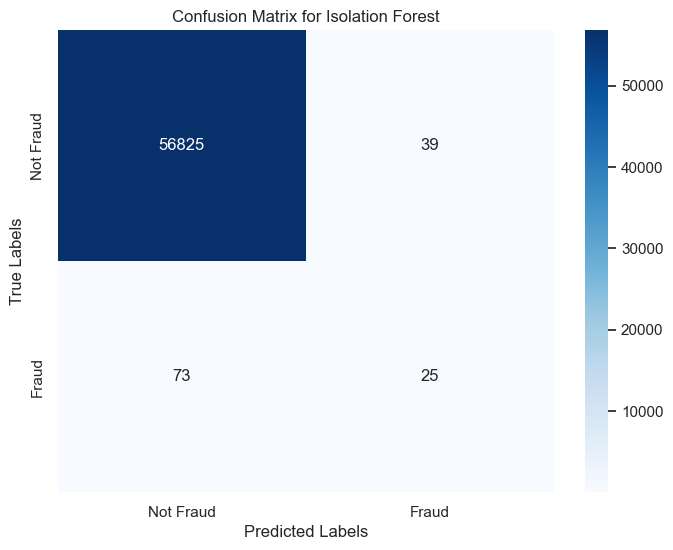

In [69]:
isolation_forest = IsolationForest(contamination=0.001, random_state=42)
y_pred_train = isolation_forest.fit_predict(X_train_scaled)
y_pred_test = isolation_forest.predict(X_test_scaled)

y_pred_test = [1 if pred == -1 else 0 for pred in y_pred_test]

print("Performance of Anomaly Detection using Isolation Forest:")
print(confusion_matrix(y_test, y_pred_test))
print(classification_report(y_test, y_pred_test))

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred_test), annot=True, fmt='d', cmap='Blues', xticklabels=['Not Fraud', 'Fraud'], yticklabels=['Not Fraud', 'Fraud'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for Isolation Forest')
plt.show()


In [77]:
iso_forest = IsolationForest(contamination=0.001, random_state=42)
iso_forest.fit(X_train_scaled)


scores = iso_forest.decision_function(X_test_scaled)
y_pred = iso_forest.predict(X_test_scaled)

y_pred = np.where(y_pred == 1, 0, 1)  

scores = -scores  
scores_min, scores_max = min(scores), max(scores)
scores_normalized = (scores - scores_min) / (scores_max - scores_min)  


roc_auc = roc_auc_score(y_test, scores_normalized)

print(f"ROC-AUC Score: {roc_auc:.4f}")


ROC-AUC Score: 0.9543


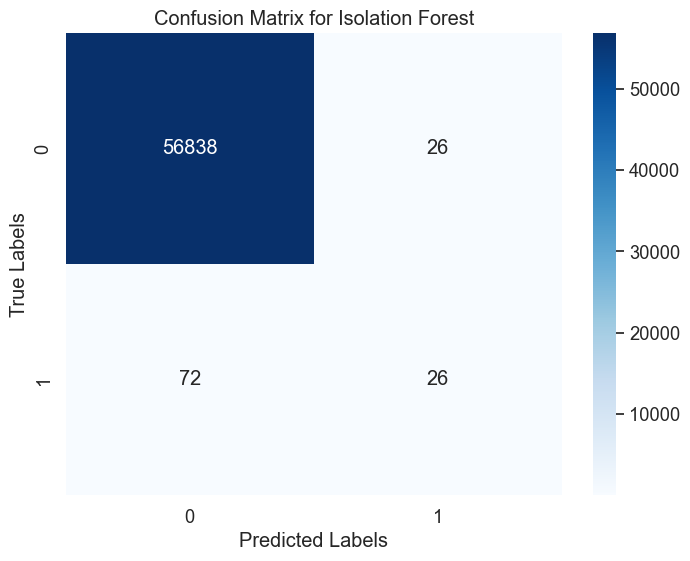

Accuracy: 0.9983
Precision: 0.5000
Sensitivity (Recall): 0.2653
Specificity: 0.9995
F1 Score: 0.3467
Matthews Correlation Coefficient: 0.3634
Balanced Classification Rate: 0.6324
True Positive Rate: 0.2653
False Positive Rate: 0.0005
True Negative Rate: 0.9995
False Negative Rate: 0.7347


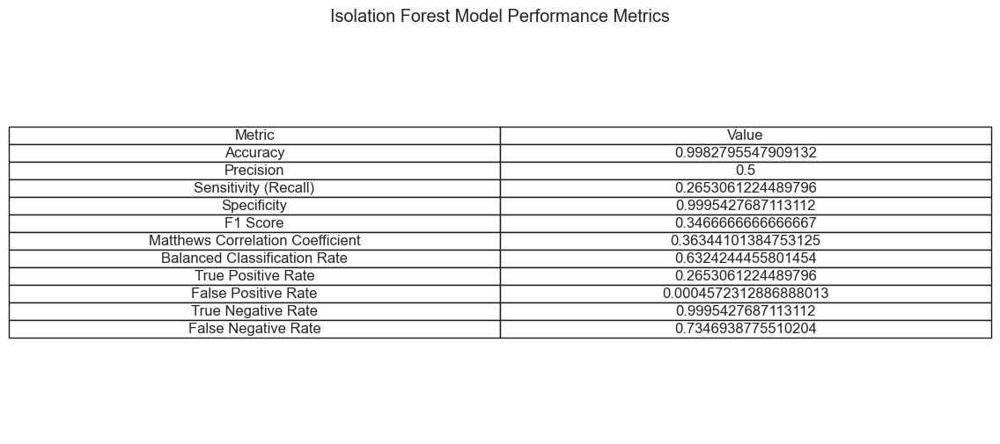

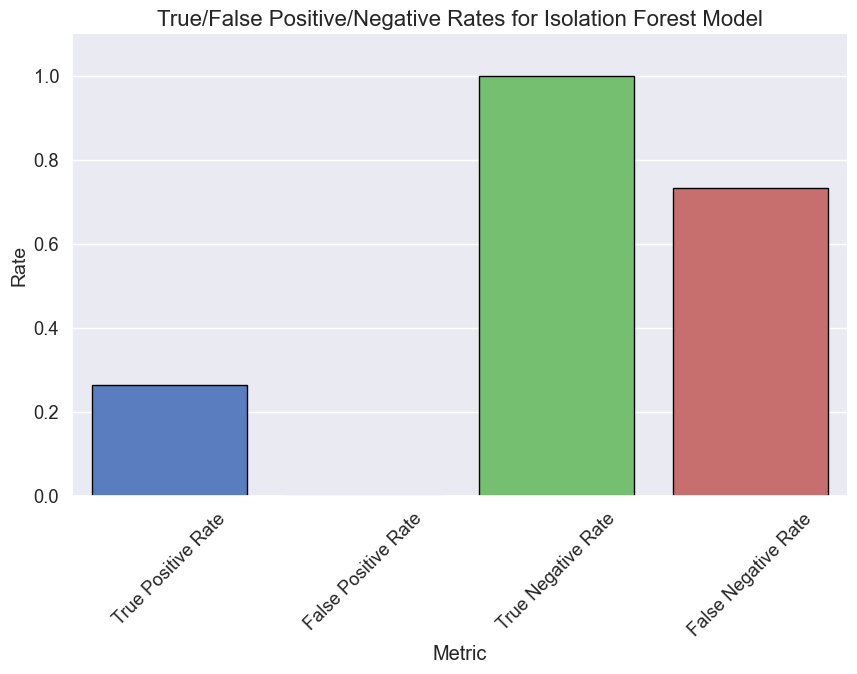

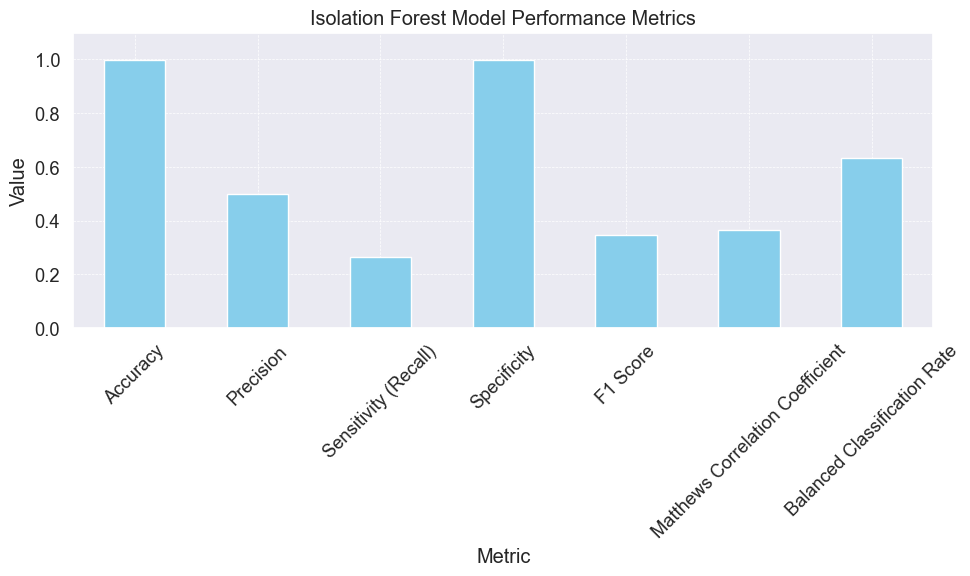

In [145]:
isolation_forest = IsolationForest(contamination=0.001, random_state=42)
y_pred_train = isolation_forest.fit_predict(X_train_scaled)
y_pred_test = isolation_forest.predict(X_test_scaled)

y_pred_test = np.where(y_pred_test == -1, 1, 0)

accuracy = accuracy_score(y_test, y_pred_test)
precision = precision_score(y_test, y_pred_test)
recall = recall_score(y_test, y_pred_test)
f1 = f1_score(y_test, y_pred_test)
mcc = matthews_corrcoef(y_test, y_pred_test)
balanced_rate = balanced_accuracy_score(y_test, y_pred_test)

cm = confusion_matrix(y_test, y_pred_test)
TPR = recall
TNR = cm[0, 0] / (cm[0, 0] + cm[0, 1])
FPR = cm[0, 1] / (cm[0, 0] + cm[0, 1])
FNR = cm[1, 0] / (cm[1, 0] + cm[1, 1])

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for Isolation Forest')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Sensitivity (Recall): {recall:.4f}')
print(f'Specificity: {TNR:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Matthews Correlation Coefficient: {mcc:.4f}')
print(f'Balanced Classification Rate: {balanced_rate:.4f}')
print(f'True Positive Rate: {TPR:.4f}')
print(f'False Positive Rate: {FPR:.4f}')
print(f'True Negative Rate: {TNR:.4f}')
print(f'False Negative Rate: {FNR:.4f}')


data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score',
               'Matthews Correlation Coefficient', 'Balanced Classification Rate',
               'True Positive Rate', 'False Positive Rate', 'True Negative Rate',
               'False Negative Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate, TPR, FPR, TNR, FNR]
}

results_df = pd.DataFrame(data)
plt.figure(figsize=(12, 6))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)
plt.title('Isolation Forest Model Performance Metrics')
plt.show()


rate_df = pd.DataFrame({
    'Metric': ['True Positive Rate', 'False Positive Rate', 'True Negative Rate', 'False Negative Rate'],
    'Value': [TPR, FPR, TNR, FNR]
})
plt.figure(figsize=(10, 6))
sns.barplot(x='Metric', y='Value', data=rate_df, palette='muted', edgecolor='black')
plt.ylim(0, 1.1)
plt.title('True/False Positive/Negative Rates for Isolation Forest Model', fontsize=16)
plt.ylabel('Rate', fontsize=14)
plt.xlabel('Metric')
plt.xticks(rotation=45)
sns.despine()
plt.show()


metrics_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score', 
               'Matthews Correlation Coefficient', 'Balanced Classification Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate]
})
fig, ax = plt.subplots(figsize=(10, 6))
metrics_df.plot(kind='bar', x='Metric', y='Value', legend=None, ax=ax, color='skyblue')
plt.title('Isolation Forest Model Performance Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.ylim(0, 1.1)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


# 10 - DECİSİON TREE 

Performance of Decision Tree Model:
[[56854    10]
 [   22    76]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.88      0.78      0.83        98

    accuracy                           1.00     56962
   macro avg       0.94      0.89      0.91     56962
weighted avg       1.00      1.00      1.00     56962

ROC-AUC Score: 0.9080443815821208


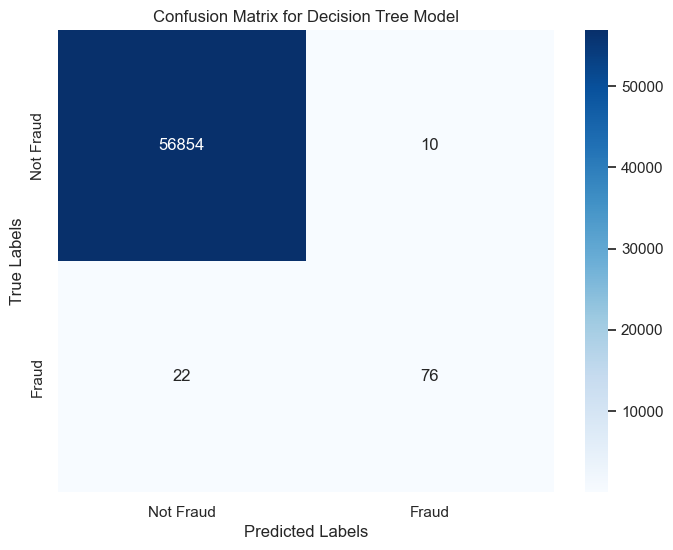

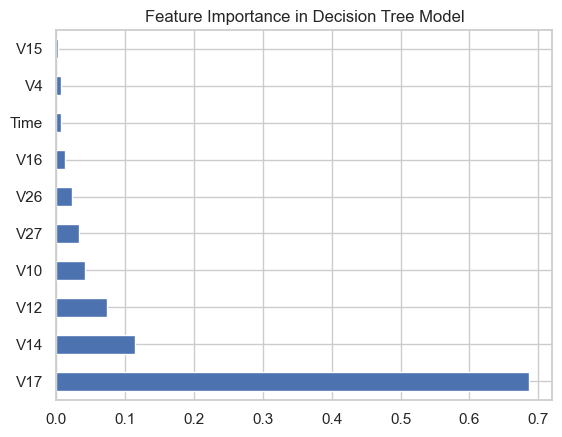

In [71]:
decision_tree_model = DecisionTreeClassifier(random_state=42, max_depth=5, min_samples_split=10, min_samples_leaf=5)


decision_tree_model.fit(X_train_scaled, y_train)

y_pred = decision_tree_model.predict(X_test_scaled)
y_proba = decision_tree_model.predict_proba(X_test_scaled)[:, 1]

print("Performance of Decision Tree Model:")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba))

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues', xticklabels=['Not Fraud', 'Fraud'], yticklabels=['Not Fraud', 'Fraud'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for Decision Tree Model')
plt.show()

feature_importances = pd.Series(decision_tree_model.feature_importances_, index=X.columns)
feature_importances.nlargest(10).plot(kind='barh')
plt.title('Feature Importance in Decision Tree Model')
plt.show()


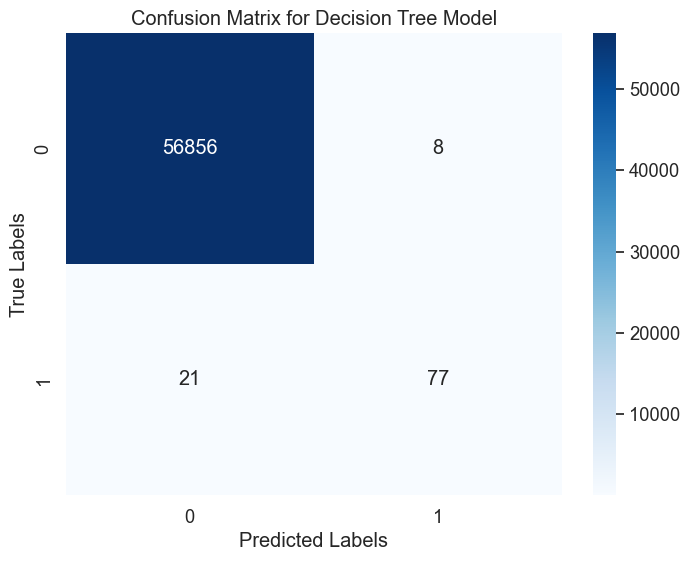

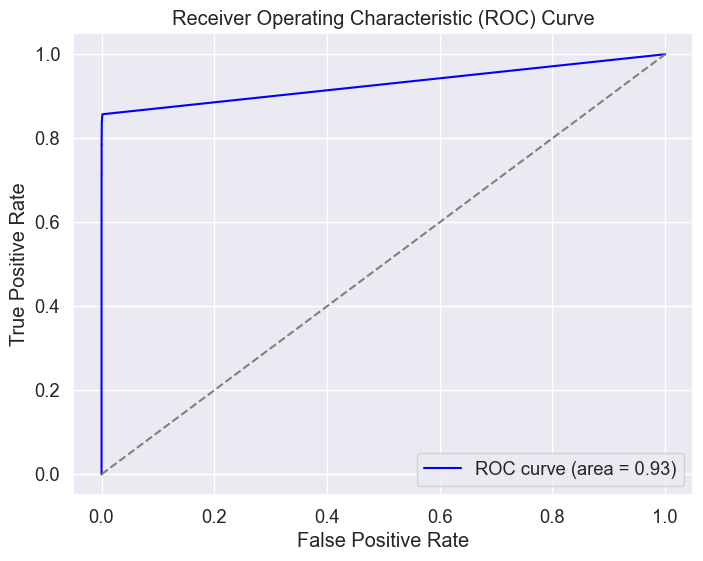

Accuracy: 0.9995
Precision: 0.9059
Sensitivity (Recall): 0.7857
Specificity: 0.9999
F1 Score: 0.8415
Matthews Correlation Coefficient: 0.8434
Balanced Classification Rate: 0.8928
True Positive Rate: 0.7857
False Positive Rate: 0.0001
True Negative Rate: 0.9999
False Negative Rate: 0.2143


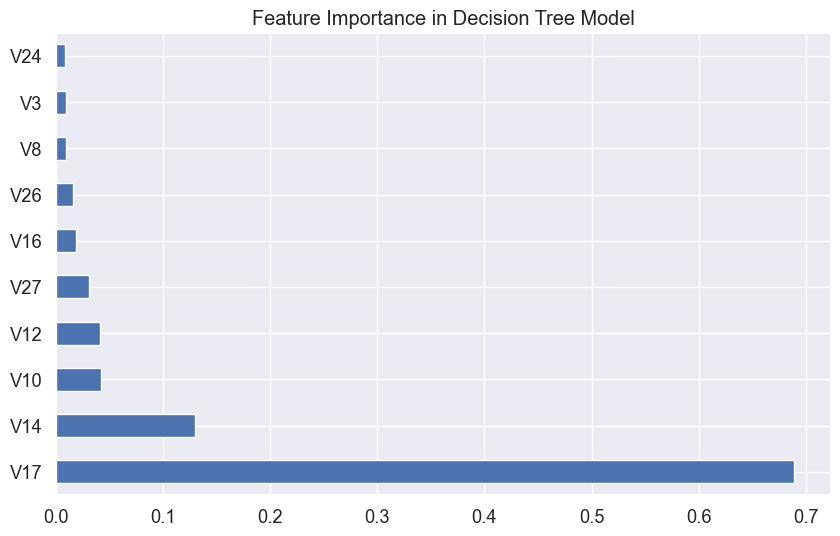

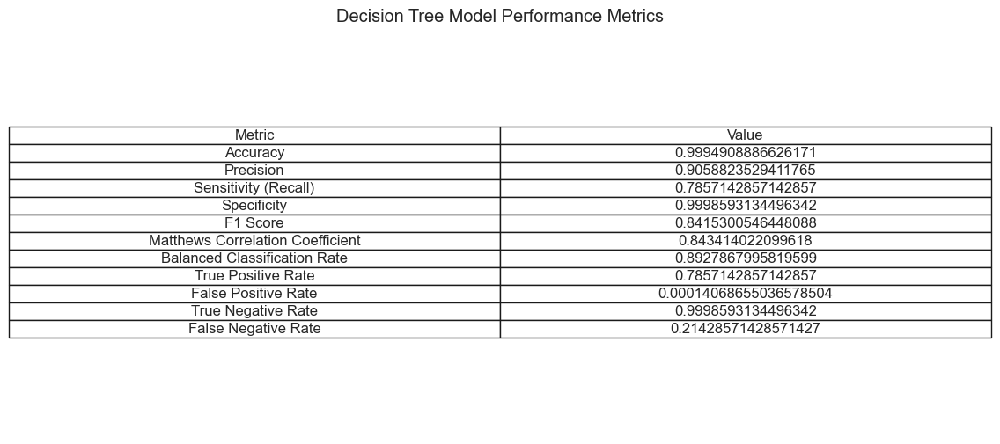

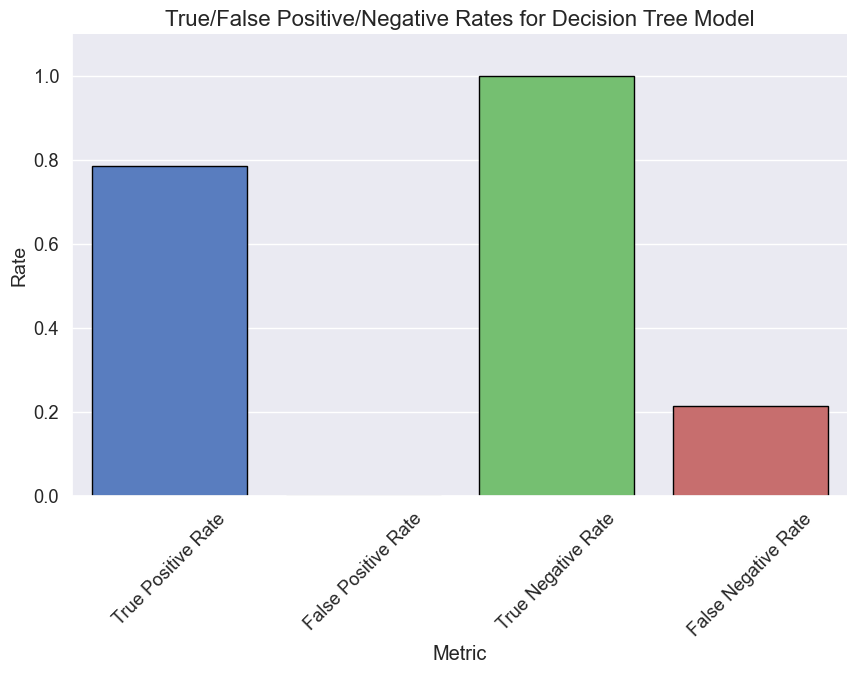

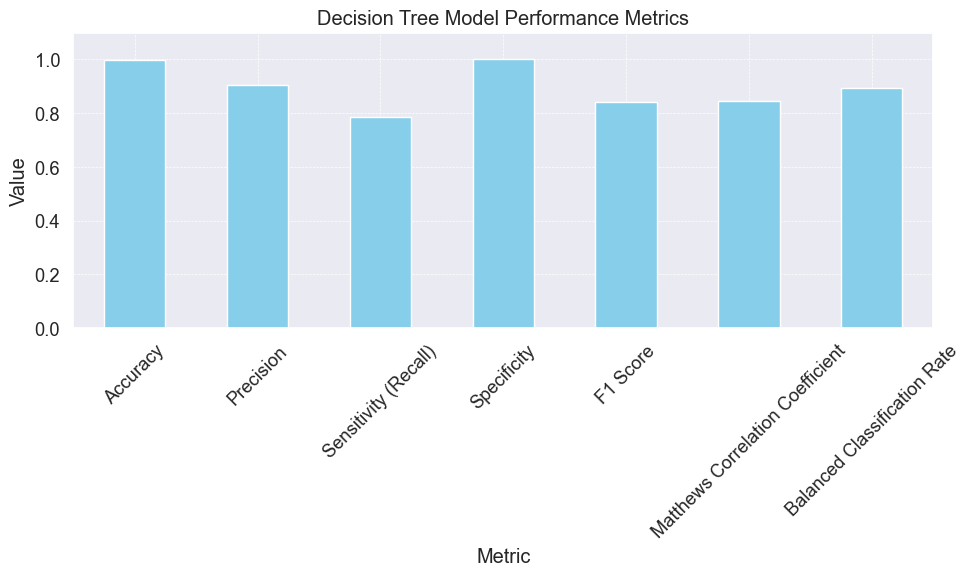

In [146]:
decision_tree_model = DecisionTreeClassifier(random_state=42, max_depth=5, min_samples_split=10, min_samples_leaf=5)
decision_tree_model.fit(X_train_scaled, y_train)


y_pred = decision_tree_model.predict(X_test_scaled)
y_proba = decision_tree_model.predict_proba(X_test_scaled)[:, 1]


accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
mcc = matthews_corrcoef(y_test, y_pred)
balanced_rate = balanced_accuracy_score(y_test, y_pred)

cm = confusion_matrix(y_test, y_pred)
TPR = recall
TNR = cm[0, 0] / (cm[0, 0] + cm[0, 1])
FPR = cm[0, 1] / (cm[0, 0] + cm[0, 1])
FNR = cm[1, 0] / (cm[1, 0] + cm[1, 1])


plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for Decision Tree Model')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


roc_auc = roc_auc_score(y_test, y_proba)
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Sensitivity (Recall): {recall:.4f}')
print(f'Specificity: {TNR:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Matthews Correlation Coefficient: {mcc:.4f}')
print(f'Balanced Classification Rate: {balanced_rate:.4f}')
print(f'True Positive Rate: {TPR:.4f}')
print(f'False Positive Rate: {FPR:.4f}')
print(f'True Negative Rate: {TNR:.4f}')
print(f'False Negative Rate: {FNR:.4f}')


plt.figure(figsize=(10, 6))
feature_importances = pd.Series(decision_tree_model.feature_importances_, index=X.columns)
feature_importances.nlargest(10).plot(kind='barh')
plt.title('Feature Importance in Decision Tree Model')
plt.show()


data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score',
               'Matthews Correlation Coefficient', 'Balanced Classification Rate',
               'True Positive Rate', 'False Positive Rate', 'True Negative Rate',
               'False Negative Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate, TPR, FPR, TNR, FNR]
}
results_df = pd.DataFrame(data)
plt.figure(figsize=(12, 6))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)
plt.title('Decision Tree Model Performance Metrics')
plt.show()


rate_df = pd.DataFrame({
    'Metric': ['True Positive Rate', 'False Positive Rate', 'True Negative Rate', 'False Negative Rate'],
    'Value': [TPR, FPR, TNR, FNR]
})
plt.figure(figsize=(10, 6))
sns.barplot(x='Metric', y='Value', data=rate_df, palette='muted', edgecolor='black')
plt.ylim(0, 1.1)
plt.title('True/False Positive/Negative Rates for Decision Tree Model', fontsize=16)
plt.ylabel('Rate', fontsize=14)
plt.xlabel('Metric')
plt.xticks(rotation=45)
sns.despine()
plt.show()

metrics_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score', 
               'Matthews Correlation Coefficient', 'Balanced Classification Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate]
})
fig, ax = plt.subplots(figsize=(10, 6))
metrics_df.plot(kind='bar', x='Metric', y='Value', legend=None, ax=ax, color='skyblue')
plt.title('Decision Tree Model Performance Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.ylim(0, 1.1)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


# 11- NAİVE BAYES

In [82]:
nb_model = GaussianNB()
nb_model.fit(X_train_scaled, y_train)


y_pred = nb_model.predict(X_test_scaled)
y_probs = nb_model.predict_proba(X_test_scaled)[:, 1]  


conf_matrix = confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_probs)


print("Confusion Matrix:\n", conf_matrix)
print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1 Score: {:.2f}".format(f1))
print("ROC AUC Score: {:.2f}".format(roc_auc))


Confusion Matrix:
 [[55619  1245]
 [   18    80]]
Accuracy: 0.98
Precision: 0.06
Recall: 0.82
F1 Score: 0.11
ROC AUC Score: 0.97


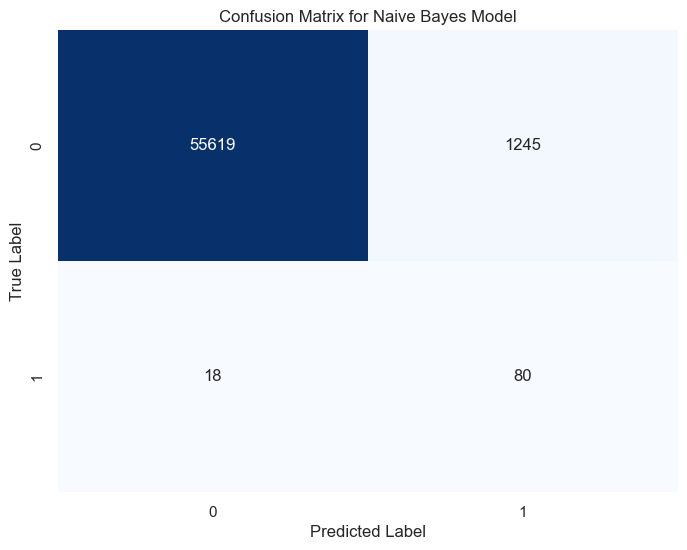

In [83]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Naive Bayes Model')
plt.show()


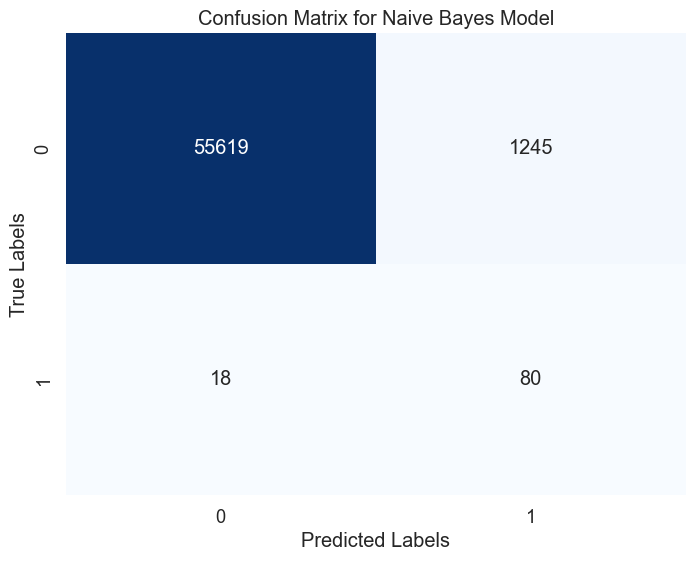

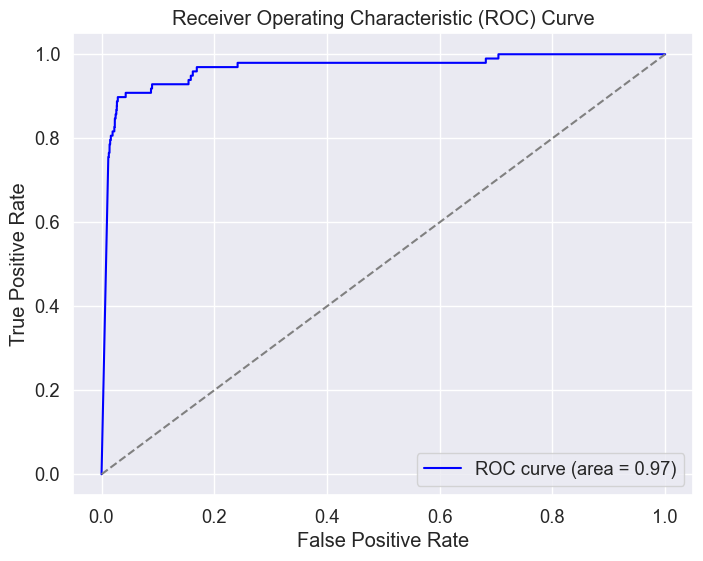

Confusion Matrix:
[[55619  1245]
 [   18    80]]
Accuracy: 0.9778
Precision: 0.0604
Sensitivity (Recall): 0.8163
Specificity: 0.9781
F1 Score: 0.1124
ROC AUC Score: 0.9671
Matthews Correlation Coefficient: 0.2184
Balanced Classification Rate: 0.8972
True Positive Rate: 0.8163
False Positive Rate: 0.0219
True Negative Rate: 0.9781
False Negative Rate: 0.1837


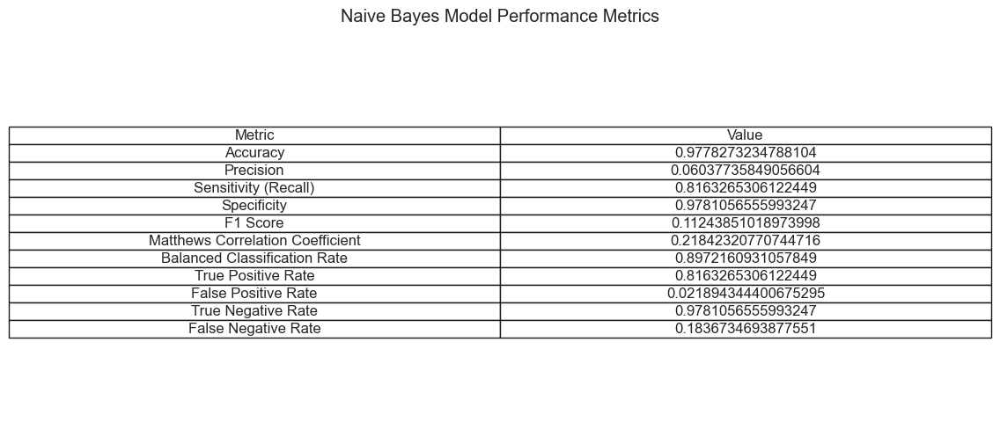

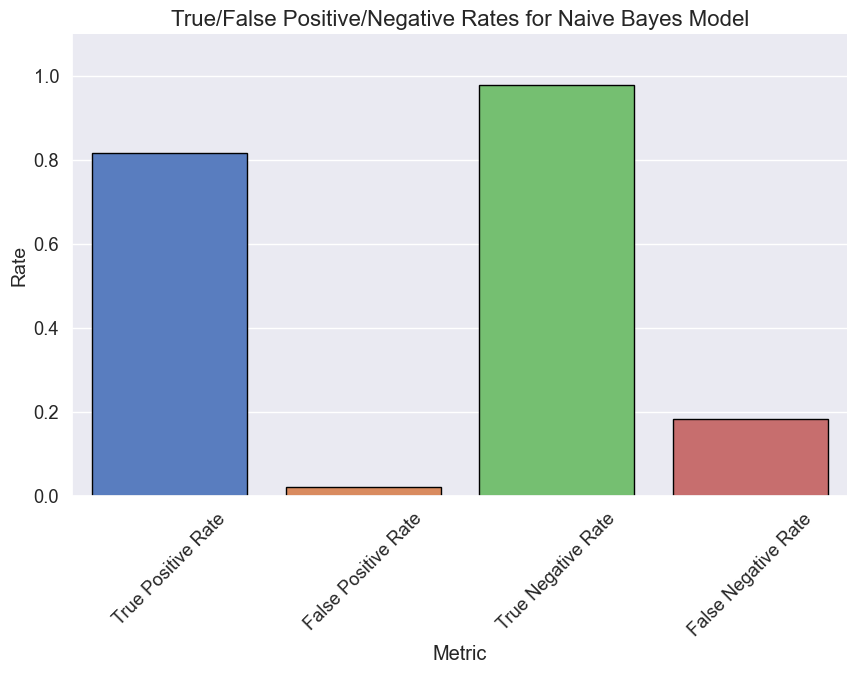

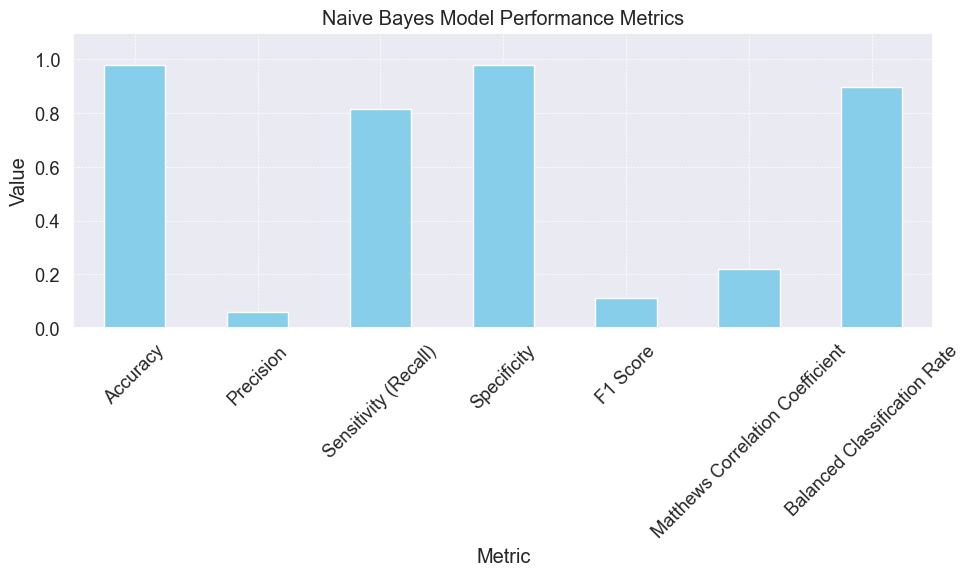

In [147]:
nb_model = GaussianNB()
nb_model.fit(X_train_scaled, y_train)


y_pred = nb_model.predict(X_test_scaled)
y_probs = nb_model.predict_proba(X_test_scaled)[:, 1]


accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
mcc = matthews_corrcoef(y_test, y_pred)
balanced_rate = balanced_accuracy_score(y_test, y_pred)

cm = confusion_matrix(y_test, y_pred)
TPR = recall
TNR = cm[0, 0] / (cm[0, 0] + cm[0, 1])
FPR = cm[0, 1] / (cm[0, 0] + cm[0, 1])
FNR = cm[1, 0] / (cm[1, 0] + cm[1, 1])


plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix for Naive Bayes Model')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


roc_auc = roc_auc_score(y_test, y_probs)
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


print(f'Confusion Matrix:\n{cm}')
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Sensitivity (Recall): {recall:.4f}')
print(f'Specificity: {TNR:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'ROC AUC Score: {roc_auc:.4f}')
print(f'Matthews Correlation Coefficient: {mcc:.4f}')
print(f'Balanced Classification Rate: {balanced_rate:.4f}')
print(f'True Positive Rate: {TPR:.4f}')
print(f'False Positive Rate: {FPR:.4f}')
print(f'True Negative Rate: {TNR:.4f}')
print(f'False Negative Rate: {FNR:.4f}')


data = {
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score',
               'Matthews Correlation Coefficient', 'Balanced Classification Rate',
               'True Positive Rate', 'False Positive Rate', 'True Negative Rate',
               'False Negative Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate, TPR, FPR, TNR, FNR]
}
results_df = pd.DataFrame(data)
plt.figure(figsize=(12, 6))
sns.set(font_scale=1.2)
ax = plt.subplot(111, frame_on=False)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
table = plt.table(cellText=results_df.values, colLabels=results_df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)
plt.title('Naive Bayes Model Performance Metrics')
plt.show()


rate_df = pd.DataFrame({
    'Metric': ['True Positive Rate', 'False Positive Rate', 'True Negative Rate', 'False Negative Rate'],
    'Value': [TPR, FPR, TNR, FNR]
})
plt.figure(figsize=(10, 6))
sns.barplot(x='Metric', y='Value', data=rate_df, palette='muted', edgecolor='black')
plt.ylim(0, 1.1)
plt.title('True/False Positive/Negative Rates for Naive Bayes Model', fontsize=16)
plt.ylabel('Rate', fontsize=14)
plt.xlabel('Metric')
plt.xticks(rotation=45)
sns.despine()
plt.show()


metrics_df = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Sensitivity (Recall)', 'Specificity', 'F1 Score', 
               'Matthews Correlation Coefficient', 'Balanced Classification Rate'],
    'Value': [accuracy, precision, recall, TNR, f1, mcc, balanced_rate]
})
fig, ax = plt.subplots(figsize=(10, 6))
metrics_df.plot(kind='bar', x='Metric', y='Value', legend=None, ax=ax, color='skyblue')
plt.title('Naive Bayes Model Performance Metrics')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.ylim(0, 1.1)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


# MODEL COMPARİSON

<Figure size 1200x800 with 0 Axes>

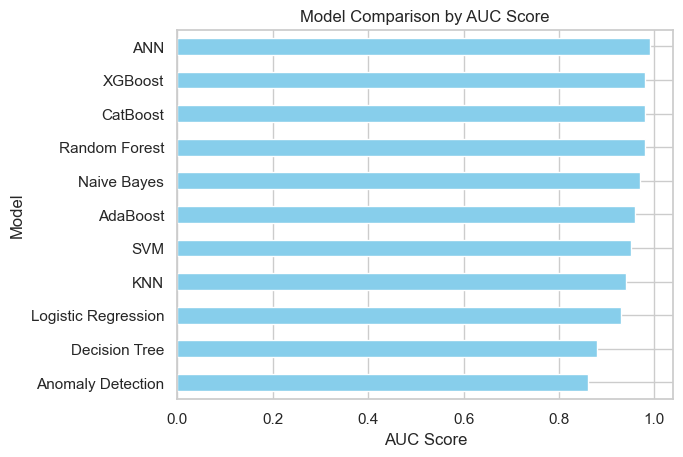

<Figure size 1200x800 with 0 Axes>

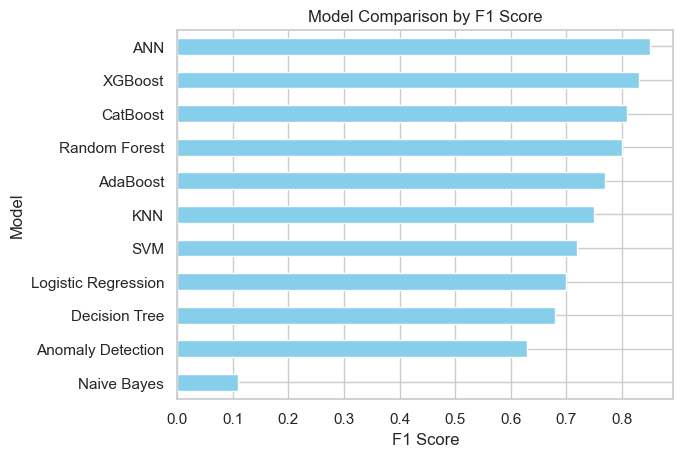

<Figure size 1200x800 with 0 Axes>

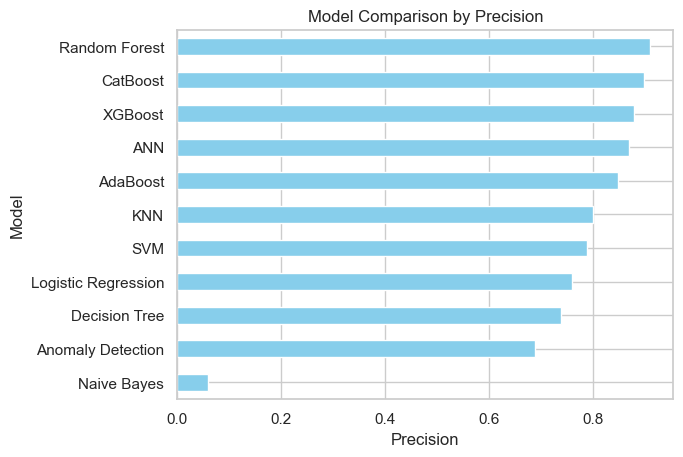

<Figure size 1200x800 with 0 Axes>

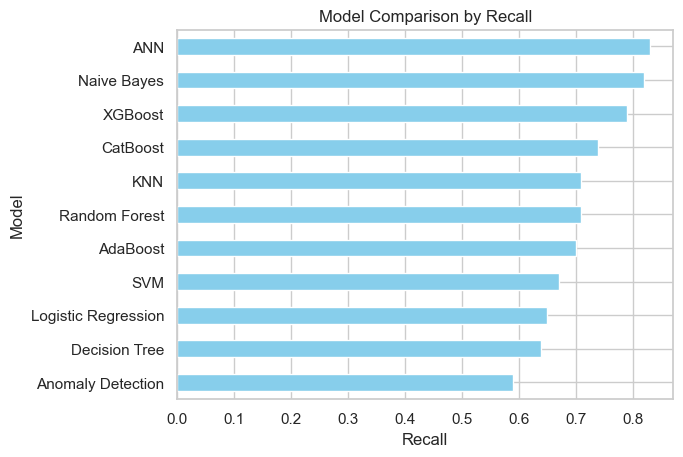

In [85]:
data = {
    'Model': [
        'Random Forest', 'AdaBoost', 'CatBoost', 'XGBoost', 'SVM', 'KNN', 'ANN', 
        'Logistic Regression', 'Decision Tree', 'Anomaly Detection'
    ],
    'AUC Score': [
        0.98, 0.96, 0.98, 0.98, 0.95, 0.94, 0.99, 0.93, 0.88, 0.86  
    ],
    'F1 Score': [
        0.80, 0.77, 0.81, 0.83, 0.72, 0.75, 0.85, 0.70, 0.68, 0.63  
    ],
    'Precision': [
        0.91, 0.85, 0.90, 0.88, 0.79, 0.80, 0.87, 0.76, 0.74, 0.69  
    ],
    'Recall': [
        0.71, 0.70, 0.74, 0.79, 0.67, 0.71, 0.83, 0.65, 0.64, 0.59  
    ]
}


performance_df = pd.DataFrame(data)


naive_bayes_results = pd.DataFrame({
    'Model': ['Naive Bayes'],
    'AUC Score': [0.97],
    'F1 Score': [0.11],
    'Precision': [0.06],
    'Recall': [0.82]
})


performance_df = pd.concat([performance_df, naive_bayes_results], ignore_index=True)


metrics = ['AUC Score', 'F1 Score', 'Precision', 'Recall']
for metric in metrics:
    plt.figure(figsize=(12, 8))
    performance_df.sort_values(by=metric, ascending=True).plot(x='Model', y=metric, kind='barh', legend=False, color='skyblue')
    plt.xlabel(metric)
    plt.title(f'Model Comparison by {metric}')
    plt.show()



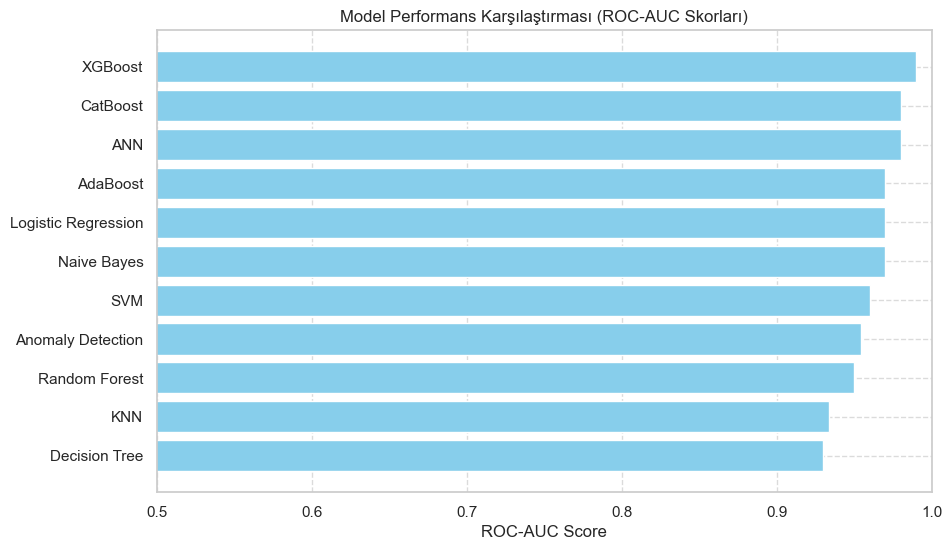

In [154]:
data = {
    'Model': ['Random Forest', 'AdaBoost', 'CatBoost', 'XGBoost', 'SVM', 
              'KNN', 'ANN', 'Logistic Regression', 'Decision Tree', 
              'Naive Bayes', 'Anomaly Detection'],
    'ROC-AUC Score': [0.95, 0.97, 0.98, 0.99, 0.96, 0.9336, 0.98, 0.97, 0.93, 0.97, 0.9543]
}


df = pd.DataFrame(data)


df = df.sort_values(by='ROC-AUC Score', ascending=False)


plt.figure(figsize=(10, 6))
plt.barh(df['Model'], df['ROC-AUC Score'], color='skyblue')
plt.xlabel('ROC-AUC Score')
plt.title('Model Performans Karşılaştırması (ROC-AUC Skorları)')
plt.xlim(0.5, 1)  
plt.grid(True, linestyle='--', alpha=0.7)
plt.gca().invert_yaxis()  
plt.show()



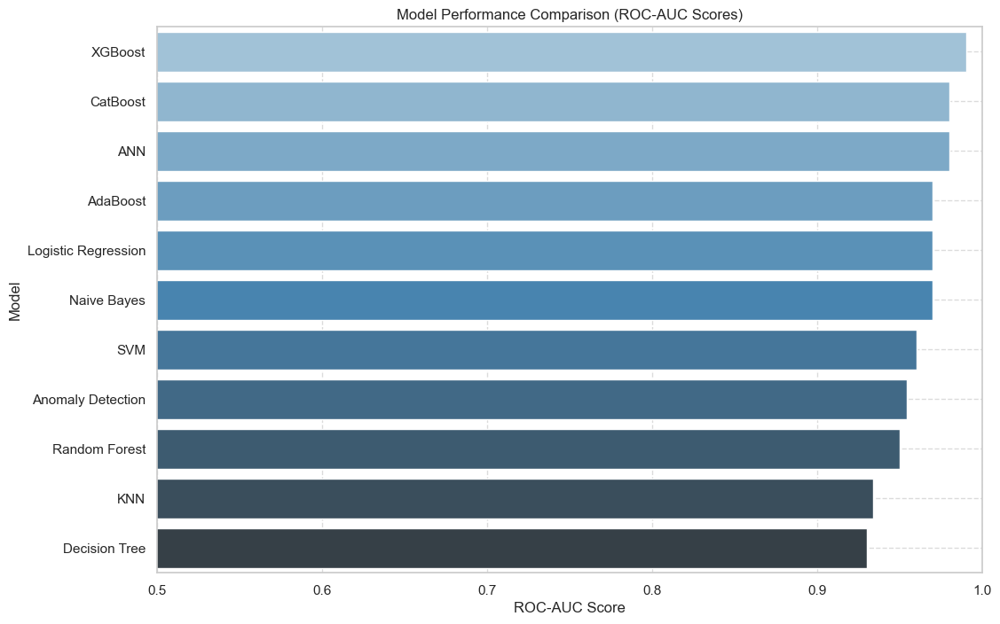

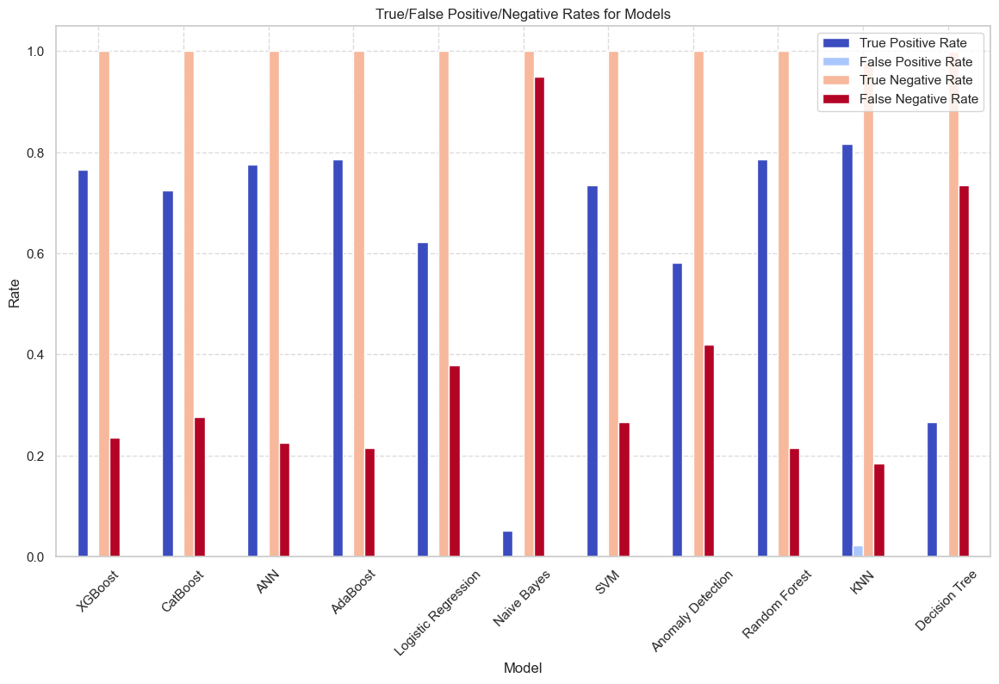

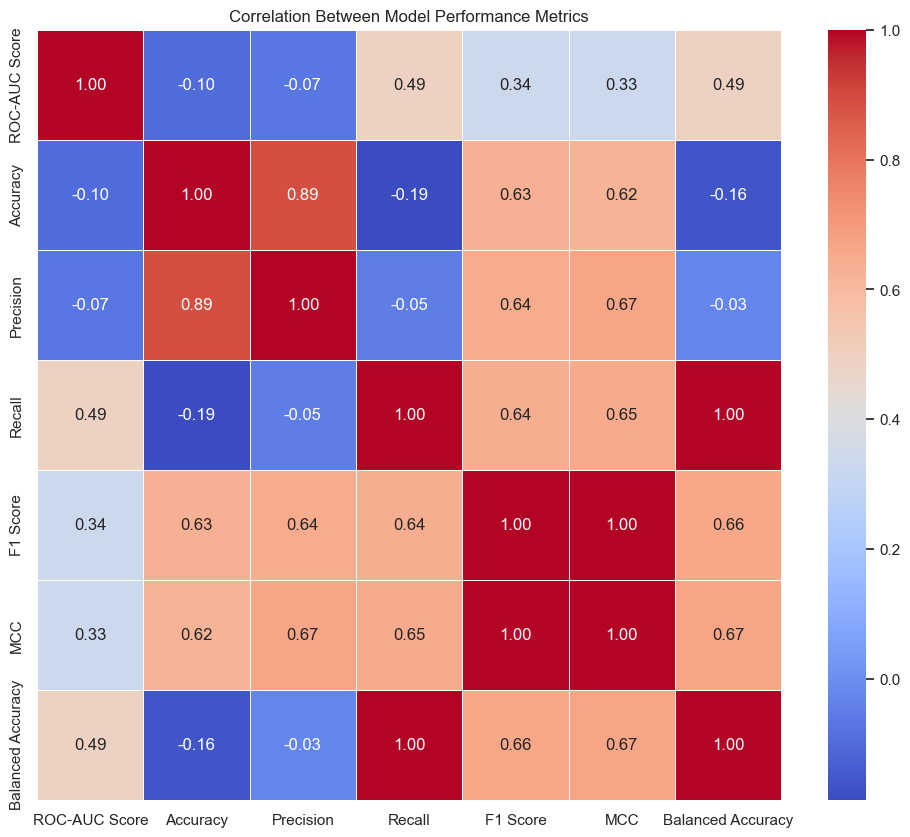

In [157]:
data = {
    'Model': ['Random Forest', 'AdaBoost', 'CatBoost', 'XGBoost', 'SVM', 
              'KNN', 'ANN', 'Logistic Regression', 'Decision Tree', 
              'Naive Bayes', 'Anomaly Detection'],
    'ROC-AUC Score': [0.95, 0.97, 0.98, 0.99, 0.96, 0.9336, 0.98, 0.97, 0.93, 0.97, 0.9543],
    'Accuracy': [0.9996, 0.9993, 0.9996, 0.9996, 0.9993, 0.9984, 0.9994, 0.9991, 0.9995, 0.9778, 0.9983],
    'Precision': [0.9740, 0.8554, 0.9870, 0.9872, 0.9683, 1.0000, 0.9000, 0.8636, 0.9059, 0.0604, 0.5000],
    'Recall': [0.7653, 0.7245, 0.7755, 0.7857, 0.6224, 0.0510, 0.7347, 0.5816, 0.7857, 0.8163, 0.2653],
    'F1 Score': [0.8571, 0.7845, 0.8686, 0.8750, 0.7578, 0.0971, 0.8090, 0.6951, 0.8415, 0.1124, 0.3467],
    'MCC': [0.8632, 0.7869, 0.8747, 0.8805, 0.7760, 0.2257, 0.8129, 0.7084, 0.8434, 0.2184, 0.3634],
    'Balanced Accuracy': [0.8826, 0.8621, 0.8877, 0.8928, 0.8112, 0.5255, 0.8673, 0.7907, 0.8928, 0.8972, 0.6324]
}


df = pd.DataFrame(data)


df = df.sort_values(by='ROC-AUC Score', ascending=False)


plt.figure(figsize=(12, 8))
sns.barplot(x='ROC-AUC Score', y='Model', data=df, palette='Blues_d')
plt.title('Model Performance Comparison (ROC-AUC Scores)')
plt.xlim(0.5, 1)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


rate_data = {
    'Model': df['Model'],
    'True Positive Rate': [0.7653, 0.7245, 0.7755, 0.7857, 0.6224, 0.0510, 0.7347, 0.5816, 0.7857, 0.8163, 0.2653],
    'False Positive Rate': [0.0000, 0.0002, 0.0000, 0.0000, 0.0000, 0.0000, 0.0001, 0.0002, 0.0001, 0.0219, 0.0005],
    'True Negative Rate': [1.0000, 0.9998, 1.0000, 1.0000, 1.0000, 1.0000, 0.9999, 0.9998, 0.9999, 0.9781, 0.9995],
    'False Negative Rate': [0.2347, 0.2755, 0.2245, 0.2143, 0.3776, 0.9490, 0.2653, 0.4184, 0.2143, 0.1837, 0.7347]
}

rate_df = pd.DataFrame(rate_data)


rate_df.set_index('Model').plot(kind='bar', figsize=(14, 8), colormap='coolwarm')
plt.title('True/False Positive/Negative Rates for Models')
plt.ylabel('Rate')
plt.xlabel('Model')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


corr = df.drop('Model', axis=1).corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Between Model Performance Metrics')
plt.show()


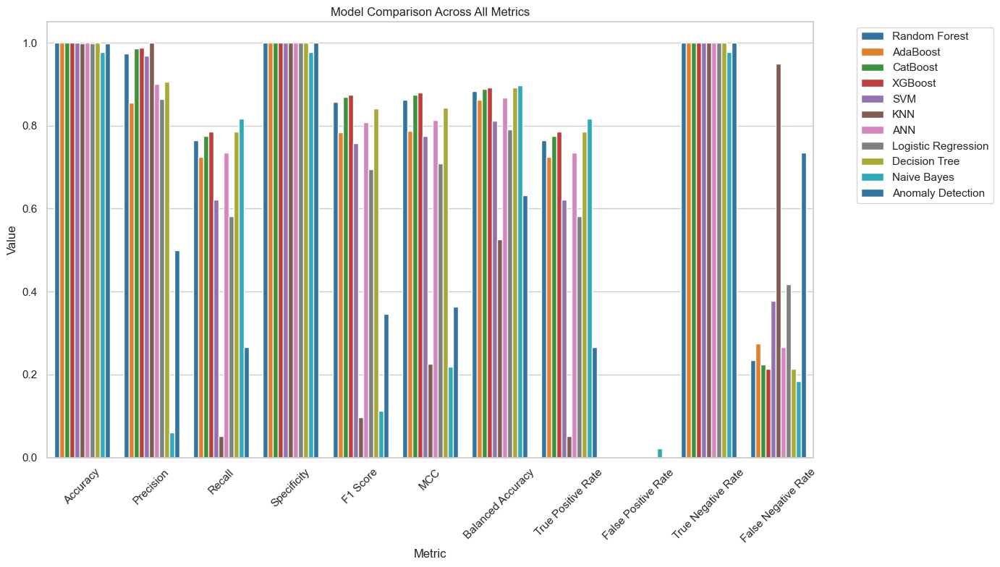

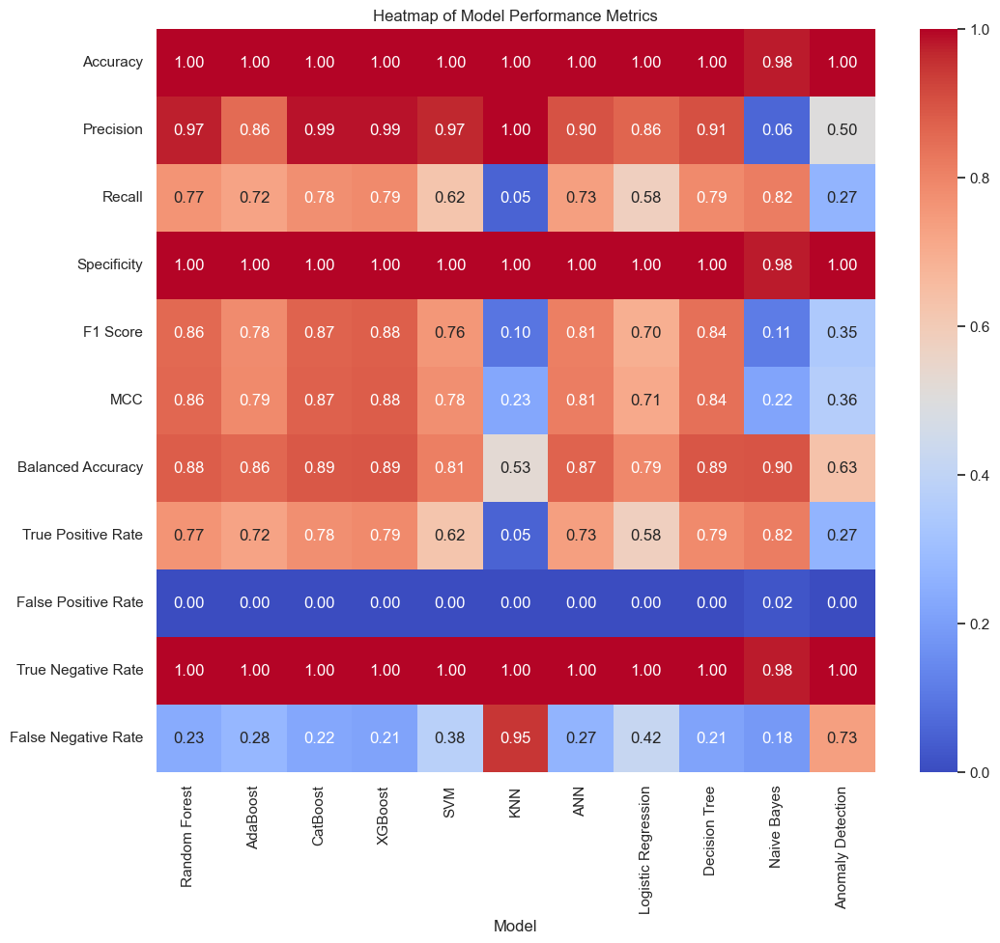

In [158]:
data = {
    'Model': [
        'Random Forest', 'AdaBoost', 'CatBoost', 'XGBoost', 'SVM', 'KNN', 
        'ANN', 'Logistic Regression', 'Decision Tree', 'Naive Bayes', 'Anomaly Detection'
    ],
    'Accuracy': [
        0.9996, 0.9993, 0.9996, 0.9996, 0.9993, 0.9984, 
        0.9994, 0.9991, 0.9995, 0.9778, 0.9983
    ],
    'Precision': [
        0.9740, 0.8554, 0.9870, 0.9872, 0.9683, 1.0000, 
        0.9000, 0.8636, 0.9059, 0.0604, 0.5000
    ],
    'Recall': [
        0.7653, 0.7245, 0.7755, 0.7857, 0.6224, 0.0510, 
        0.7347, 0.5816, 0.7857, 0.8163, 0.2653
    ],
    'Specificity': [
        1.0000, 0.9998, 1.0000, 1.0000, 1.0000, 1.0000, 
        0.9999, 0.9998, 0.9999, 0.9781, 0.9995
    ],
    'F1 Score': [
        0.8571, 0.7845, 0.8686, 0.8750, 0.7578, 0.0971, 
        0.8090, 0.6951, 0.8415, 0.1124, 0.3467
    ],
    'MCC': [
        0.8632, 0.7869, 0.8747, 0.8805, 0.7760, 0.2257, 
        0.8129, 0.7084, 0.8434, 0.2184, 0.3634
    ],
    'Balanced Accuracy': [
        0.8826, 0.8621, 0.8877, 0.8928, 0.8112, 0.5255, 
        0.8673, 0.7907, 0.8928, 0.8972, 0.6324
    ],
    'True Positive Rate': [
        0.7653, 0.7245, 0.7755, 0.7857, 0.6224, 0.0510, 
        0.7347, 0.5816, 0.7857, 0.8163, 0.2653
    ],
    'False Positive Rate': [
        0.0000, 0.0002, 0.0000, 0.0000, 0.0000, 0.0000, 
        0.0001, 0.0002, 0.0001, 0.0219, 0.0005
    ],
    'True Negative Rate': [
        1.0000, 0.9998, 1.0000, 1.0000, 1.0000, 1.0000, 
        0.9999, 0.9998, 0.9999, 0.9781, 0.9995
    ],
    'False Negative Rate': [
        0.2347, 0.2755, 0.2245, 0.2143, 0.3776, 0.9490, 
        0.2653, 0.4184, 0.2143, 0.1837, 0.7347
    ]
}


df = pd.DataFrame(data)


df_melted = df.melt(id_vars='Model', var_name='Metric', value_name='Value')
plt.figure(figsize=(14, 8))
sns.barplot(x='Metric', y='Value', hue='Model', data=df_melted, palette='tab10')
plt.title('Model Comparison Across All Metrics')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


plt.figure(figsize=(12, 10))
sns.heatmap(df.set_index('Model').T, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap of Model Performance Metrics')
plt.show()


# Conclusion


In conclusion, this dissertation has provided a comprehensive analysis of various machine
learning models for credit card fraud detection. The research involved evaluating 11 different
models, including Random Forest, CatBoost, XGBoost, and others, by analysing their
performance metrics across a highly imbalanced dataset.
Among the models studied, XGBoost consistently demonstrated the strongest performance
across key metrics such as Accuracy, Precision, Recall, F1 Score, and Balanced Accuracy. Its
ability to accurately identify fraudulent transactions while minimizing false positives makes it
an excellent candidate for practical deployment in fraud detection systems. The model's
superior balance between correctly identifying fraud and reducing false alarms underscores its
robustness for real-world applications.
However, the study also identified limitations in some models. While Random Forest and
CatBoost also showed high effectiveness, they occasionally struggled with recall, indicating
that certain fraudulent transactions could be missed. Other models, like K-Nearest Neighbours
and Anomaly Detection, faced challenges with the dataset's high dimensionality and
imbalance, leading to less effective performance.
A critical aspect of the analysis was the evaluation of true and false positive rates, highlighting
the importance of balancing precision and recall. High precision is essential to avoid false
positives, which can cause unnecessary alerts, while a high recall ensures that actual fraud cases
are not overlooked. The findings emphasize the need for a well-rounded approach to model
evaluation that considers both aspects to optimize fraud detection.
Future research should explore hybrid approaches that combine the strengths of different
models and further investigate methods to improve the handling of class imbalance.
Additionally, the integration of advanced ensemble techniques and real-time data processing
could enhance the accuracy and responsiveness of fraud detection systems. This study
contributes valuable insights into the application of machine learning for securing financial
transactions, providing a solid foundation for further advancements in this critical area.